In [79]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from scipy.stats import pearsonr, spearmanr
from scipy import stats
from IPython.display import display, HTML
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.model_selection import train_test_split
from datetime import datetime
from statsmodels.formula.api import ols
from statsmodels.stats.api import anova_lm
from IPython.display import display, HTML
from wordcloud import WordCloud
from nltk.corpus import stopwords
import nltk
from collections import Counter
import plotly.express as px
import country_converter as coco
nltk.download('stopwords')
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.precision', 3)
display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("<style>div.output_scroll { height: unset; }</style>"))
display(HTML("<style>pre { white-space: pre !important; }</style>"))
import warnings
warnings.filterwarnings('ignore')



[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/merlekuehlenborg/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [80]:
#loading the dataset
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)

df_trustpilot = pd.read_csv('data/data_trustpilot.csv.gz', encoding='utf-8')

display(df_trustpilot.head())



,rating,location,username,number_reviews,verification,repeat_reviewer,repeat_reviewer_encoded,company,text,text_processed,text_length,text_word_length,Sentiment_Blob,Sentiment_Blob_cat,Sentiment_VADER,Sentiment_VADER_cat,subject,subject_processed,subject_length,subject_word_length,answer,answer_processed,answered_encoded,date_of_experience,date_posted,local_date_posted,month_local,local_hour,time_of_day,day_of_week_posted,day_type,days_between_experience_and_post,review_time,review_time_encoded
0,5,GB,Dest Iny,7,Not Verified,repeat,1,Asda,"ST2 9AL Had an issue with the scan, an employee named Rose helped me. I then had another issue and then a bag issue. Rose was very friendly, helpful and even though she self serve area was packed, she still managed to be very helpful. This is a clicky store, with staff who are clicky, chat a lot and some can look down on you. This is why I wanted to write about Rose who was the opposite.",st2 9al issue scan employee named rose helped another issue bag issue rose friendly helpful even though self serve area packed still managed helpful clicky store staff clicky chat lot look wanted write rose opposite,215,35,0.435,4.0,0.832,5,ST2 9AL,st2 9al,7,2,0,0,0,2024-11-11,2024-11-15 11:42:09,2024-11-15,11,10,Business Hours,4,Business Day,4,late_review,0
1,1,GB,Paula Gray,4,Not Verified,repeat,1,Asda,Your call centre staff are not the most helpful. Several times I have tried to log into amend my online shop ahead of delivery - keeps telling me something went wrong. Who in the right mind does a upgrade during peak time!!! When I asked a question the call handler could not answer she claimed it was a bad line - how convenient!! Will be taking my online shopping experience elsewhere I think,call centre staff helpful several times tried log amend online shop ahead delivery keeps telling something went wrong right mind upgrade peak time asked question call handler could answer claimed bad line convenient taking online shopping experience elsewhere think,265,39,-0.229,2.0,-0.586,2,Your call centre staff are not the most…,call centre staff,17,3,0,0,0,2024-11-13,2024-11-13 18:26:52,2024-11-13,11,17,Business Hours,2,Business Day,0,quick_review,1
2,1,GB,Neil Dodds,4,Not Verified,repeat,1,Asda,"Just received my order from asda accrington, ordered 2 rump steaks, replaced items with asda beef sirloin, but only 1 steak arrived. When shopping in asda accrington too many staff talking to colleagues instead of focusing on there work, I hope the CEO or someone in authority reads this, asda going down hill big time",received order asda accrington ordered 2 rump steaks replaced items asda beef sirloin 1 steak arrived shopping asda accrington many staff talking colleagues instead focusing work hope ceo someone authority reads asda going hill big time,236,36,0.250,4.0,0.494,4,Just received my order from asda…,received order asda,19,3,0,0,0,2024-11-14,2024-11-14 21:20:00,2024-11-14,11,20,Evening,3,Business Day,0,quick_review,1
3,1,GB,Julie Currey,5,Not Verified,repeat,1,Asda,"Just had an online home delivery dropped off, there were substitutes items which I didn’t want so advised the driver of this, the substitutes he said where not on the van, he couldn’t make a note of this or refund the items because the system was down, I was unable to do it in the app due to the same “technical issues” to add insult to injury the bread was stale the the bag of bananas rotten, and now I have to spend hours trying to rectify tomorrow. How ironic that channel 5 had a program on this evening called …. ASDA, where did it all go wrong. Sainsbury’s knock spots off Asda’s home delivery. Sadly Asda have just lost a customer!",online home delivery dropped substitutes items didnt want advised driver substitutes said van couldnt make note refund items system unable app due technical issues add insult injury bread stale bag bananas rotten spend hours trying rectify tomorrow ironic channel 5 program evening called asda go wrong sainsburys knock spots 

In [81]:
#First check
df_trustpilot['local_date_posted'] = pd.to_datetime(df_trustpilot['local_date_posted'])
df_trustpilot['date_of_experience'] = pd.to_datetime(df_trustpilot['date_of_experience'])
df_trustpilot['date_posted'] = pd.to_datetime(df_trustpilot['date_posted'])

print(df_trustpilot.columns)
display(df_trustpilot.info())

Index(['rating', 'location', 'username', 'number_reviews', 'verification',
       'repeat_reviewer', 'repeat_reviewer_encoded', 'company', 'text',
       'text_processed', 'text_length', 'text_word_length', 'Sentiment_Blob',
       'Sentiment_Blob_cat', 'Sentiment_VADER', 'Sentiment_VADER_cat',
       'subject', 'subject_processed', 'subject_length', 'subject_word_length',
       'answer', 'answer_processed', 'answered_encoded', 'date_of_experience',
       'date_posted', 'local_date_posted', 'month_local', 'local_hour',
       'time_of_day', 'day_of_week_posted', 'day_type',
       'days_between_experience_and_post', 'review_time',
       'review_time_encoded'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100621 entries, 0 to 100620
Data columns (total 34 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   rating                            100621 non-nul

None

STAGE 1 - UNIVARIATE ANALYSIS


Analyzing binary column: repeat_reviewer

Distribution:
one-time: 55,004 (54.7%)
repeat: 45,617 (45.3%)


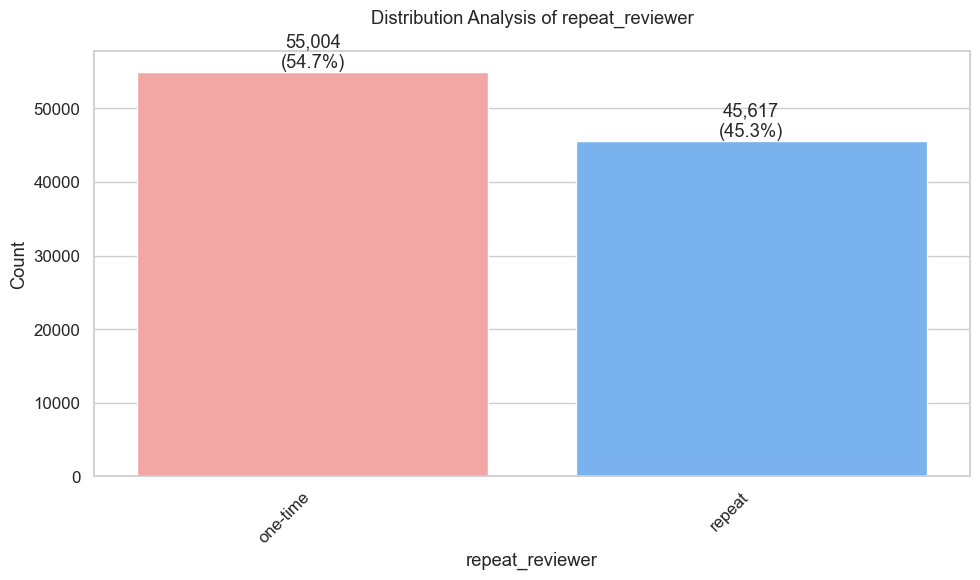


Analyzing binary column: repeat_reviewer_encoded

Distribution:
0: 55,004 (54.7%)
1: 45,617 (45.3%)


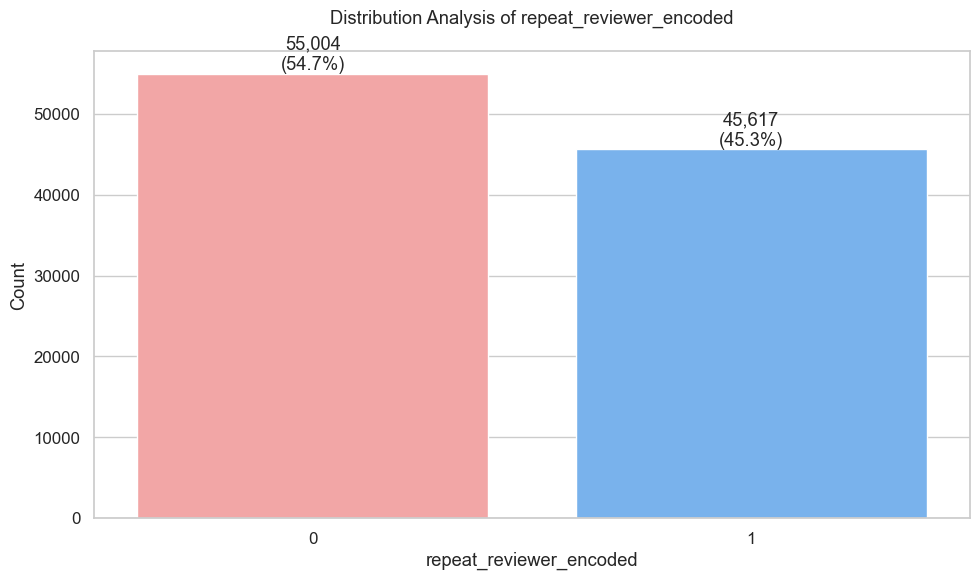


Analyzing binary column: answered_encoded

Distribution:
0: 74,527 (74.1%)
1: 26,094 (25.9%)


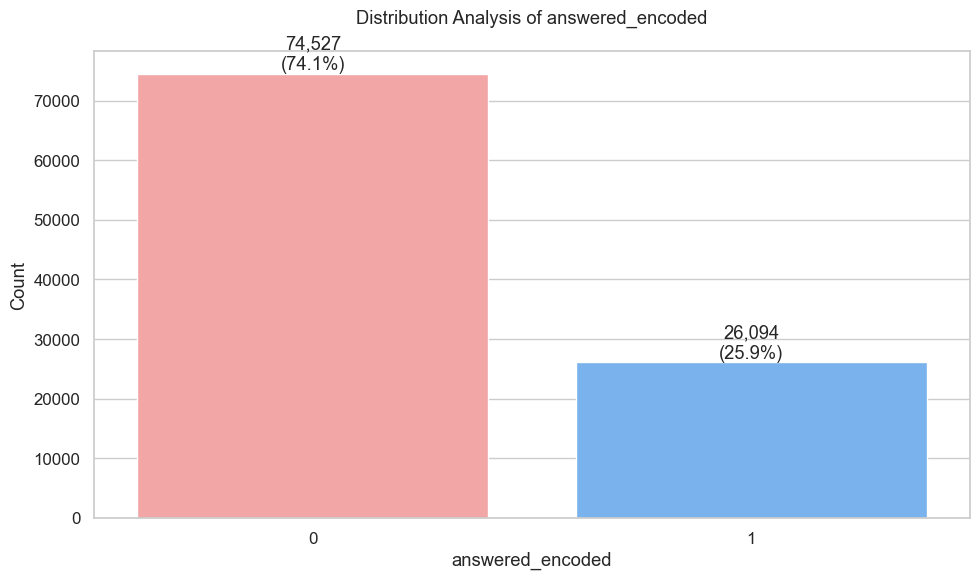


Analyzing binary column: day_type

Distribution:
Business Day: 76,747 (76.3%)
Weekend: 23,874 (23.7%)


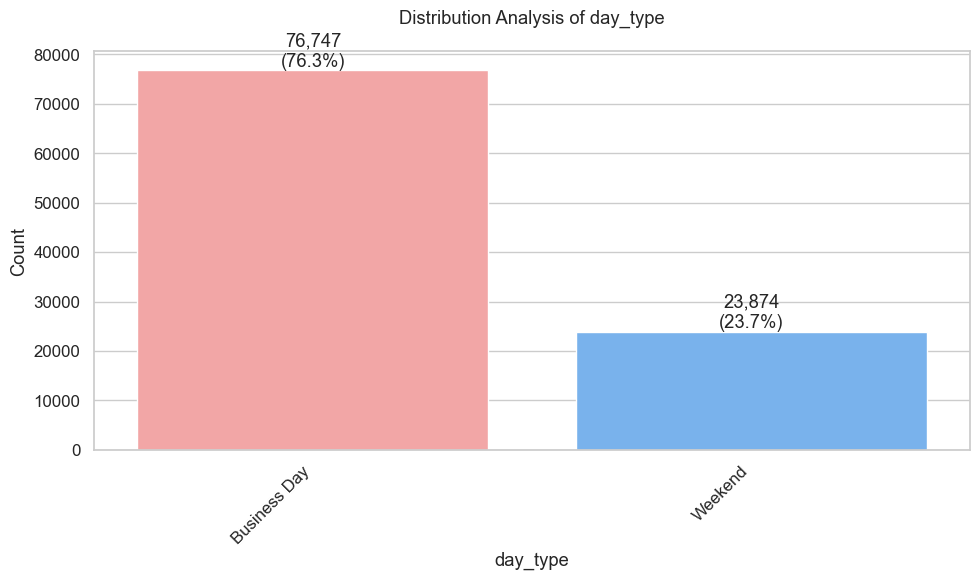


Analyzing binary column: review_time

Distribution:
quick_review: 77,889 (77.4%)
late_review: 22,732 (22.6%)


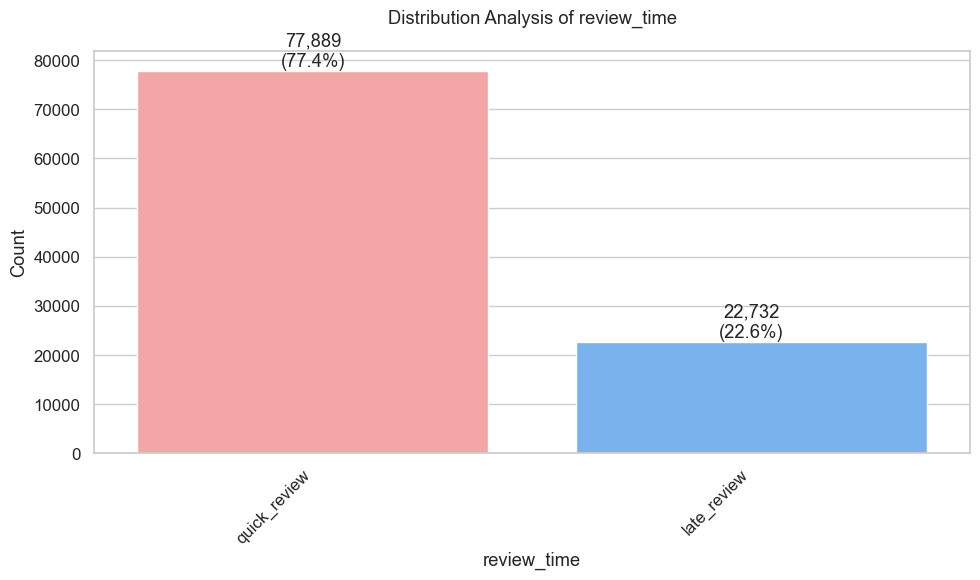


Analyzing binary column: review_time_encoded

Distribution:
1: 77,889 (77.4%)
0: 22,732 (22.6%)


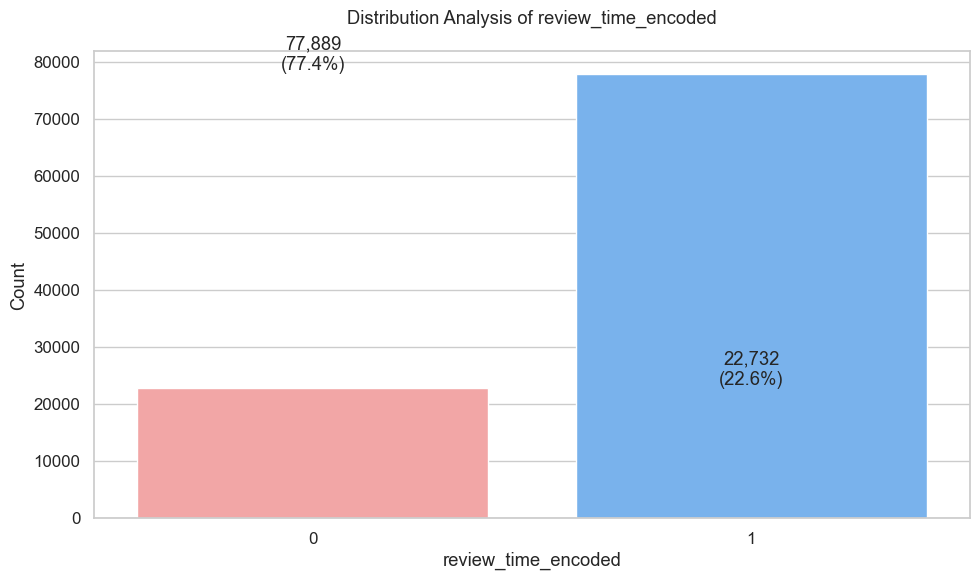

In [82]:
# Univariate analysis on binary columns
binary_columns = []
for column in df_trustpilot.columns:
    if len(df_trustpilot[column].unique()) == 2:
        binary_columns.append(column)

def analyze_binary_columns(df, binary_columns):
    sns.set_theme(style="whitegrid", palette="husl", font_scale=1.1)
    
    for column in binary_columns:
        print(f"\nAnalyzing binary column: {column}")
        print("="*50)
        
        value_counts = df[column].value_counts()
        percentages = df[column].value_counts(normalize=True) * 100
        
        # Display distributions
        print("\nDistribution:")
        for value, count in value_counts.items():
            pct = percentages[value]
            print(f"{value}: {count:,} ({pct:.1f}%)")
        
        plt.figure(figsize=(10, 6))
        # Create bar plot
        ax = sns.barplot(x=df[column].value_counts().index, 
                        y=df[column].value_counts().values,
                        palette=['#FF9999', '#66B2FF'])
        for i, v in enumerate(value_counts):
            ax.text(i, v, f'{v:,}\n({percentages[value_counts.index[i]]:.1f}%)', 
                   ha='center', va='bottom')
    
        plt.title(f'Distribution Analysis of {column}', pad=20)
        plt.xlabel(column)
        plt.ylabel('Count')
        
        if not np.issubdtype(df[column].dtype, np.number):
            plt.xticks(rotation=45, ha='right')

        plt.tight_layout()
        plt.show()


analyze_binary_columns(df_trustpilot, binary_columns)

SENTIMENT SCORES ANALYSIS
Basic Statistics:
TextBlob Sentiment Statistics:
count    100621.000
mean          0.190
std           0.309
min          -1.000
25%           0.000
50%           0.170
75%           0.400
max           1.000
Name: Sentiment_Blob, dtype: float64
VADER Sentiment Statistics:
count    100621.000
mean          0.307
std           0.533
min          -0.997
25%           0.000
50%           0.440
75%           0.765
max           0.999
Name: Sentiment_VADER, dtype: float64


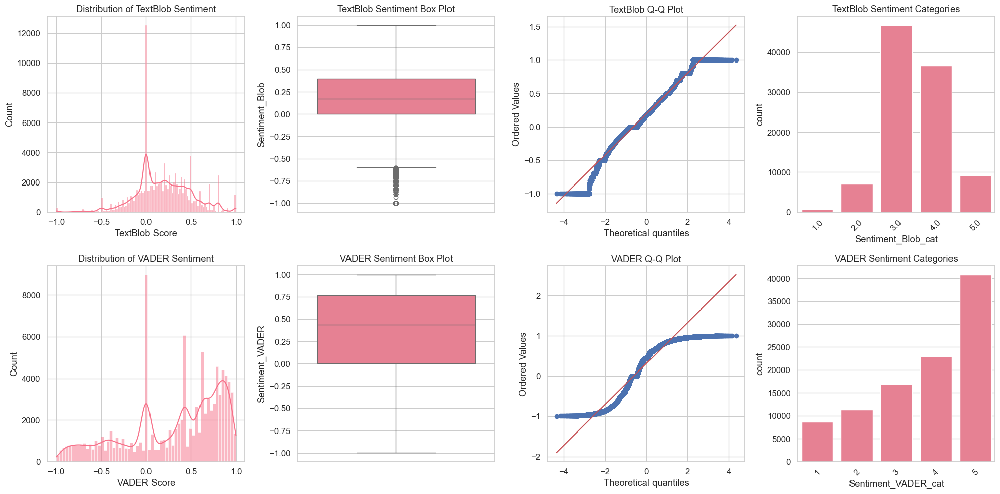

TextBlob Sentiment Category Distribution (%):
Sentiment_Blob_cat
3.0    46.6
4.0    36.6
5.0     9.1
2.0     7.1
1.0     0.7
Name: proportion, dtype: float64
VADER Sentiment Category Distribution (%):
Sentiment_VADER_cat
5    40.5
4    22.8
3    16.8
2    11.3
1     8.6
Name: proportion, dtype: float64


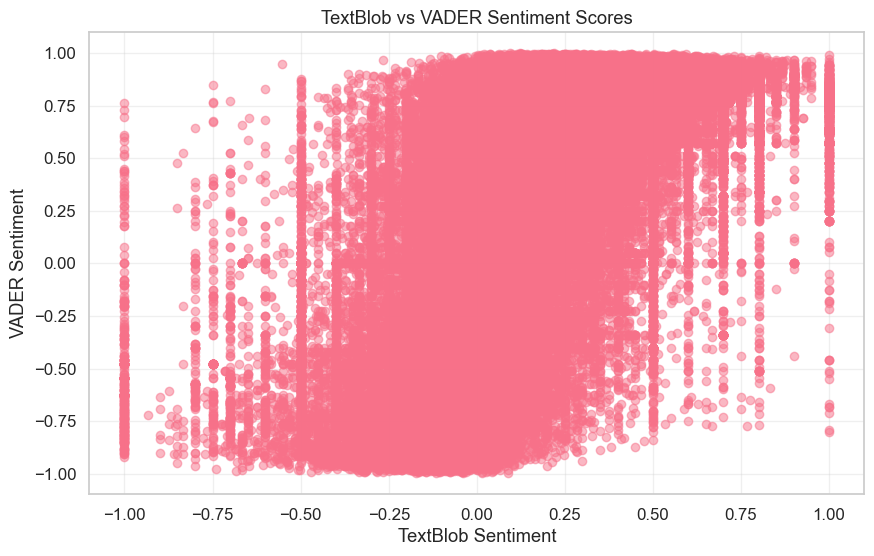

Correlation between TextBlob and VADER sentiment scores: 0.605


In [83]:
#Univariate analysis of sentiment scores

def analyze_sentiment_distributions():
    print("SENTIMENT SCORES ANALYSIS")
    
    print("Basic Statistics:")
    print("TextBlob Sentiment Statistics:")
    print(df_trustpilot['Sentiment_Blob'].describe().round(3))
    print("VADER Sentiment Statistics:")
    print(df_trustpilot['Sentiment_VADER'].describe().round(3))
    
    # Distribution plots
    fig = plt.figure(figsize=(20, 10))
    
    # TextBlob distributions
    plt.subplot(241)
    sns.histplot(data=df_trustpilot, x='Sentiment_Blob', kde=True)
    plt.title('Distribution of TextBlob Sentiment')
    plt.xlabel('TextBlob Score')
    
    plt.subplot(242)
    sns.boxplot(y=df_trustpilot['Sentiment_Blob'])
    plt.title('TextBlob Sentiment Box Plot')
    
    plt.subplot(243)
    stats.probplot(df_trustpilot['Sentiment_Blob'], dist="norm", plot=plt)
    plt.title('TextBlob Q-Q Plot')
    
    plt.subplot(244)
    sns.countplot(data=df_trustpilot, x='Sentiment_Blob_cat')
    plt.title('TextBlob Sentiment Categories')
    plt.xticks(rotation=45)
    
    # VADER distributions
    plt.subplot(245)
    sns.histplot(data=df_trustpilot, x='Sentiment_VADER', kde=True)
    plt.title('Distribution of VADER Sentiment')
    plt.xlabel('VADER Score')
    
    plt.subplot(246)
    sns.boxplot(y=df_trustpilot['Sentiment_VADER'])
    plt.title('VADER Sentiment Box Plot')
    
    plt.subplot(247)
    stats.probplot(df_trustpilot['Sentiment_VADER'], dist="norm", plot=plt)
    plt.title('VADER Q-Q Plot')
    
    plt.subplot(248)
    sns.countplot(data=df_trustpilot, x='Sentiment_VADER_cat')
    plt.title('VADER Sentiment Categories')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    # Category distributions
    print("TextBlob Sentiment Category Distribution (%):")
    print(df_trustpilot['Sentiment_Blob_cat'].value_counts(normalize=True).round(3) * 100)
    
    print("VADER Sentiment Category Distribution (%):")
    print(df_trustpilot['Sentiment_VADER_cat'].value_counts(normalize=True).round(3) * 100)
    
    # Compare sentiment metrics
    plt.figure(figsize=(10, 6))
    plt.scatter(df_trustpilot['Sentiment_Blob'], df_trustpilot['Sentiment_VADER'], alpha=0.5)
    plt.xlabel('TextBlob Sentiment')
    plt.ylabel('VADER Sentiment')
    plt.title('TextBlob vs VADER Sentiment Scores')
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Calculate correlation between sentiment metrics
    correlation = df_trustpilot['Sentiment_Blob'].corr(df_trustpilot['Sentiment_VADER'])
    print(f"Correlation between TextBlob and VADER sentiment scores: {correlation:.3f}")

analyze_sentiment_distributions()


In [84]:
sentiment_columns = ['Sentiment_Blob_cat','Sentiment_VADER', 'Sentiment_VADER_cat','Sentiment_Blob']
text_based_columns = ['text', 'text_processed', 'subject', 'subject_processed', 'answer', 'answer_processed']
administrative_columns = ['username']
univariate_pending_columns = list(set(df_trustpilot.columns) - set(binary_columns) - set(sentiment_columns) - set(text_based_columns) - set(administrative_columns))

print("Pending columns:", univariate_pending_columns)

display(df_trustpilot[univariate_pending_columns].head())

Pending columns: ['location', 'text_word_length', 'verification', 'local_date_posted', 'month_local', 'date_posted', 'number_reviews', 'company', 'time_of_day', 'subject_length', 'local_hour', 'days_between_experience_and_post', 'day_of_week_posted', 'date_of_experience', 'rating', 'subject_word_length', 'text_length']


,location,text_word_length,verification,local_date_posted,month_local,date_posted,number_reviews,company,time_of_day,subject_length,local_hour,days_between_experience_and_post,day_of_week_posted,date_of_experience,rating,subject_word_length,text_length
0,GB,35,Not Verified,2024-11-15,11,2024-11-15 11:42:09,7,Asda,Business Hours,7,10,4,4,2024-11-11,5,2,215
1,GB,39,Not Verified,2024-11-13,11,2024-11-13 18:26:52,4,Asda,Business Hours,17,17,0,2,2024-11-13,1,3,265
2,GB,36,Not Verified,2024-11-14,11,2024-11-14 21:20:00,4,Asda,Evening,19,20,0,3,2024-11-14,1,3,236
3,GB,56,Not Verified,2024-11-13,11,2024-11-13 23:34:32,5,Asda,Evening,13,22,0,2,2024-11-13,1,3,370
4,GB,23,Not Verified,2024-11-10,11,2024-11-10 22:10:35,3,Asda,Evening,13,21,40,6,2024-10-01,2,2,152


Statistical analysis for column: company
Unique values: 19
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
Quicken: 26,762 (26.6%)
Inkfarm.com: 21,766 (21.6%)
Asda: 12,552 (12.5%)
SteelSeries: 12,395 (12.3%)
SCUFGaming: 10,367 (10.3%)
Rebtel: 4,497 (4.5%)
LegalMatch: 2,008 (2.0%)
Solis: 1,772 (1.8%)
BeenVerified: 1,547 (1.5%)
FreedomPop: 1,296 (1.3%)
Visualizations for company


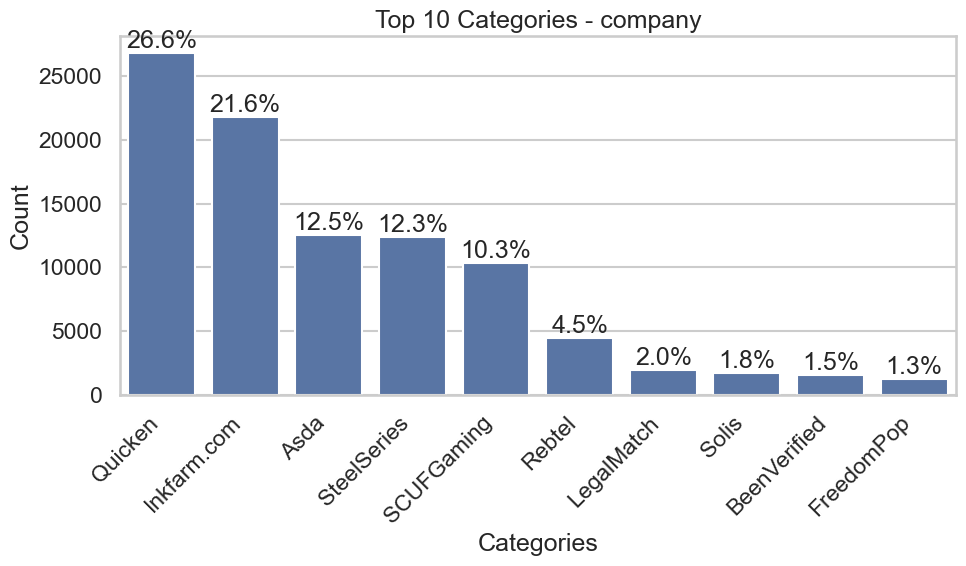

Statistical analysis for column: date_of_experience
Unique values: 4613
Missing values: 0 (0.00%)
Temporal Range:
Start: 2008-12-16 00:00:00
End: 2024-11-15 00:00:00
Range: 5813 days 00:00:00
Visualizations for date_of_experience


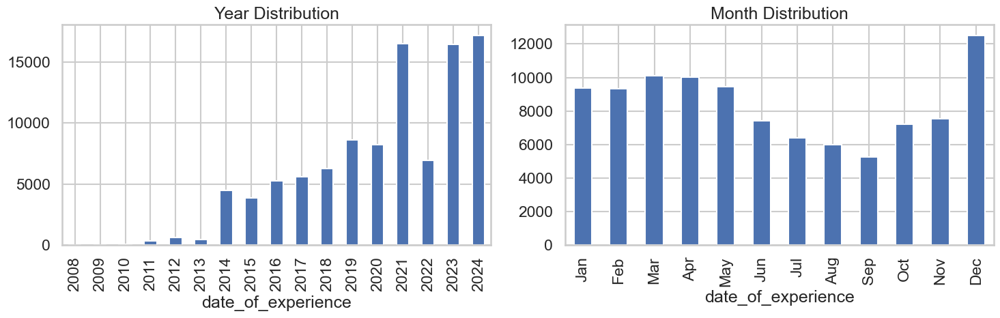

Statistical analysis for column: date_posted
Unique values: 100490
Missing values: 0 (0.00%)
Temporal Range:
Start: 2008-12-16 16:45:50
End: 2024-11-15 18:46:49
Range: 5813 days 02:00:59
Visualizations for date_posted


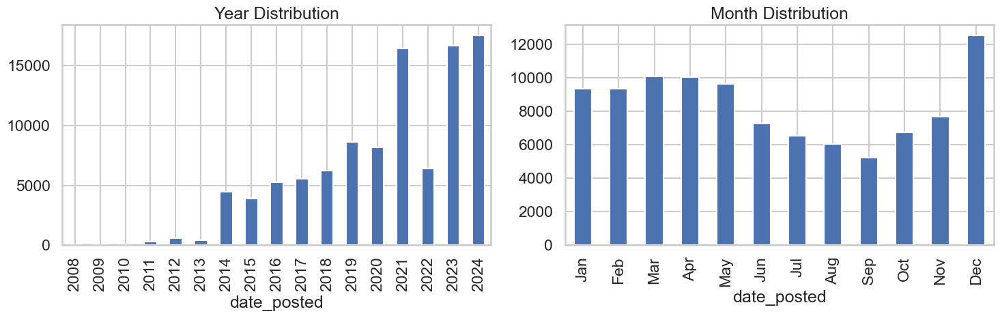

Statistical analysis for column: day_of_week_posted
Unique values: 7
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean          2.816
std           1.938
min           0.000
25%           1.000
50%           3.000
75%           4.000
max           6.000
Name: day_of_week_posted, dtype: float64
Outliers: 0 (0.00%)
Visualizations for day_of_week_posted


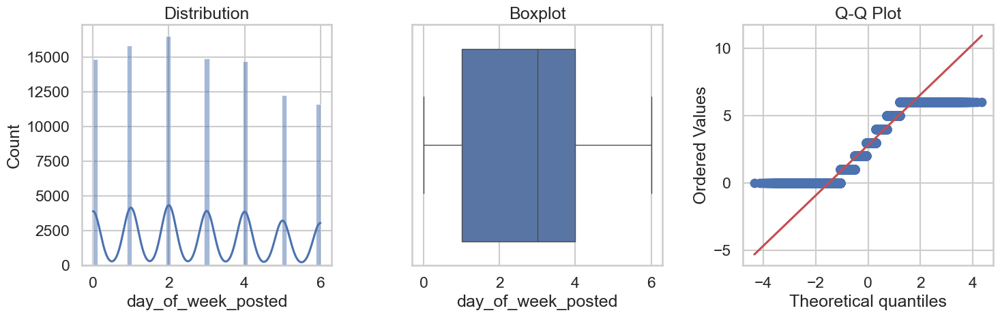

Statistical analysis for column: days_between_experience_and_post
Unique values: 376
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean          3.766
std          35.173
min          -1.000
25%           0.000
50%           0.000
75%           0.000
max        2744.000
Name: days_between_experience_and_post, dtype: float64
Outliers: 34194 (33.98%)
Visualizations for days_between_experience_and_post


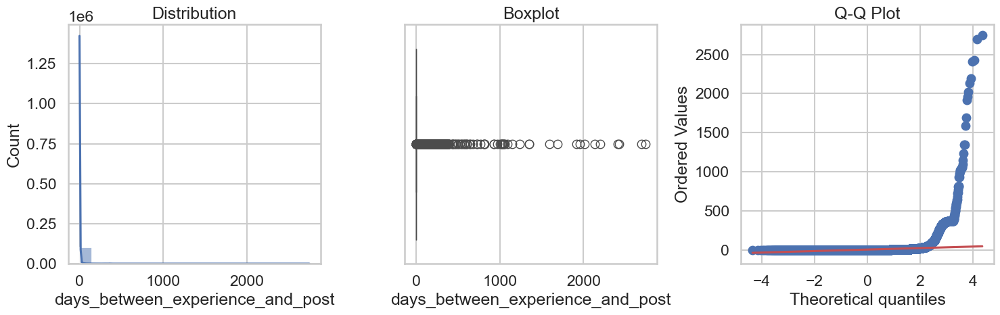

Statistical analysis for column: local_date_posted
Unique values: 4604
Missing values: 0 (0.00%)
Temporal Range:
Start: 2008-12-16 00:00:00
End: 2024-11-15 00:00:00
Range: 5813 days 00:00:00
Visualizations for local_date_posted


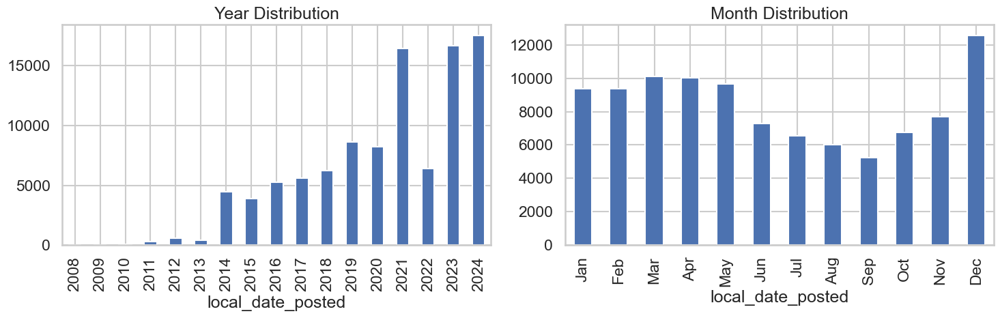

Statistical analysis for column: local_hour
Unique values: 24
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean         12.685
std           5.192
min           0.000
25%           9.000
50%          12.000
75%          17.000
max          23.000
Name: local_hour, dtype: float64
Outliers: 0 (0.00%)
Visualizations for local_hour


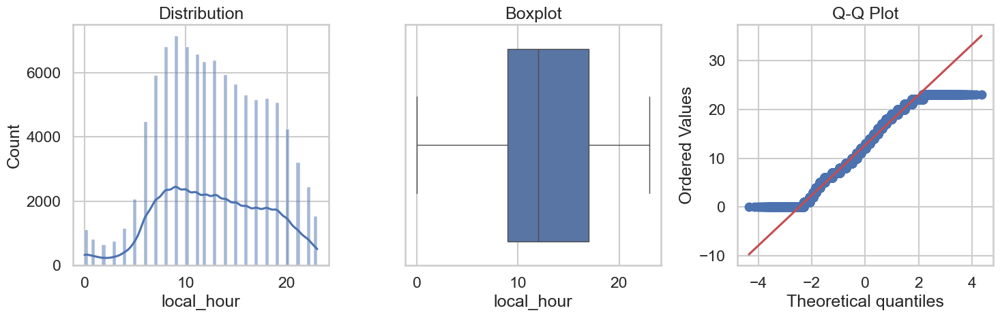

Statistical analysis for column: location
Unique values: 172
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
US: 71,106 (70.7%)
GB: 16,696 (16.6%)
CA: 3,326 (3.3%)
DE: 957 (1.0%)
AU: 653 (0.6%)
NL: 559 (0.6%)
FR: 495 (0.5%)
SE: 325 (0.3%)
IT: 277 (0.3%)
IE: 275 (0.3%)
Visualizations for location


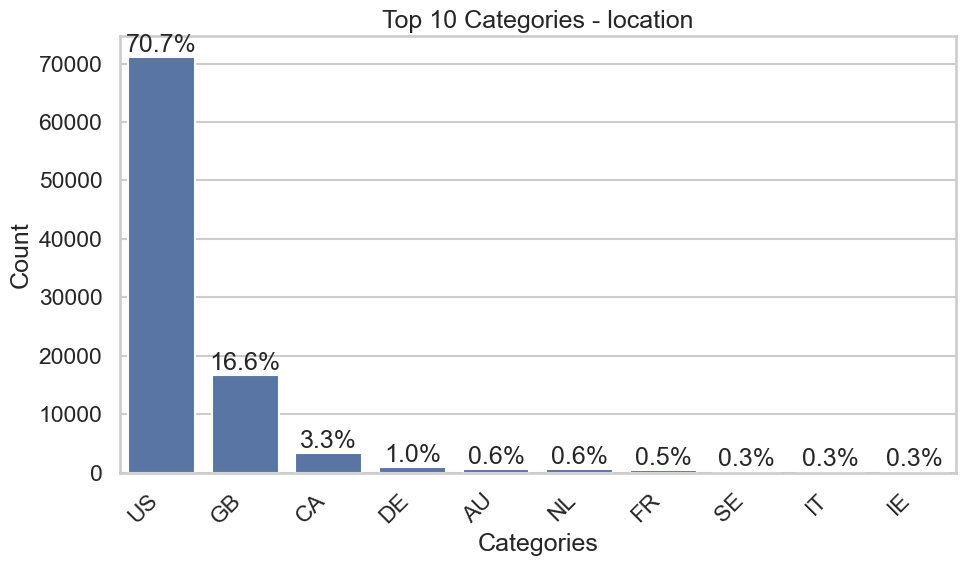

Statistical analysis for column: month_local
Unique values: 12
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean          6.306
std           3.658
min           1.000
25%           3.000
50%           6.000
75%          10.000
max          12.000
Name: month_local, dtype: float64
Outliers: 0 (0.00%)
Visualizations for month_local


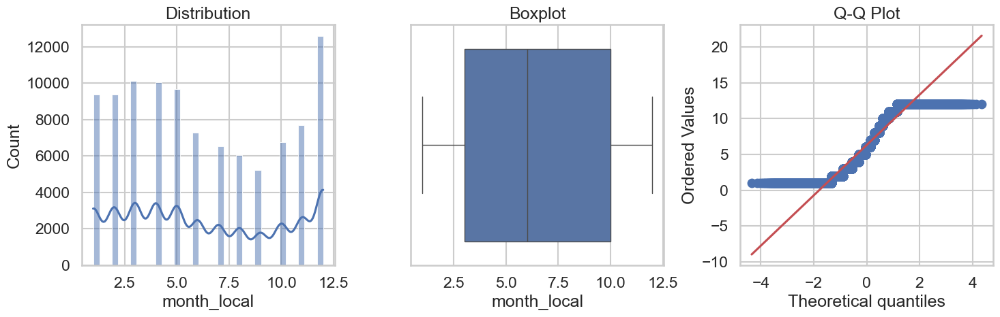

Statistical analysis for column: number_reviews
Unique values: 164
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean          3.275
std           8.465
min           1.000
25%           1.000
50%           1.000
75%           3.000
max         592.000
Name: number_reviews, dtype: float64
Outliers: 8621 (8.57%)
Visualizations for number_reviews


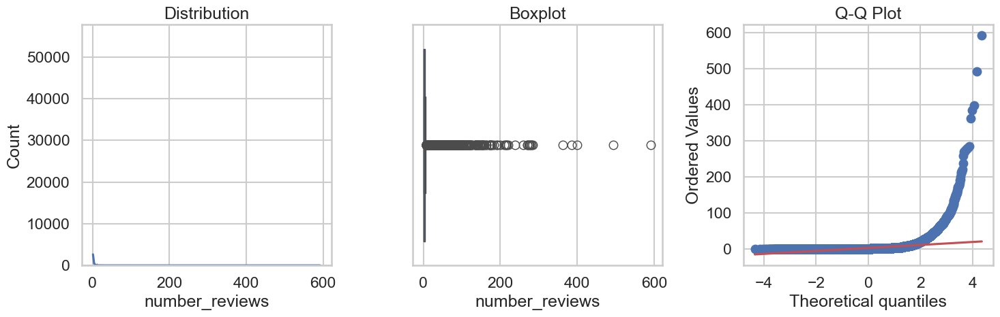

Statistical analysis for column: rating
Unique values: 5
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean          3.498
std           1.665
min           1.000
25%           2.000
50%           4.000
75%           5.000
max           5.000
Name: rating, dtype: float64
Outliers: 0 (0.00%)
Visualizations for rating


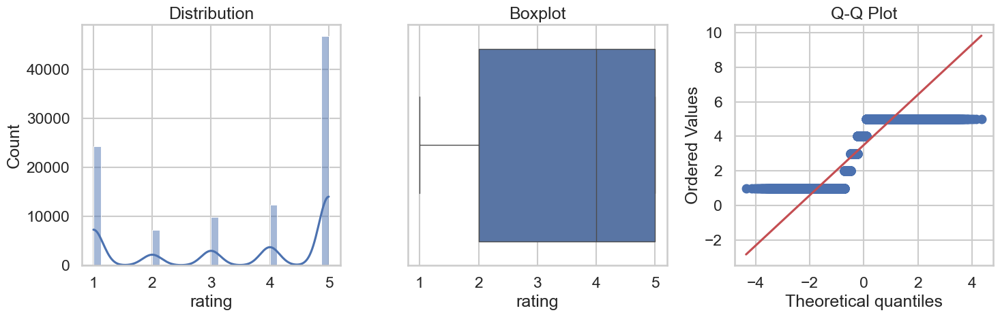

Statistical analysis for column: subject_length
Unique values: 146
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean         22.810
std          10.569
min           0.000
25%          16.000
50%          22.000
75%          28.000
max         161.000
Name: subject_length, dtype: float64
Outliers: 2734 (2.72%)
Visualizations for subject_length


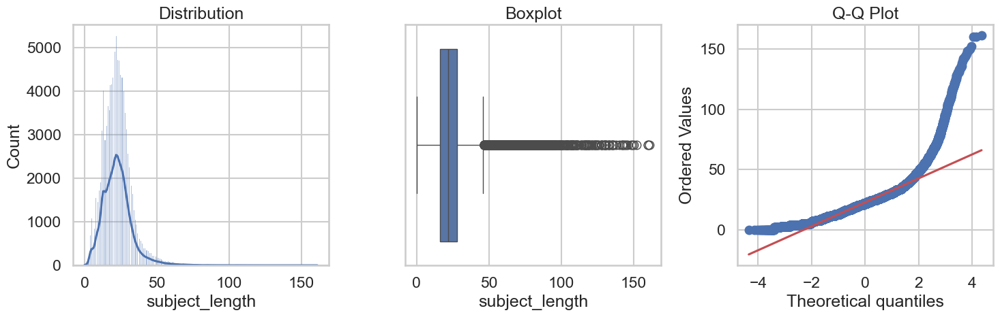

Statistical analysis for column: subject_word_length
Unique values: 28
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean          3.428
std           1.509
min           0.000
25%           2.000
50%           3.000
75%           4.000
max          28.000
Name: subject_word_length, dtype: float64
Outliers: 1614 (1.60%)
Visualizations for subject_word_length


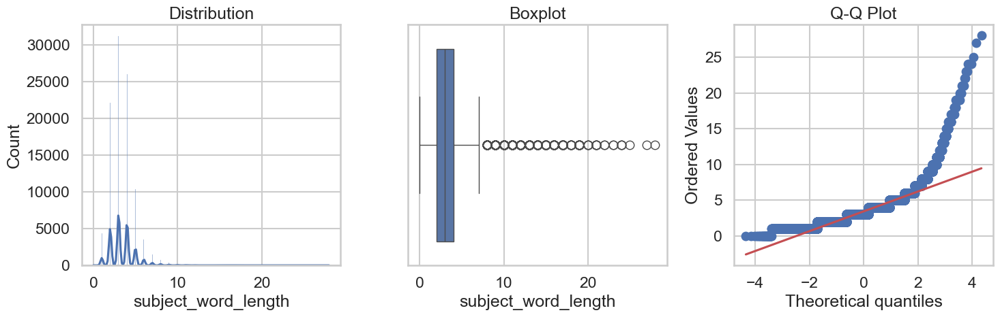

Statistical analysis for column: text_length
Unique values: 1642
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean        169.408
std         210.433
min           0.000
25%          56.000
50%         105.000
75%         204.000
max        8017.000
Name: text_length, dtype: float64
Outliers: 7449 (7.40%)
Visualizations for text_length


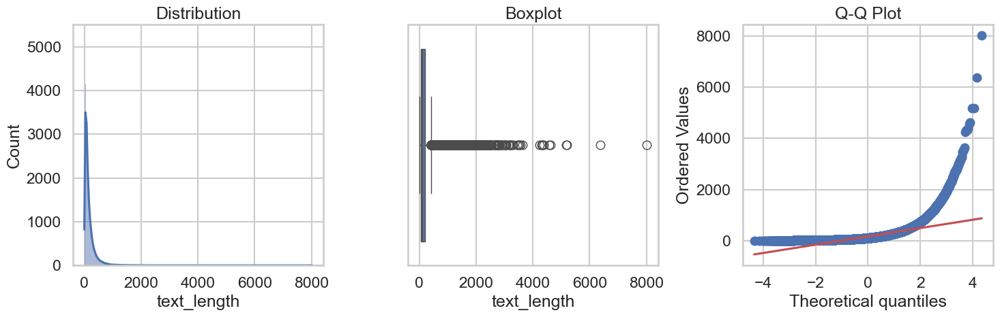

Statistical analysis for column: text_word_length
Unique values: 375
Missing values: 0 (0.00%)
Descriptive Statistics:
count    100621.000
mean         24.870
std          30.951
min           0.000
25%           8.000
50%          15.000
75%          30.000
max        1089.000
Name: text_word_length, dtype: float64
Outliers: 7366 (7.32%)
Visualizations for text_word_length


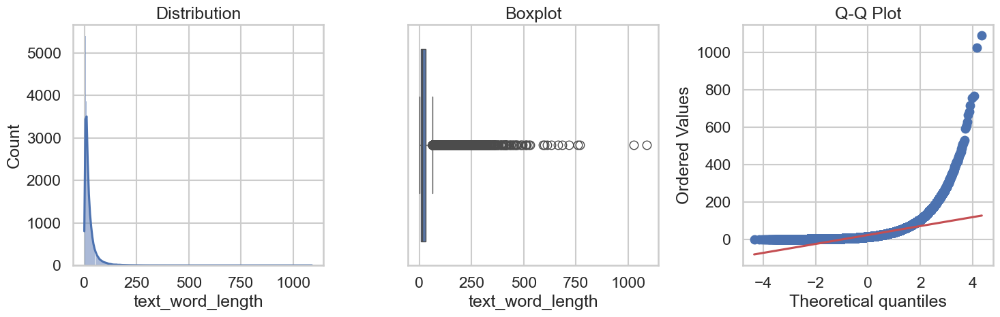

Statistical analysis for column: time_of_day
Unique values: 4
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
Business Hours: 55,286 (54.9%)
Evening: 20,136 (20.0%)
Morning: 17,177 (17.1%)
Night: 8,022 (8.0%)
Visualizations for time_of_day


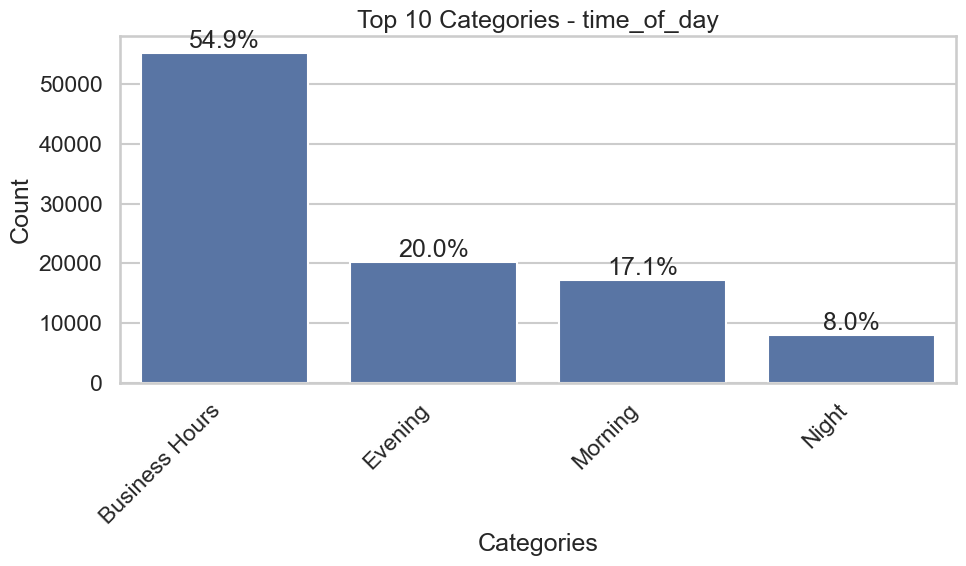

Statistical analysis for column: verification
Unique values: 5
Missing values: 0 (0.00%)
Top 10 Categories (Count and Percentage):
Verified: 61,940 (61.6%)
Not Verified: 24,936 (24.8%)
Invited: 13,711 (13.6%)
Redirected: 33 (0.0%)
Merged: 1 (0.0%)
Visualizations for verification


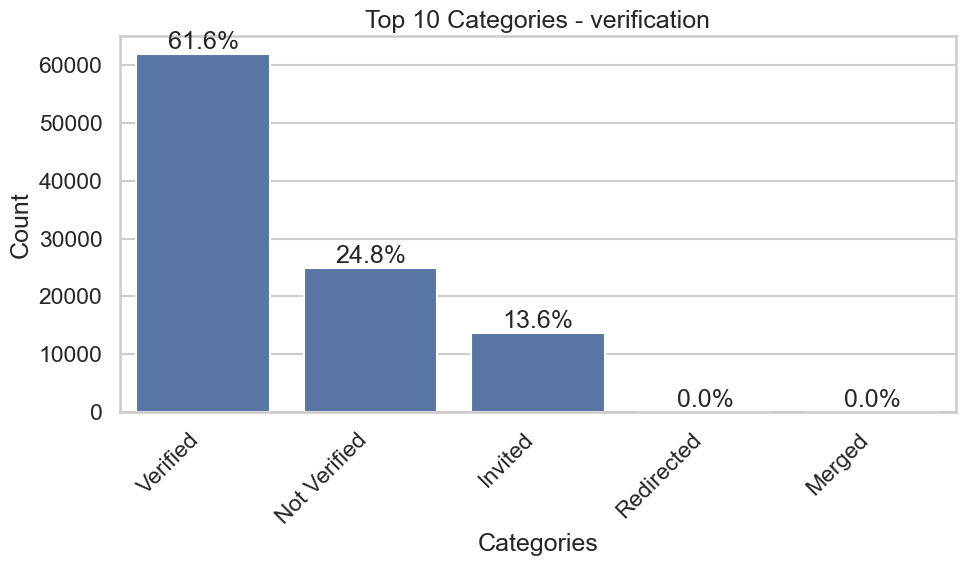

In [85]:
#Univariate analysis of remaining columns

def analyze_statistics(df, column_name):
    print(f"Statistical analysis for column: {column_name}")
    print("="*50)
    
    # Basic info for all columns
    n_unique = df[column_name].nunique()
    n_missing = df[column_name].isnull().sum()
    print(f"Unique values: {n_unique}")
    print(f"Missing values: {n_missing} ({(n_missing/len(df)*100):.2f}%)")
    
    if np.issubdtype(df[column_name].dtype, np.number):
        # Numeric analysis
        desc = df[column_name].describe()
        print("Descriptive Statistics:")
        print(desc)
        
        # Outlier analysis using IQR
        q1, q3 = df[column_name].quantile([0.25, 0.75])
        iqr = q3 - q1
        outliers = df[column_name][(df[column_name] < q1 - 1.5*iqr) | 
                                 (df[column_name] > q3 + 1.5*iqr)]
        print(f"Outliers: {len(outliers)} ({(len(outliers)/len(df)*100):.2f}%)")
        
    elif df[column_name].dtype == 'object':
        # Categorical analysis
        value_counts = df[column_name].value_counts()
        print("Top 10 Categories (Count and Percentage):")
        for val, count in value_counts.head(10).items():
            pct = count/len(df)*100
            print(f"{val}: {count:,} ({pct:.1f}%)")
            
    elif pd.api.types.is_datetime64_dtype(df[column_name]):
        # Datetime analysis
        print("Temporal Range:")
        print(f"Start: {df[column_name].min()}")
        print(f"End: {df[column_name].max()}")
        print(f"Range: {df[column_name].max() - df[column_name].min()}")

def create_visualizations(df, column_name):
    print(f"Visualizations for {column_name}")
    print("="*50)
    
    if np.issubdtype(df[column_name].dtype, np.number):
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        # Distribution
        sns.histplot(data=df, x=column_name, kde=True, ax=axes[0])
        axes[0].set_title('Distribution')
        
        # Vertical boxplot without percentages
        sns.boxplot(x=df[column_name], ax=axes[1])
        axes[1].set_title('Boxplot')
        
        # Q-Q plot
        stats.probplot(df[column_name], dist="norm", plot=axes[2])
        axes[2].set_title('Q-Q Plot')
        
    elif df[column_name].dtype == 'object':
        # Categorical visualization with vertical bars
        plt.figure(figsize=(10, 6))
        
        # Get top 10 categories and their percentages
        top_cats = df[column_name].value_counts().head(10)
        percentages = (top_cats / len(df) * 100)
        
        # Create vertical bar plot
        ax = sns.barplot(x=range(len(top_cats)), y=top_cats.values)
        plt.title(f'Top 10 Categories - {column_name}')
        plt.xlabel('Categories')
        plt.ylabel('Count')
        
        # Set x-tick labels
        plt.xticks(range(len(top_cats)), top_cats.index, rotation=45, ha='right')
        
        # Add percentage labels on top of each bar
        for i, pct in enumerate(percentages):
            ax.text(i, top_cats.values[i], f'{pct:.1f}%', 
                   ha='center', va='bottom')
        
    elif pd.api.types.is_datetime64_dtype(df[column_name]):
        # Datetime visualizations
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Year distribution
        df[column_name].dt.year.value_counts().sort_index().plot(
            kind='bar', ax=axes[0])
        axes[0].set_title('Year Distribution')
        
        # Month distribution
        df[column_name].dt.month.value_counts().sort_index().plot(
            kind='bar', ax=axes[1])
        axes[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        axes[1].set_title('Month Distribution')
    
    plt.tight_layout()
    plt.show()

# Set the style
sns.set_theme(style="whitegrid", context="talk")

# Run analysis for remaining columns
for column in sorted(univariate_pending_columns):
    analyze_statistics(df_trustpilot, column)
    create_visualizations(df_trustpilot, column)

STAGE 2 - MULTIVARIATE ANALYSIS

1. Binary Variables Analysis
Analyzing binary column: repeat_reviewer vs rating
Summary Statistics by Group:
                 count  mean  median   std
repeat_reviewer                           
one-time         55004  3.61     4.0  1.61
repeat           45617  3.36     4.0  1.72
Distribution of rating by groups (%):
rating               1     2      3      4      5
repeat_reviewer                                  
one-time         20.41  7.77  10.53  12.84  48.45
repeat           28.68  6.53   8.99  11.66  44.14


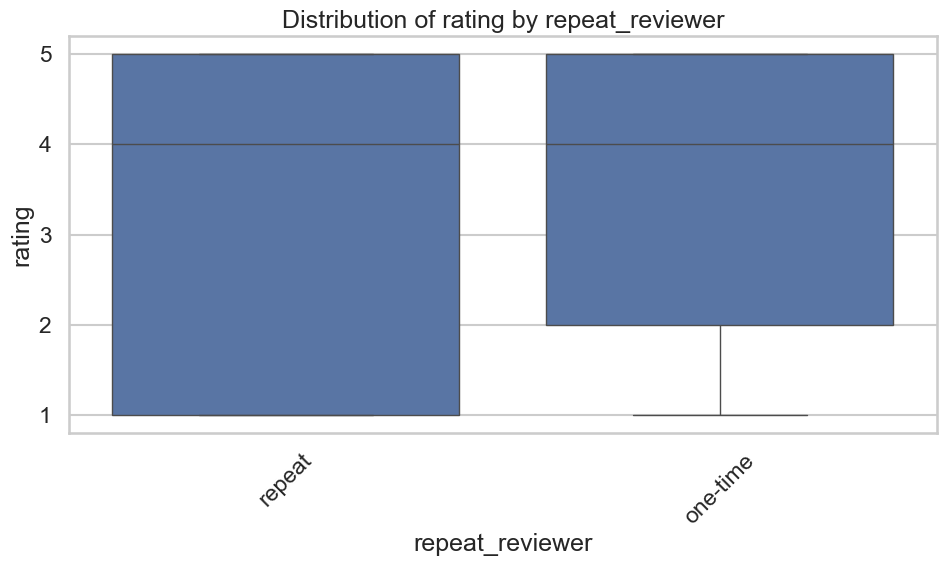

Analyzing binary column: repeat_reviewer_encoded vs rating
Summary Statistics by Group:
                         count  mean  median   std
repeat_reviewer_encoded                           
0                        55004  3.61     4.0  1.61
1                        45617  3.36     4.0  1.72
Distribution of rating by groups (%):
rating                       1     2      3      4      5
repeat_reviewer_encoded                                  
0                        20.41  7.77  10.53  12.84  48.45
1                        28.68  6.53   8.99  11.66  44.14


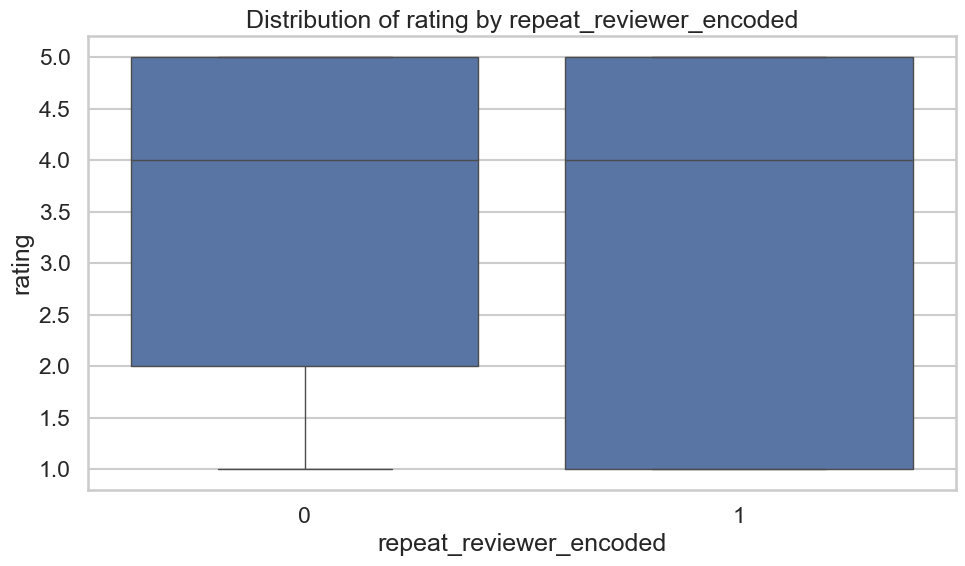

Analyzing binary column: answered_encoded vs rating
Summary Statistics by Group:
                  count  mean  median   std
answered_encoded                           
0                 74527  3.48     4.0  1.66
1                 26094  3.56     5.0  1.68
Distribution of rating by groups (%):
rating                1     2      3      4      5
answered_encoded                                  
0                 24.45  6.69  10.51  13.35  45.00
1                 23.32  8.70   7.89   9.31  50.78


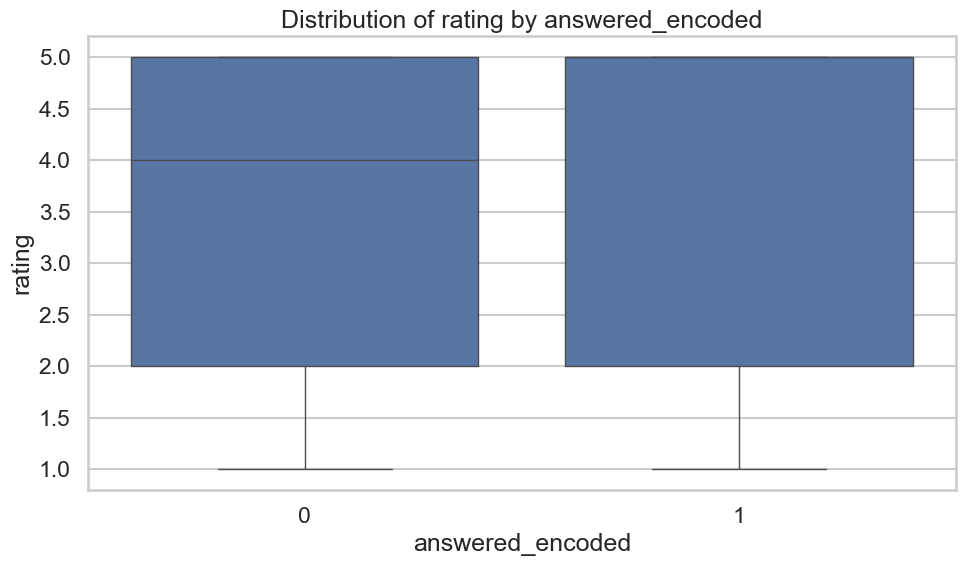

Analyzing binary column: day_type vs rating
Summary Statistics by Group:
              count  mean  median   std
day_type                               
Business Day  76747  3.51     4.0  1.66
Weekend       23874  3.44     4.0  1.68
Distribution of rating by groups (%):
rating            1     2     3      4      5
day_type                                     
Business Day  23.77  7.11  9.86  12.48  46.79
Weekend       25.43  7.54  9.75  11.73  45.56


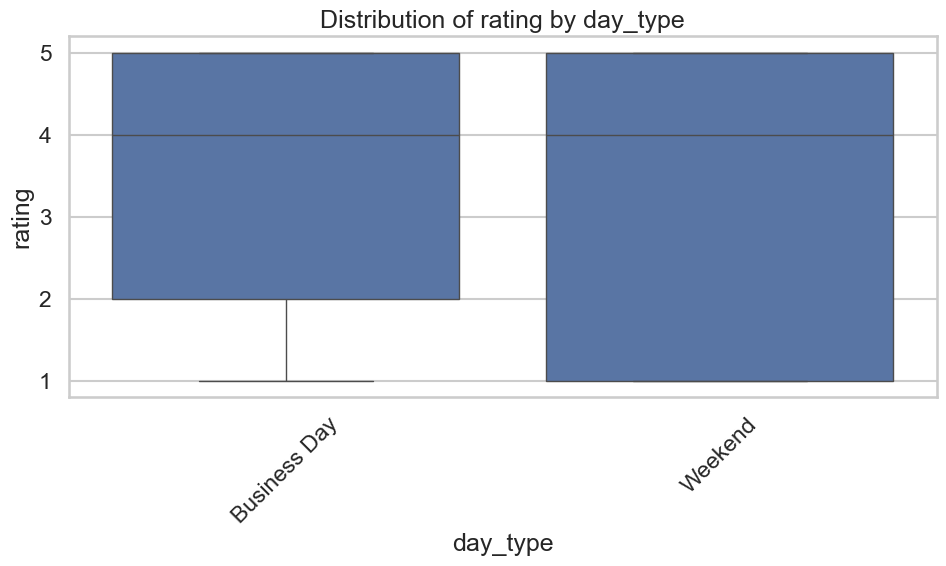

Analyzing binary column: review_time vs rating
Summary Statistics by Group:
              count  mean  median   std
review_time                            
late_review   22732  3.27     4.0  1.65
quick_review  77889  3.57     4.0  1.66
Distribution of rating by groups (%):
rating            1     2      3      4      5
review_time                                   
late_review   26.48  9.33  13.49  12.41  38.29
quick_review  23.48  6.59   8.76  12.27  48.89


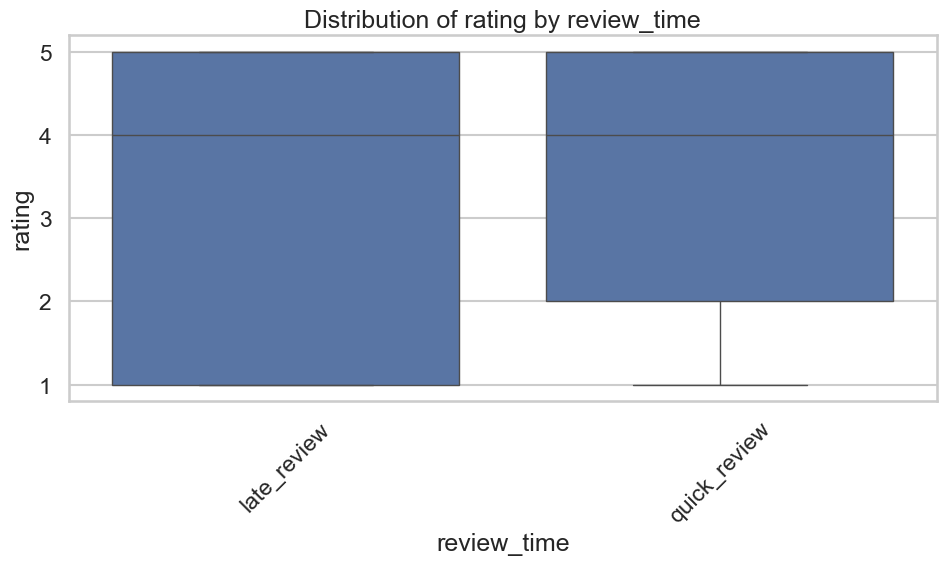

Analyzing binary column: review_time_encoded vs rating
Summary Statistics by Group:
                     count  mean  median   std
review_time_encoded                           
0                    22732  3.27     4.0  1.65
1                    77889  3.57     4.0  1.66
Distribution of rating by groups (%):
rating                   1     2      3      4      5
review_time_encoded                                  
0                    26.48  9.33  13.49  12.41  38.29
1                    23.48  6.59   8.76  12.27  48.89


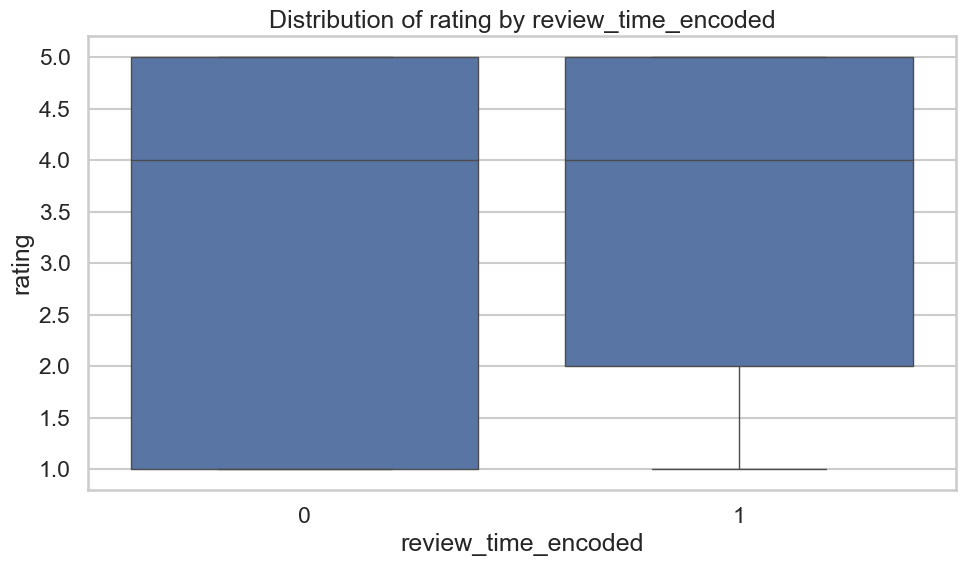

In [86]:
#Multivariate binary analysis

def analyze_multivariate_binary(df, binary_columns, target='rating'):
    for column in binary_columns:
        print(f"Analyzing binary column: {column} vs {target}")
        print("="*50)
        
        # Statistical analysis
        summary = df.groupby(column)[target].agg([
            'count', 'mean', 'median', 'std'
        ]).round(2)
        print("Summary Statistics by Group:")
        print(summary)
        
        # Distribution analysis
        cross_tab = pd.crosstab(df[column], df[target], normalize='index') * 100
        print(f"Distribution of {target} by groups (%):")
        print(cross_tab.round(2))
        
        # Visualization
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.boxplot(data=df, x=column, y=target)
        plt.title(f'Distribution of {target} by {column}')
        if not np.issubdtype(df[column].dtype, np.number):
            plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

print("1. Binary Variables Analysis")
analyze_multivariate_binary(df_trustpilot, binary_columns)


2. Sentiment Analysis
Analyzing sentiment scores vs rating


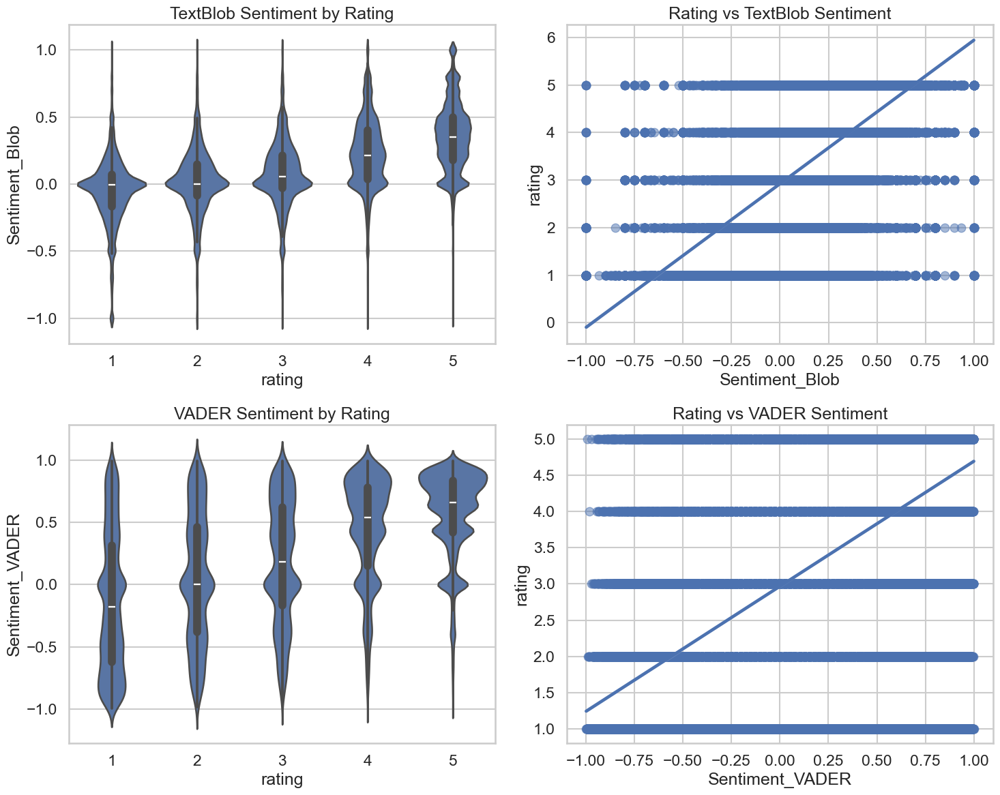

Sentiment_Blob correlation with rating:
Correlation: 0.560
Sentiment_VADER correlation with rating:
Correlation: 0.554


In [87]:
#Multivariate sentiment analysis

def analyze_multivariate_sentiment(df, target='rating'):
    print(f"Analyzing sentiment scores vs {target}")
    print("="*50)
    
    # Create visualization grid
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # TextBlob analysis
    sns.violinplot(data=df, x=target, y='Sentiment_Blob', ax=axes[0,0])
    axes[0,0].set_title('TextBlob Sentiment by Rating')
    
    sns.regplot(data=df, x='Sentiment_Blob', y=target, 
                scatter_kws={'alpha':0.5}, ax=axes[0,1])
    axes[0,1].set_title('Rating vs TextBlob Sentiment')
    
    # VADER analysis
    sns.violinplot(data=df, x=target, y='Sentiment_VADER', ax=axes[1,0])
    axes[1,0].set_title('VADER Sentiment by Rating')
    
    sns.regplot(data=df, x='Sentiment_VADER', y=target, 
                scatter_kws={'alpha':0.5}, ax=axes[1,1])
    axes[1,1].set_title('Rating vs VADER Sentiment')
    
    plt.tight_layout()
    plt.show()
    
    # Statistical analysis
    for sentiment in ['Sentiment_Blob', 'Sentiment_VADER']:
        print(f"{sentiment} correlation with {target}:")
        correlation = df[sentiment].corr(df[target])
        print(f"Correlation: {correlation:.3f}")

print("2. Sentiment Analysis")
analyze_multivariate_sentiment(df_trustpilot)

Analyzing company vs rating


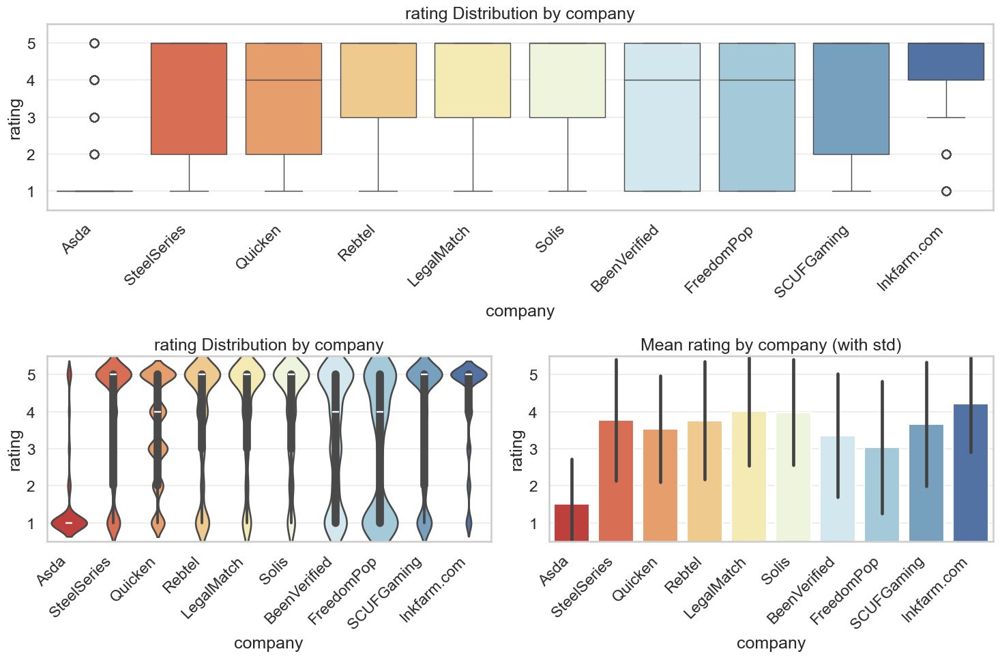

Summary Statistics for Top Categories:
              count  mean   std  median
company                                
Asda          12552  1.52  1.20     1.0
BeenVerified   1547  3.36  1.66     4.0
FreedomPop     1296  3.04  1.78     4.0
Inkfarm.com   21766  4.22  1.32     5.0
LegalMatch     2008  4.01  1.47     5.0
Quicken       26762  3.53  1.43     4.0
Rebtel         4497  3.76  1.59     5.0
SCUFGaming    10367  3.67  1.67     5.0
Solis          1772  3.98  1.42     5.0
SteelSeries   12395  3.78  1.64     5.0
Analyzing date_of_experience vs rating


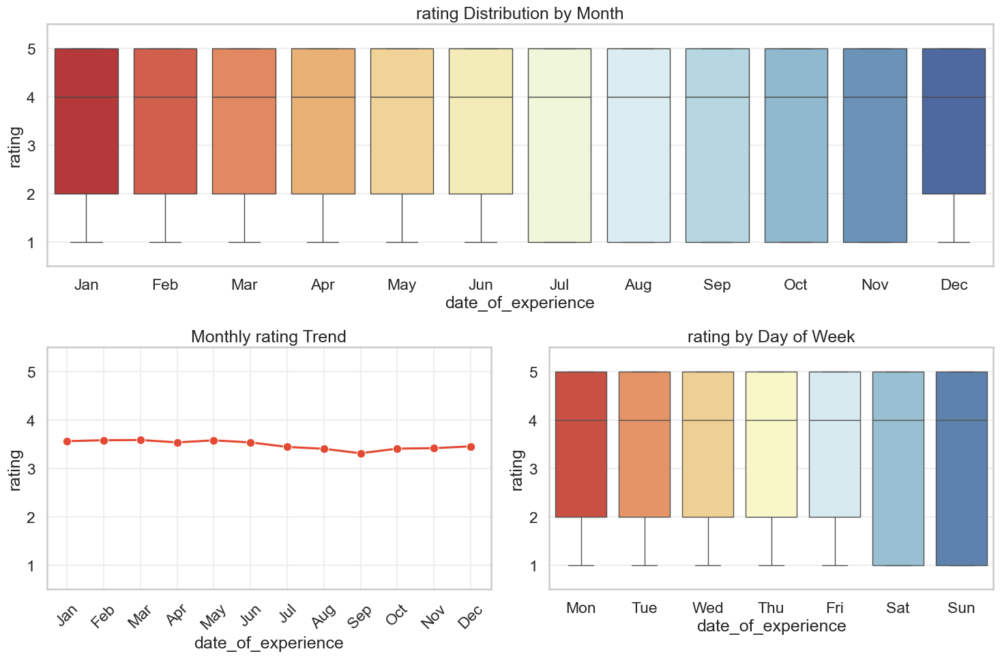

Analyzing date_posted vs rating


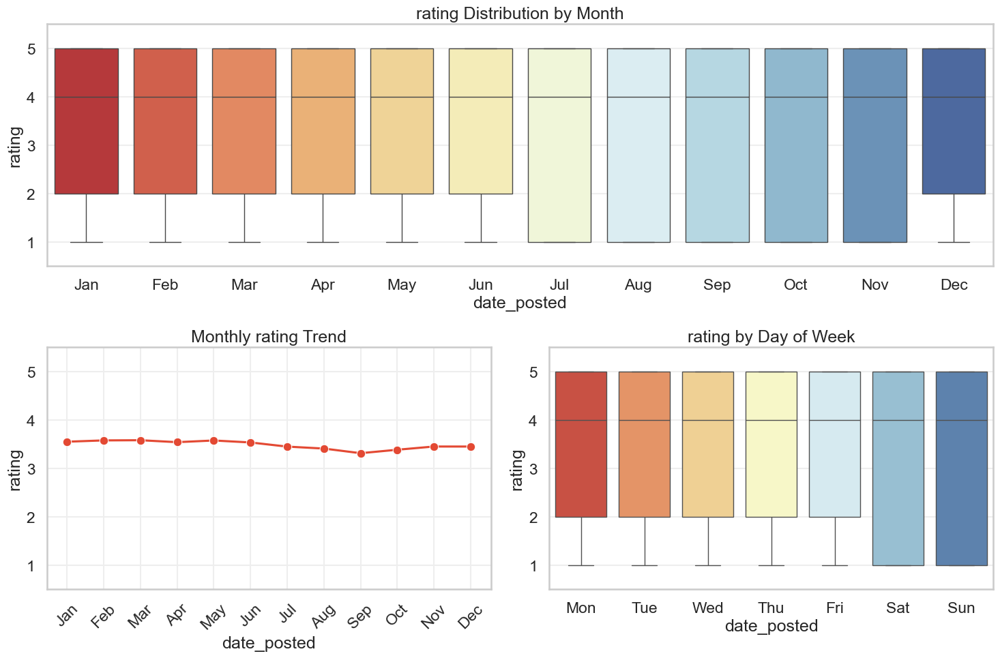

Analyzing day_of_week_posted vs rating


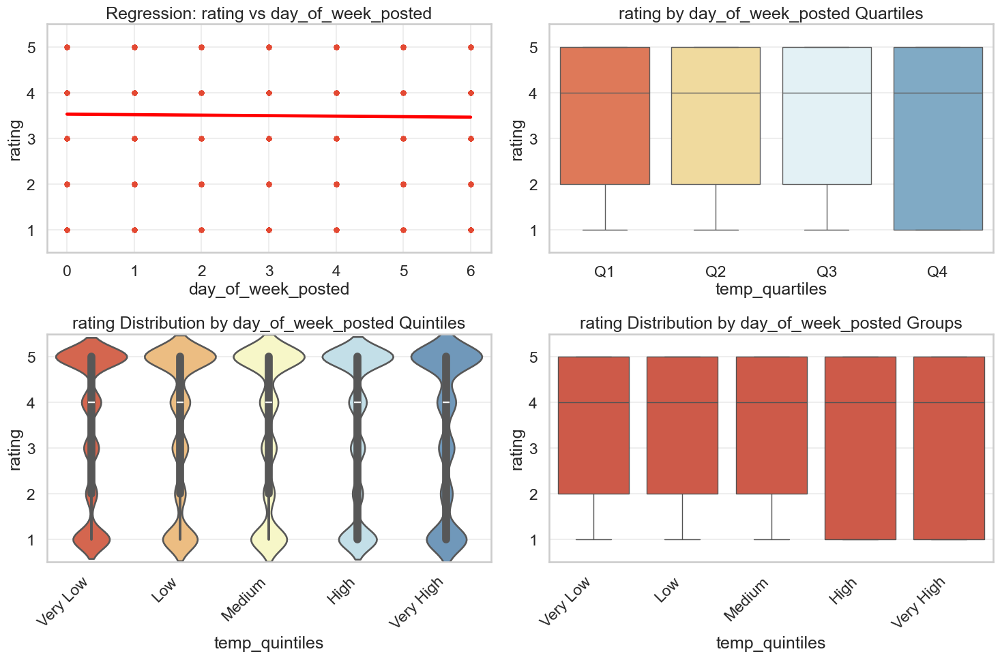

Correlation with rating: -0.013
Analyzing days_between_experience_and_post vs rating
Could not create quartile plot for days_between_experience_and_post
Could not create quintile plot for days_between_experience_and_post


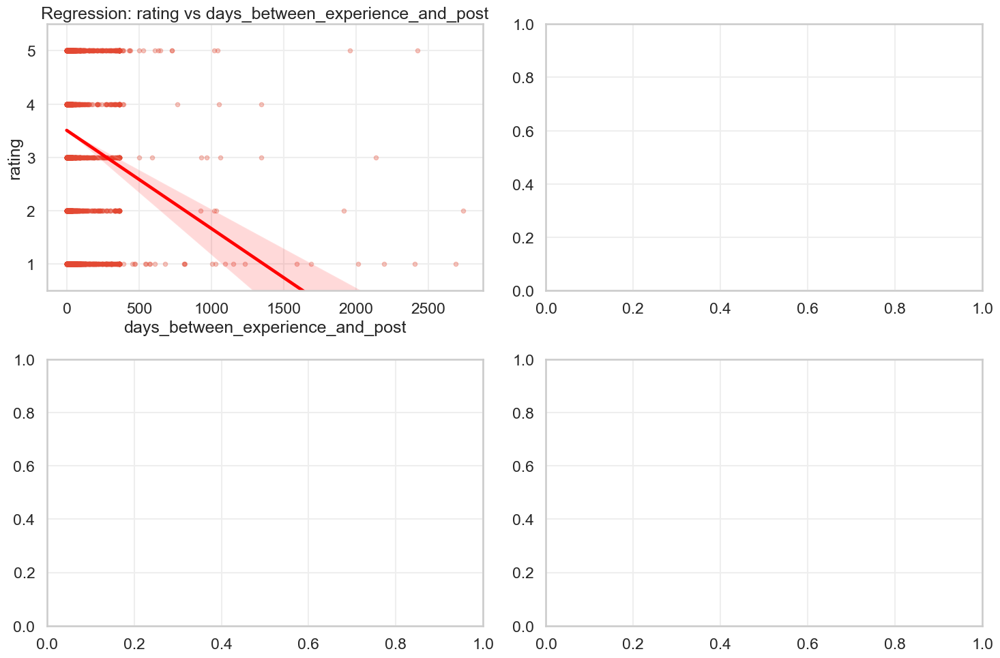

Correlation with rating: -0.039
Analyzing local_date_posted vs rating


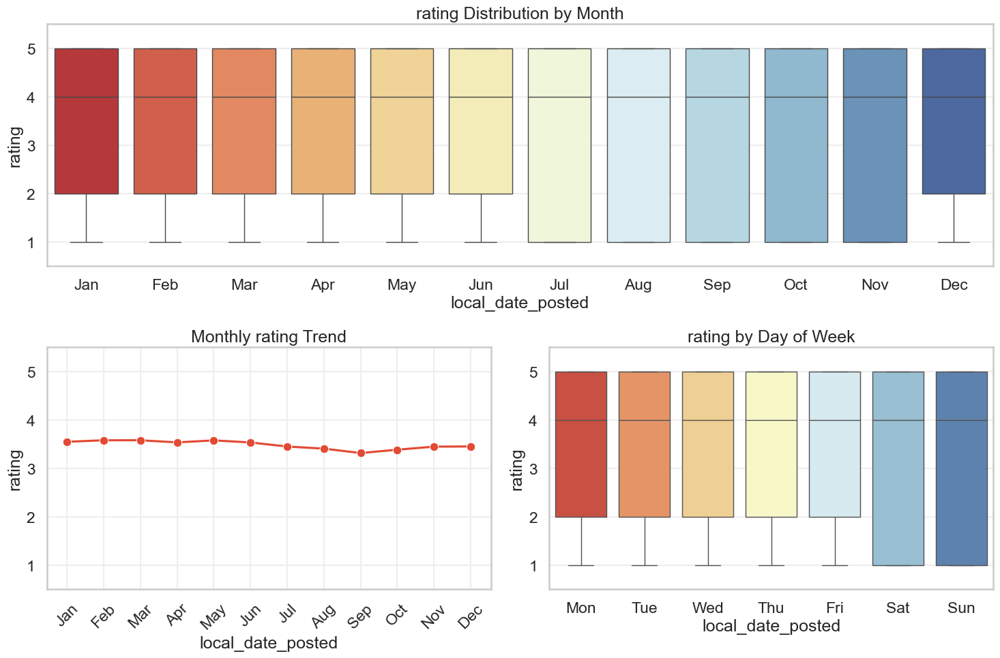

Analyzing local_hour vs rating


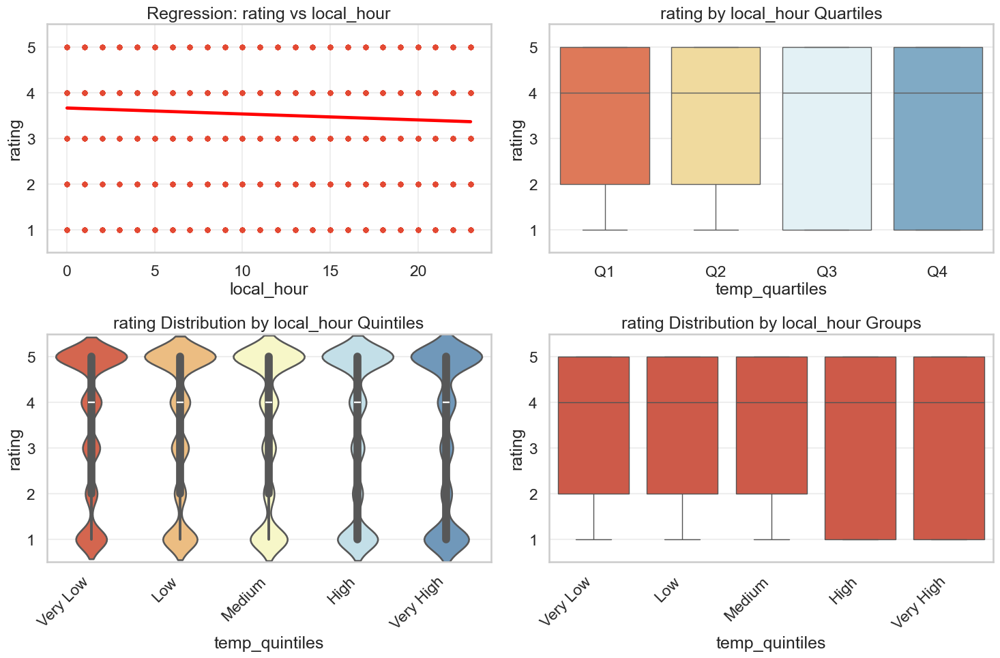

Correlation with rating: -0.041
Analyzing location vs rating


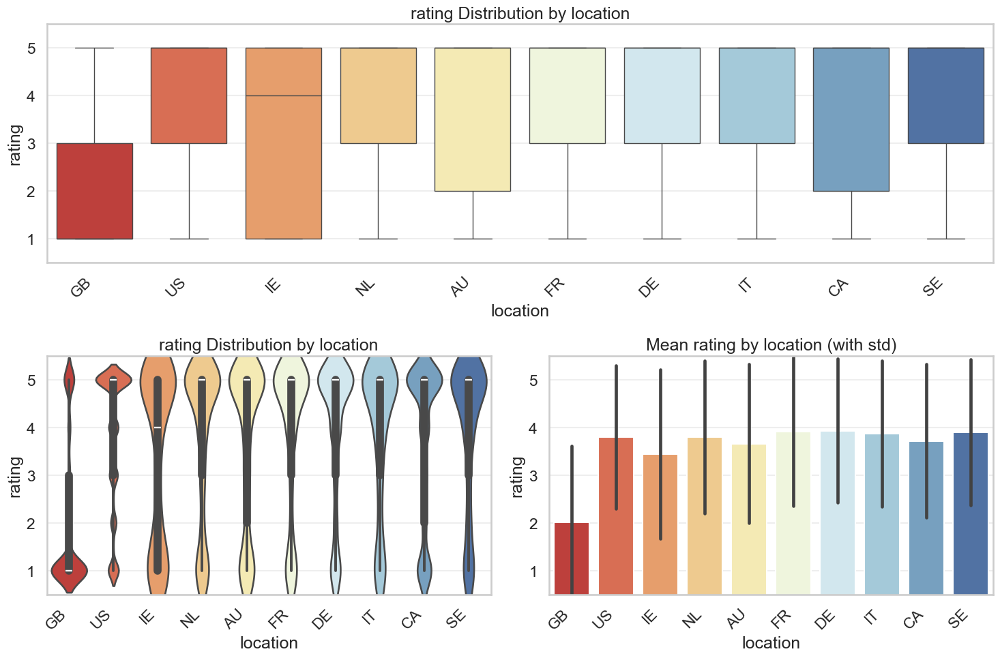

Summary Statistics for Top Categories:
          count  mean   std  median
location                           
AU          653  3.66  1.66     5.0
CA         3326  3.71  1.61     5.0
DE          957  3.93  1.51     5.0
FR          495  3.91  1.56     5.0
GB        16696  2.01  1.60     1.0
IE          275  3.44  1.77     4.0
IT          277  3.87  1.53     5.0
NL          559  3.79  1.60     5.0
SE          325  3.89  1.53     5.0
US        71106  3.79  1.50     5.0
Analyzing month_local vs rating


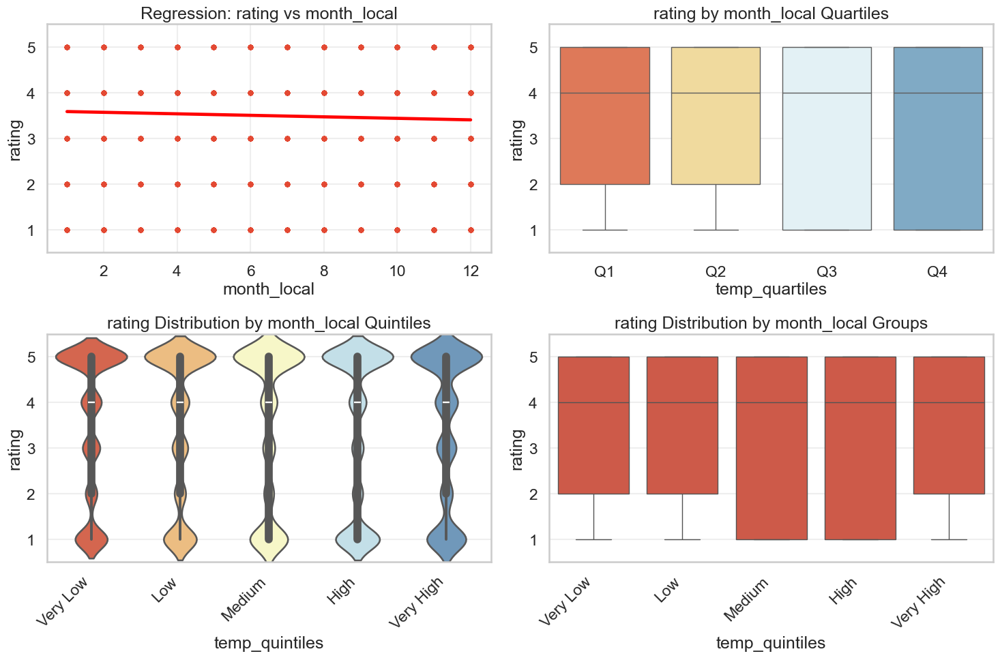

Correlation with rating: -0.036
Analyzing number_reviews vs rating
Could not create quartile plot for number_reviews
Could not create quintile plot for number_reviews


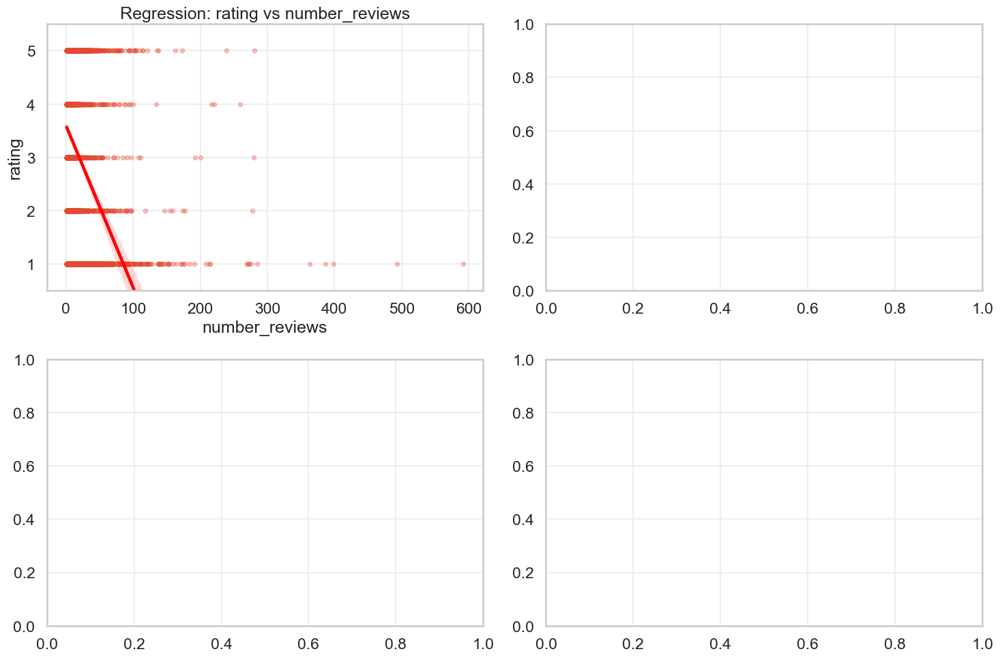

Correlation with rating: -0.154
Analyzing subject_length vs rating


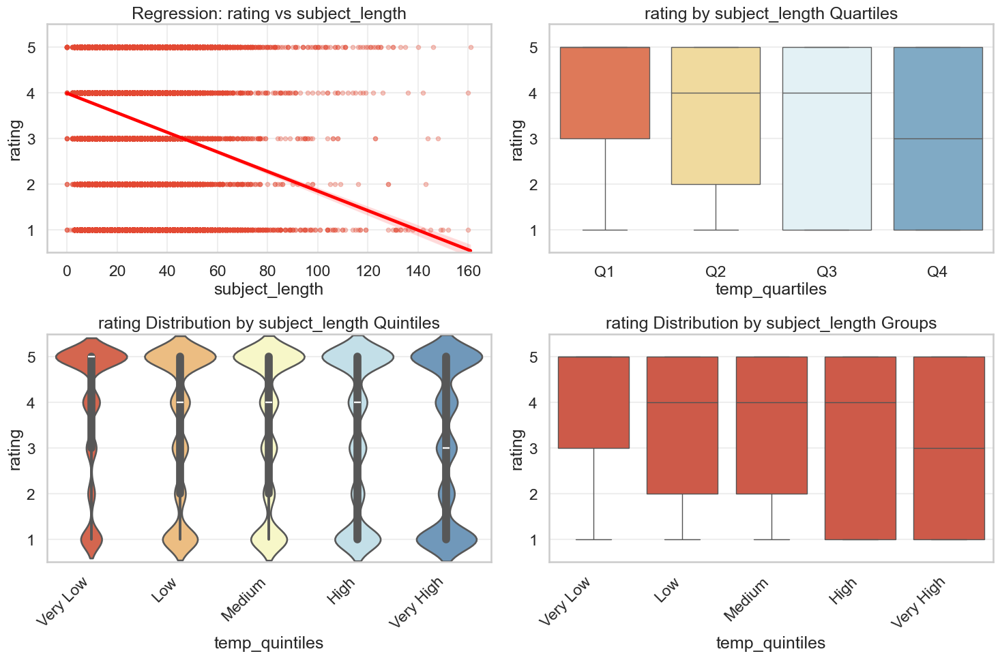

Correlation with rating: -0.136
Analyzing subject_word_length vs rating
Could not create quintile plot for subject_word_length


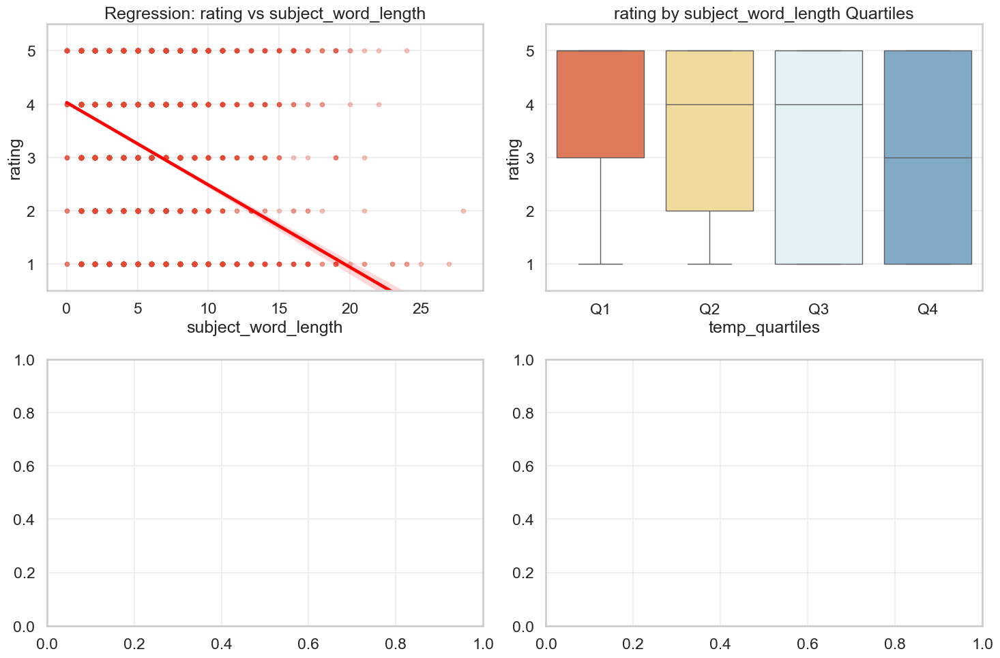

Correlation with rating: -0.140
Analyzing text_length vs rating


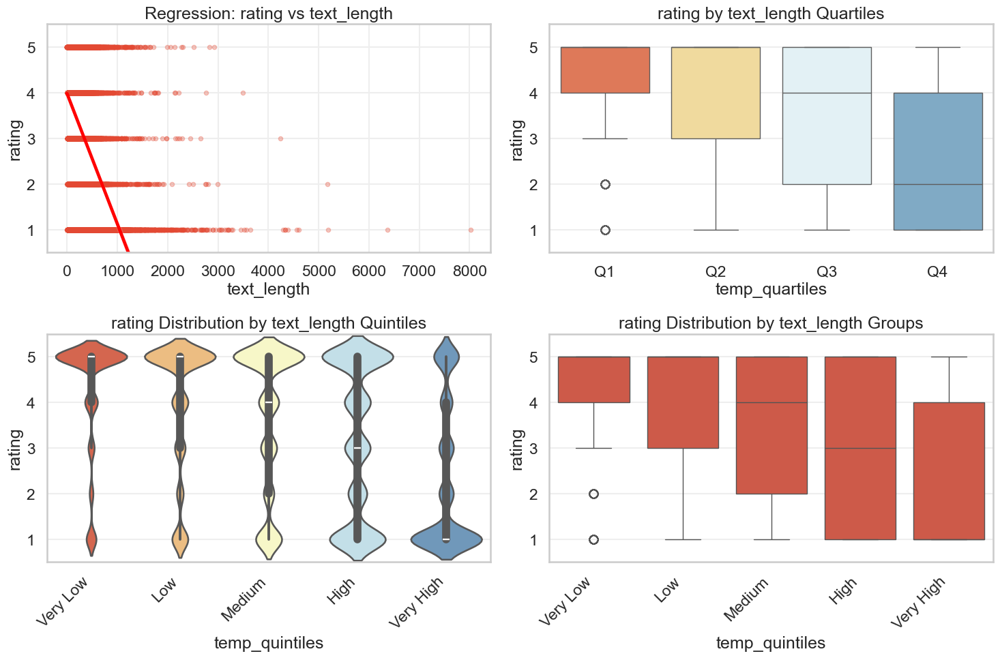

Correlation with rating: -0.361
Analyzing text_word_length vs rating


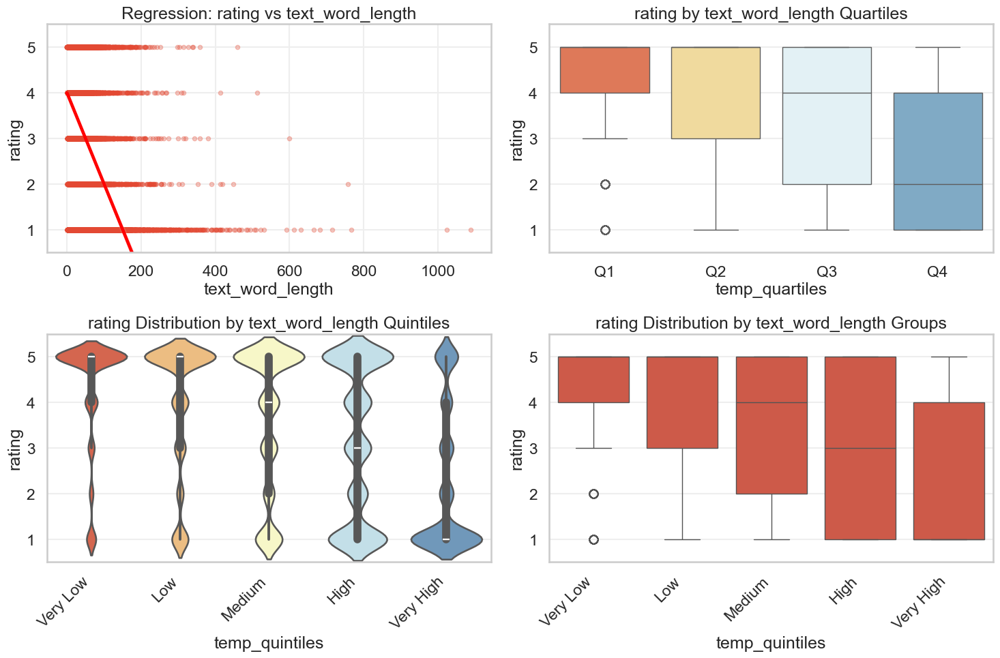

Correlation with rating: -0.370
Analyzing time_of_day vs rating


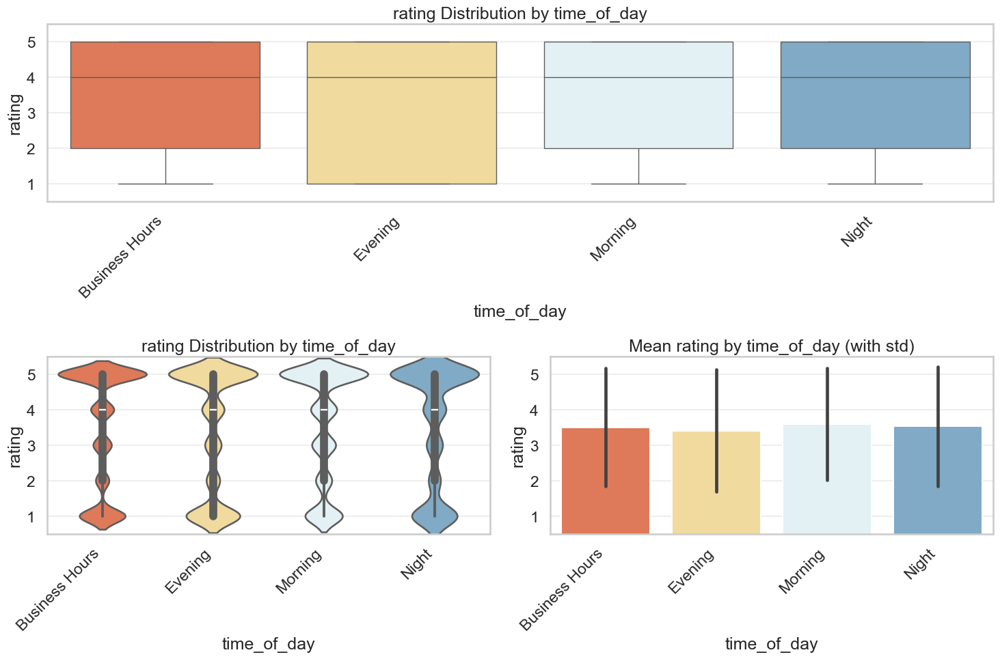

Summary Statistics for Top Categories:
                count  mean   std  median
time_of_day                              
Business Hours  55286  3.50  1.67     4.0
Evening         20136  3.40  1.72     4.0
Morning         17177  3.58  1.58     4.0
Night            8022  3.52  1.68     4.0
Analyzing verification vs rating


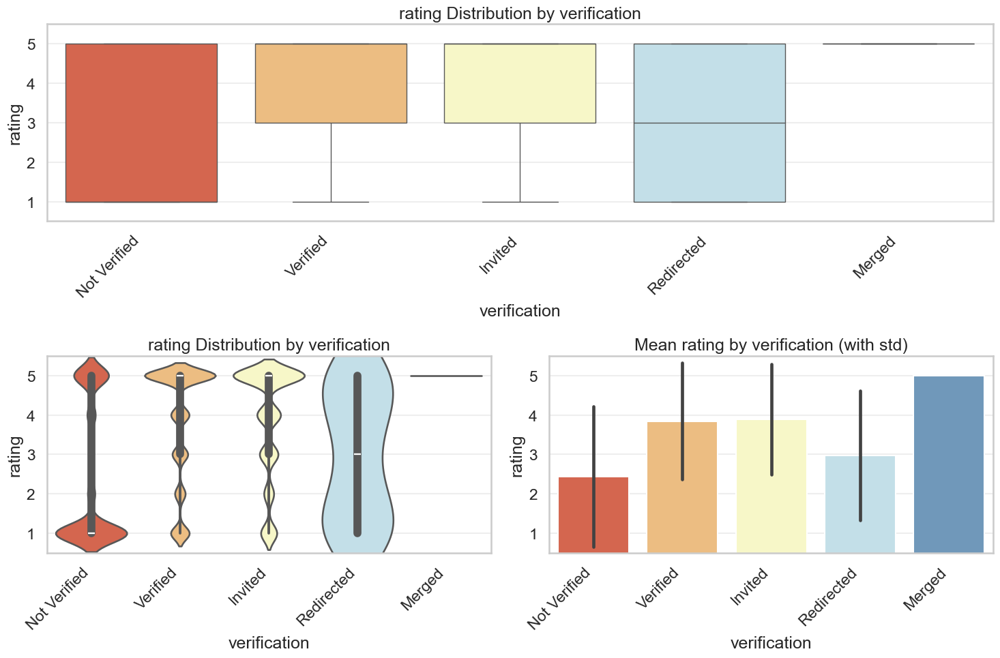

Summary Statistics for Top Categories:
              count  mean   std  median
verification                           
Invited       13711  3.89  1.40     5.0
Merged            1  5.00   NaN     5.0
Not Verified  24936  2.43  1.78     1.0
Redirected       33  2.97  1.65     3.0
Verified      61940  3.84  1.48     5.0


In [88]:
#Multivariate analysis of remaining columns

multivariate_pending_columns = list(set(df_trustpilot.columns) - 
                                  set(binary_columns) - 
                                  set(sentiment_columns) - 
                                  set(text_based_columns) - 
                                  set(administrative_columns))

def analyze_multivariate_pending(df, column, target='rating'):
    print(f"Analyzing {column} vs {target}")
    
    try:
        df[column].astype(float)
        is_numeric = True
    except:
        is_numeric = False
    
    if is_numeric:
        fig = plt.figure(figsize=(15, 10))
        gs = fig.add_gridspec(2, 2)
        
        # Scatter plot with regression line
        ax1 = fig.add_subplot(gs[0, 0])
        sns.regplot(data=df, x=column, y=target, 
                   scatter_kws={'alpha':0.3, 's':20},
                   line_kws={'color': 'red'},
                   ax=ax1)
        ax1.set_title(f'Regression: {target} vs {column}')
        ax1.set_ylim(0.5, 5.5)
        
        # Distribution by quartiles
        ax2 = fig.add_subplot(gs[0, 1])
        try:
            df['temp_quartiles'] = pd.qcut(df[column], q=4, 
                                         labels=['Q1', 'Q2', 'Q3', 'Q4'],
                                         duplicates='drop')
            sns.boxplot(data=df, x='temp_quartiles', y=target,
                       palette='RdYlBu',
                       ax=ax2)
            ax2.set_title(f'{target} by {column} Quartiles')
            ax2.set_ylim(0.5, 5.5)
        except:
            print(f"Could not create quartile plot for {column}")
            
        # Violin plot
        ax3 = fig.add_subplot(gs[1, 0])
        try:
            df['temp_quintiles'] = pd.qcut(df[column], q=5, 
                                         labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'],
                                         duplicates='drop')
            sns.violinplot(data=df, x='temp_quintiles', y=target,
                         palette='RdYlBu',
                         ax=ax3)
            ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha='right')
            ax3.set_title(f'{target} Distribution by {column} Quintiles')
            ax3.set_ylim(0.5, 5.5)
        except:
            print(f"Could not create quintile plot for {column}")
            
        # Distribution plot
        ax4 = fig.add_subplot(gs[1, 1])
        if 'temp_quintiles' in df.columns:
            sns.boxplot(data=df, x='temp_quintiles', y=target, ax=ax4)
            ax4.set_xticklabels(ax4.get_xticklabels(), rotation=45, ha='right')
            ax4.set_title(f'{target} Distribution by {column} Groups')
            ax4.set_ylim(0.5, 5.5)
        
        plt.tight_layout()
        plt.show()
        
        df.drop(['temp_quartiles', 'temp_quintiles'], axis=1, errors='ignore', inplace=True)
        
        # Statistical analysis
        correlation = df[column].corr(df[target])
        print(f"Correlation with {target}: {correlation:.3f}")
        
    elif pd.api.types.is_datetime64_dtype(df[column]):
        fig = plt.figure(figsize=(15, 10))
        gs = fig.add_gridspec(2, 2)
        
        # Monthly boxplot
        ax1 = fig.add_subplot(gs[0, :])
        sns.boxplot(data=df, x=df[column].dt.month, y=target,
                   palette='RdYlBu',
                   ax=ax1)
        ax1.set_title(f'{target} Distribution by Month')
        ax1.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        ax1.set_ylim(0.5, 5.5)
        
        # Monthly trend
        ax2 = fig.add_subplot(gs[1, 0])
        monthly_means = df.groupby(df[column].dt.month)[target].mean()
        sns.lineplot(data=monthly_means, marker='o', ax=ax2)
        ax2.set_title(f'Monthly {target} Trend')
        ax2.set_xticks(range(1, 13))
        ax2.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
                           rotation=45)
        ax2.set_ylim(0.5, 5.5)
        
        # Day of week analysis
        ax3 = fig.add_subplot(gs[1, 1])
        sns.boxplot(data=df, x=df[column].dt.dayofweek, y=target,
                   palette='RdYlBu',
                   ax=ax3)
        ax3.set_title(f'{target} by Day of Week')
        ax3.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
        ax3.set_ylim(0.5, 5.5)
        
        plt.tight_layout()
        plt.show()
        
    else:
        # Categorical analysis
        fig = plt.figure(figsize=(15, 10))
        gs = fig.add_gridspec(2, 2)
        
        # Get top categories
        top_cats = df[column].value_counts().head(10).index
        df_filtered = df[df[column].isin(top_cats)]
        
        # Boxplot
        ax1 = fig.add_subplot(gs[0, :])
        sns.boxplot(data=df_filtered, x=column, y=target,
                   palette='RdYlBu',
                   ax=ax1)
        ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
        ax1.set_title(f'{target} Distribution by {column}')
        ax1.set_ylim(0.5, 5.5)
        
        # Violin plot
        ax2 = fig.add_subplot(gs[1, 0])
        sns.violinplot(data=df_filtered, x=column, y=target,
                      palette='RdYlBu',
                      ax=ax2)
        ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')
        ax2.set_title(f'{target} Distribution by {column}')
        ax2.set_ylim(0.5, 5.5)
        
        # Bar plot with error bars
        ax3 = fig.add_subplot(gs[1, 1])
        sns.barplot(data=df_filtered, x=column, y=target,
                   palette='RdYlBu',
                   ci='sd',
                   ax=ax3)
        ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha='right')
        ax3.set_title(f'Mean {target} by {column} (with std)')
        ax3.set_ylim(0.5, 5.5)
        
        plt.tight_layout()
        plt.show()
        
        # Statistical analysis
        print("Summary Statistics for Top Categories:")
        summary = df_filtered.groupby(column)[target].agg([
            'count', 'mean', 'std', 'median'
        ]).round(2)
        print(summary)

sns.set_theme(style="whitegrid", context="talk", palette="RdYlBu")
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['grid.color'] = '#EEEEEE'

for column in sorted(multivariate_pending_columns):
    if column not in binary_columns + sentiment_columns + ['rating']:
        analyze_multivariate_pending(df_trustpilot, column)

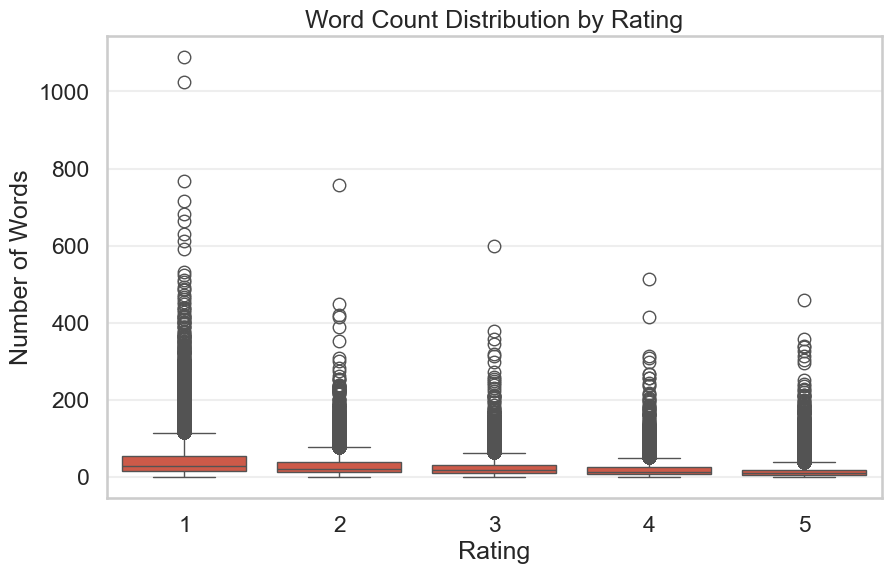

In [89]:
#Word length distribution by rating

plt.figure(figsize=(10, 6))
sns.boxplot(x='rating', y='text_word_length', data=df_trustpilot)
plt.title('Word Count Distribution by Rating')
plt.xlabel('Rating')
plt.ylabel('Number of Words')
plt.show()


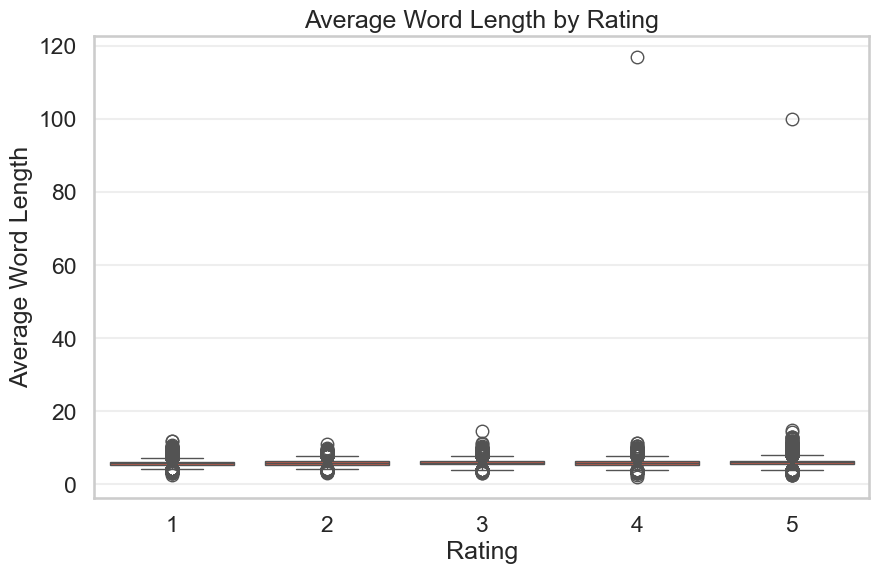

In [90]:
#Average word length by rating
df_trustpilot['avg_word_length'] = df_trustpilot['text_processed'].apply(lambda x: np.mean([len(word) for word in str(x).split()]) if pd.notna(x) else np.nan)
plt.figure(figsize=(10, 6))
sns.boxplot(x='rating', y='avg_word_length', data=df_trustpilot)
plt.title('Average Word Length by Rating')
plt.xlabel('Rating')
plt.ylabel('Average Word Length')
plt.show()

In [91]:
print(df_trustpilot.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100621 entries, 0 to 100620
Data columns (total 35 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   rating                            100621 non-null  int64         
 1   location                          100621 non-null  object        
 2   username                          100617 non-null  object        
 3   number_reviews                    100621 non-null  int64         
 4   verification                      100621 non-null  object        
 5   repeat_reviewer                   100621 non-null  object        
 6   repeat_reviewer_encoded           100621 non-null  int64         
 7   company                           100621 non-null  object        
 8   text                              100621 non-null  object        
 9   text_processed                    100605 non-null  object        
 10  text_length                     

STAGE 3 - TEXT-BASED VISUALIZATIONS

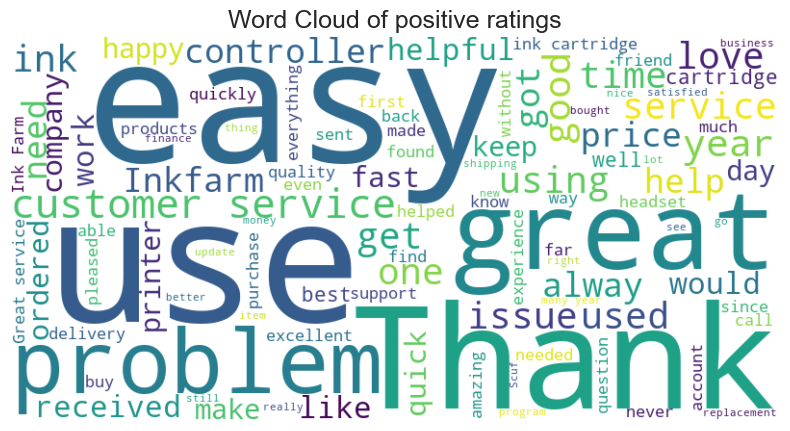

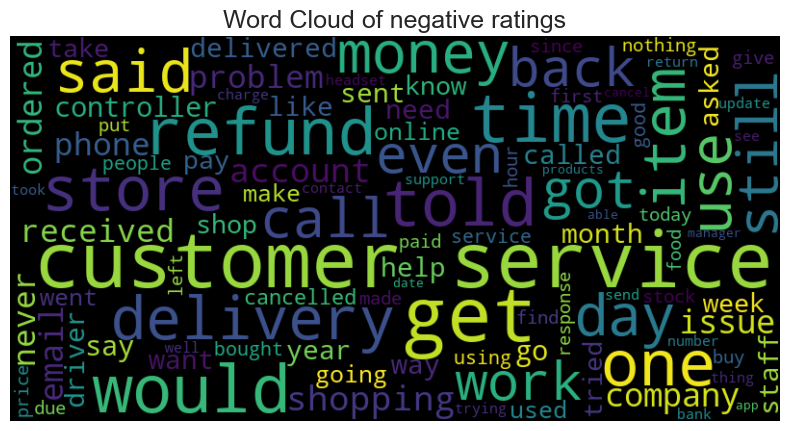

In [92]:
#Creating positive and negative wordclouds

# stop words
stop_words = set(stopwords.words('english'))
stop_words.update(["product", "order", "I've", "could", "I'm", "u", "also", "tell", "flashbay", "asda", "quicken", "steelseries"])



# splitting good and bad rated words
df_pos = df_trustpilot.loc[df_trustpilot["rating"]==5]

df_neg = df_trustpilot.loc[df_trustpilot["rating"]==1]


#creating positive word cloud
text = " ".join(df_pos["text"])
wordcloud = WordCloud(background_color="white", max_words=100, stopwords=stop_words, width = 800, height = 400). generate(text)

plt.figure(figsize = (10, 5))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.title("Word Cloud of positive ratings")
plt.show()


#creating negative word cloud
text = " ".join(df_neg["text"])
wordcloud = WordCloud(background_color="black", max_words=100, stopwords=stop_words, width = 800, height = 400). generate(text)

plt.figure(figsize = (10, 5))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.title("Word Cloud of negative ratings")
plt.axis("off")
plt.show()


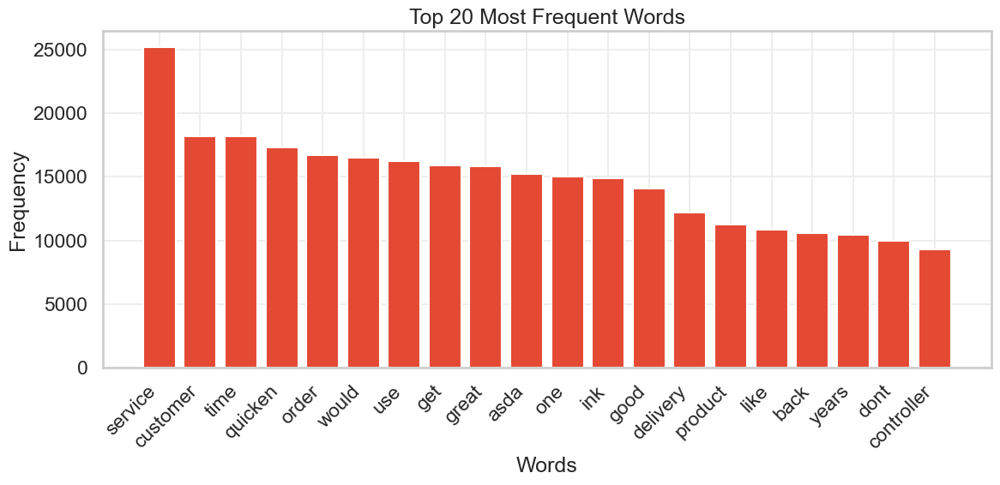

In [93]:
#Word Frequency plot
plt.figure(figsize=(12, 6))
word_freq = Counter(' '.join(df_trustpilot['text_processed'].dropna().astype(str)).split()).most_common(20)
words, counts = zip(*word_freq)
plt.bar(words, counts)
plt.xticks(rotation=45, ha='right')
plt.title('Top 20 Most Frequent Words')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

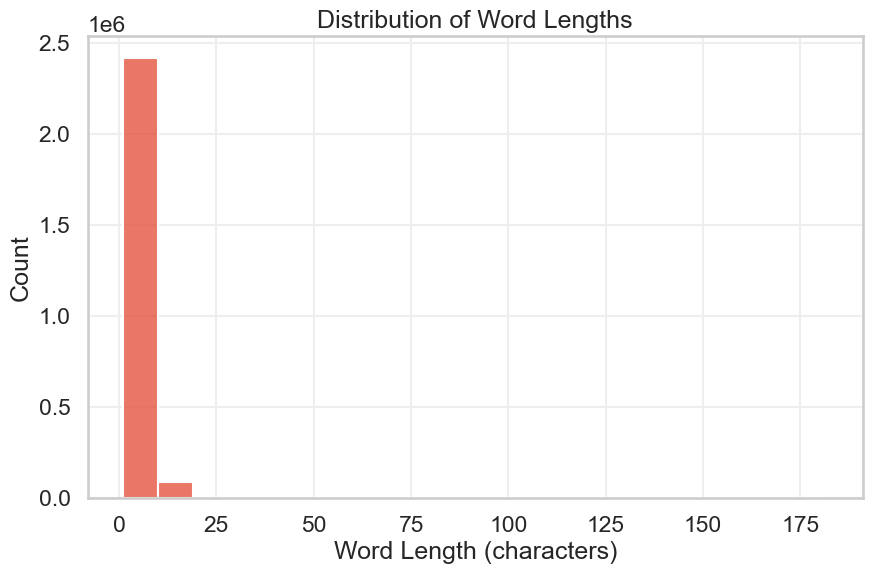

In [94]:
#Word Length distribution
df_trustpilot['text_processed'] = df_trustpilot['text_processed'].astype(str)
plt.figure(figsize=(10, 6))
word_lengths = [len(word) for word in ' '.join(df_trustpilot['text_processed']).split()]
sns.histplot(word_lengths, bins=20)
plt.title('Distribution of Word Lengths')
plt.xlabel('Word Length (characters)')
plt.ylabel('Count')
plt.show()

STAGE 4 - TIME SERIES PLOT

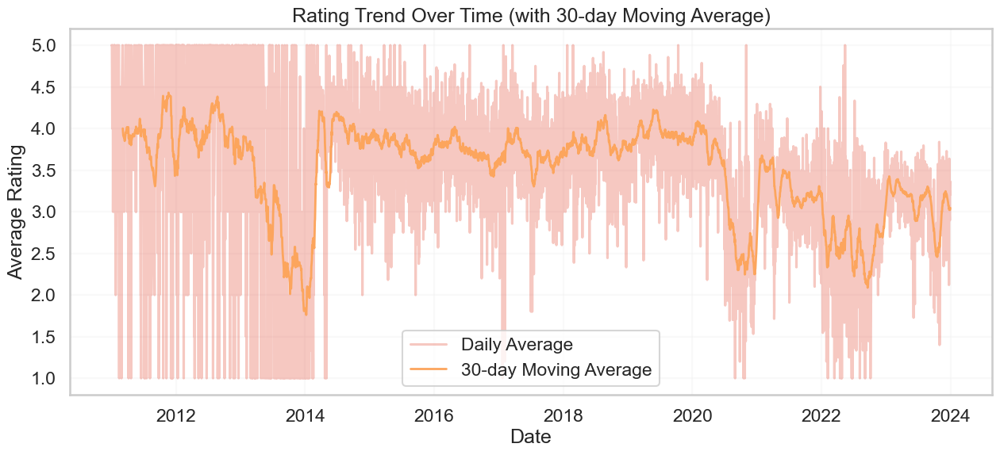

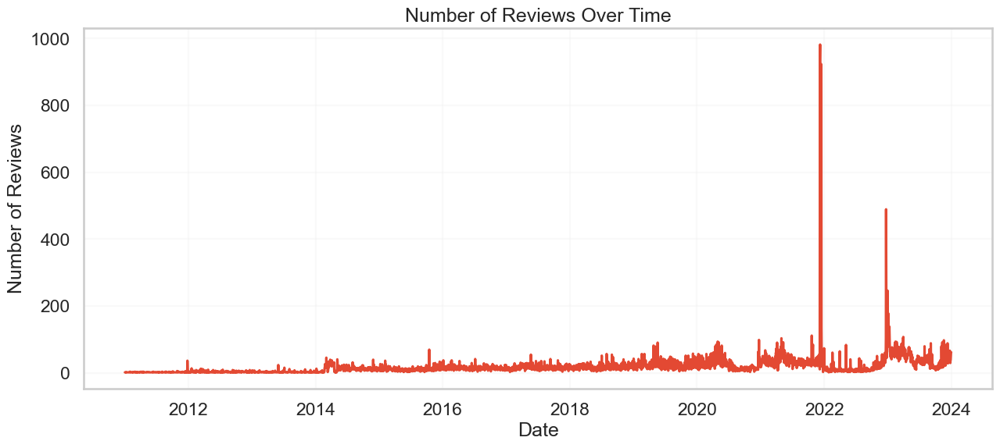

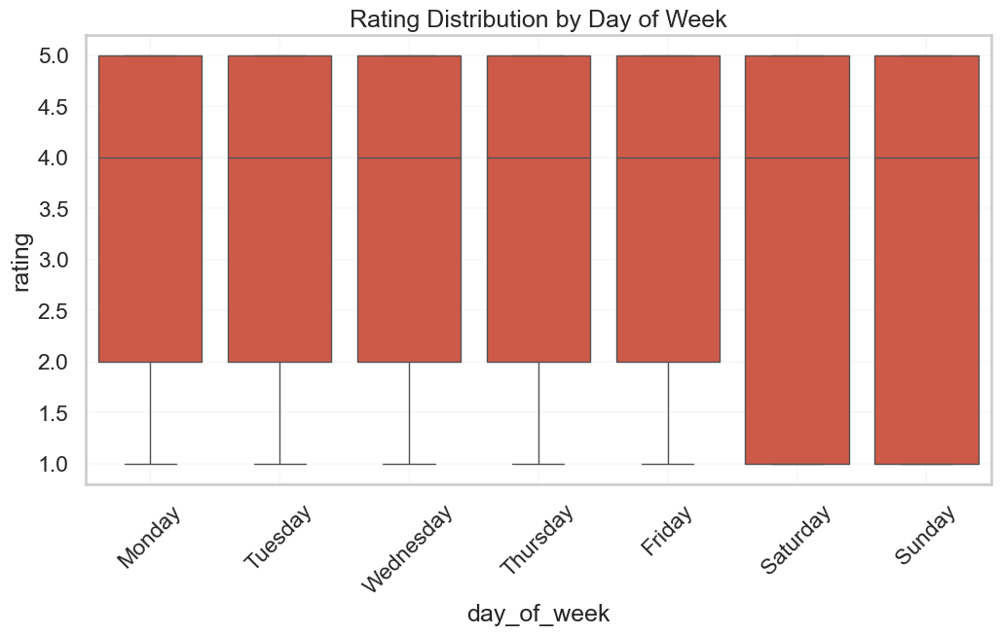

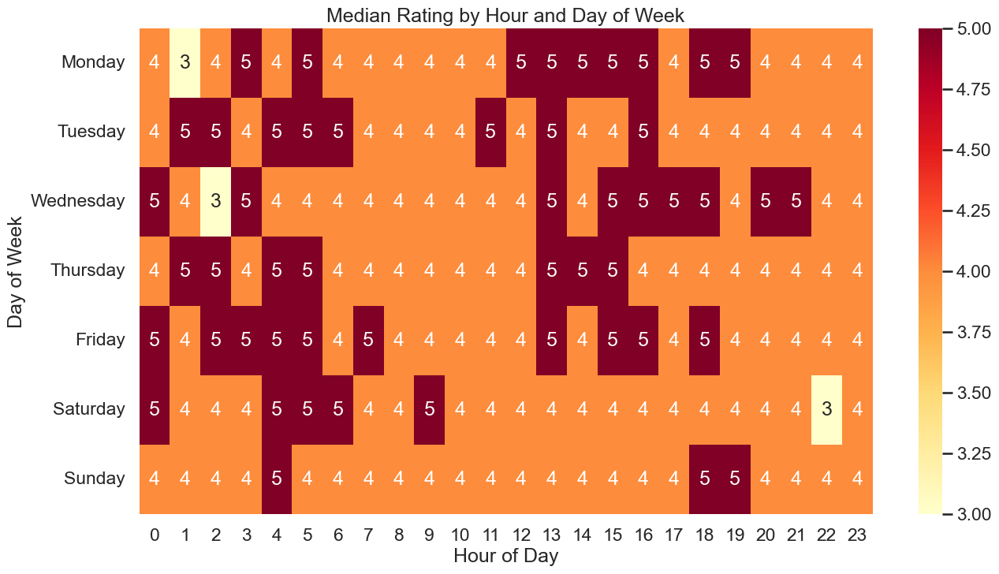

Time Series Statistics:
Start Date: 2011-01-02 00:00:00
End Date: 2023-12-31 00:00:00
Busiest Day: 2021-12-08 00:00:00 with 982 reviews
Best Rating Day: 2011-01-02 00:00:00 with average rating of 5.00
Worst Rating Day: 2011-02-14 00:00:00 with average rating of 1.00


In [95]:
# Time series plot

# Defining reasonable date range
start_date = '2011-01-01'
end_date = '2023-12-31'

# Filtering the data
filtered_df = df_trustpilot[
    (df_trustpilot['local_date_posted'] >= start_date) & 
    (df_trustpilot['local_date_posted'] <= end_date)
]

# Daily Average Rating Over Time 
daily_avg = filtered_df.groupby('local_date_posted')['rating'].mean()

# Rolling Average to Smooth Daily 
plt.figure(figsize=(15, 6))
rolling_avg = daily_avg.rolling(window=30).mean()
plt.plot(daily_avg.index, daily_avg.values, alpha=0.3, label='Daily Average')
plt.plot(rolling_avg.index, rolling_avg.values, linewidth=2, label='30-day Moving Average')
plt.title('Rating Trend Over Time (with 30-day Moving Average)')
plt.xlabel('Date')
plt.ylabel('Average Rating')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Volume of Reviews Over Time
plt.figure(figsize=(15, 6))
daily_count = filtered_df.groupby('local_date_posted').size()
plt.plot(daily_count.index, daily_count.values)
plt.title('Number of Reviews Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Reviews')
plt.grid(True, alpha=0.3)
plt.show()

# Day of Week Analysis
plt.figure(figsize=(12, 6))
filtered_df['day_of_week'] = filtered_df['local_date_posted'].dt.day_name()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.boxplot(data=filtered_df, x='day_of_week', y='rating', order=day_order)
plt.title('Rating Distribution by Day of Week')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.show()

# Heatmap: Hour vs Day of Week
plt.figure(figsize=(15, 8))
pivot_table = filtered_df.pivot_table(
    values='rating',
    index=filtered_df['local_date_posted'].dt.day_name(),
    columns='local_hour',
    aggfunc='median'
)
pivot_table = pivot_table.reindex(day_order)
pivot_table = pivot_table.round(0)
sns.heatmap(pivot_table, cmap='YlOrRd', annot=True, fmt='.0f')
plt.title('Median Rating by Hour and Day of Week')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.show()

# Print statistics
print("Time Series Statistics:")
print(f"Start Date: {filtered_df['local_date_posted'].min()}")
print(f"End Date: {filtered_df['local_date_posted'].max()}")
print(f"Busiest Day: {daily_count.idxmax()} with {daily_count.max()} reviews")
print(f"Best Rating Day: {daily_avg.idxmax()} with average rating of {daily_avg.max():.2f}")
print(f"Worst Rating Day: {daily_avg.idxmin()} with average rating of {daily_avg.min():.2f}")

STAGE 5 - GROUPBY ANALYSES

LOCATION ANALYSIS
Basic Location Metrics:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewers  Pct_Verified
location                                                                                          
AU                  653       3.660       1.662            5.0                 0.364           0.0
CA                 3326       3.714       1.611            5.0                 0.240           0.0
DE                  957       3.928       1.507            5.0                 0.386           0.0
FR                  495       3.911       1.563            5.0                 0.451           0.0
GB                16696       2.006       1.602            1.0                 0.796           0.0
IE                  275       3.436       1.771            4.0                 0.593           0.0
IT                  277       3.866       1.530            5.0                 0.487           0.0
NL                  559       3.791       1.602            5.0     

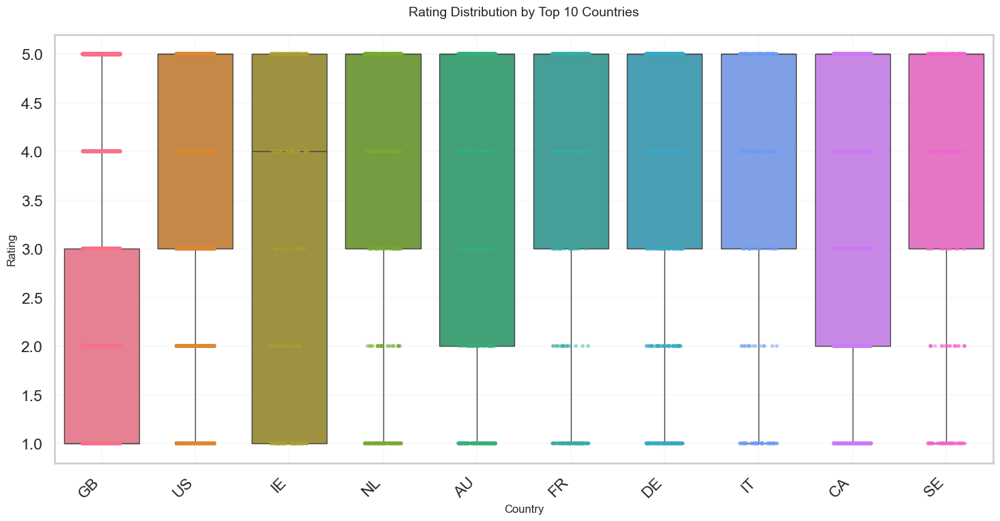

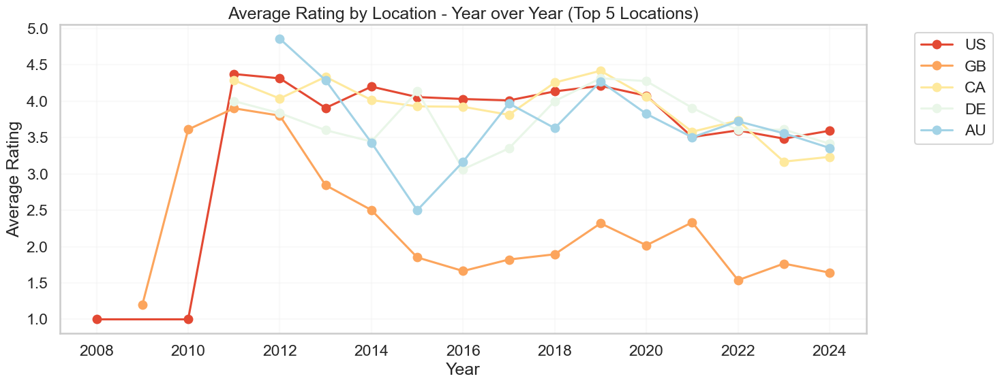

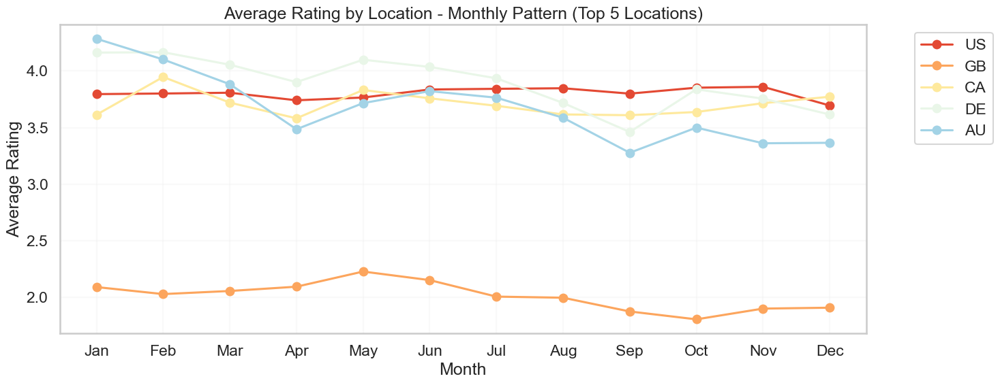

Summary Statistics by Location:
          count  mean  median   std
location                           
AU          653  3.66     5.0  1.66
CA         3326  3.71     5.0  1.61
DE          957  3.93     5.0  1.51
FR          495  3.91     5.0  1.56
GB        16696  2.01     1.0  1.60
IE          275  3.44     4.0  1.77
IT          277  3.87     5.0  1.53
NL          559  3.79     5.0  1.60
SE          325  3.89     5.0  1.53
US        71106  3.79     5.0  1.50


In [96]:
# Location Analysis
print("LOCATION ANALYSIS")

# Get top 10 locations and filter DataFrame
top_locations = df_trustpilot['location'].value_counts().head(10).index
df_filtered = df_trustpilot[df_trustpilot['location'].isin(top_locations)]

# Basic metrics by location (separated by data type)
numeric_analysis = df_filtered.groupby('location').agg({
    'rating': ['count', 'mean', 'std', 'median'],
    'repeat_reviewer_encoded': 'mean'
}).round(3)

# Handle verification separately (categorical)
verification_pcts = df_filtered.groupby('location')['verification'].apply(
    lambda x: (x == 'verified').mean()
).round(3)

# Combine the analyses
location_analysis = numeric_analysis.copy()
location_analysis['verification'] = verification_pcts

# Flatten column names
location_analysis.columns = ['Total_Reviews', 'Avg_Rating', 'Std_Rating', 
                           'Median_Rating', 'Pct_Repeat_Reviewers', 'Pct_Verified']
print("Basic Location Metrics:")
print(location_analysis)

# Day of week distribution by location
day_distribution = pd.crosstab(df_filtered['location'], 
                              df_filtered['day_of_week_posted'], 
                              normalize='index').round(3) * 100
print("Day of Week Distribution by Location (%):")
print(day_distribution)

# Time of day distribution by location
time_distribution = pd.crosstab(df_filtered['location'], 
                               df_filtered['time_of_day'], 
                               normalize='index').round(3) * 100
print("Time of Day Distribution by Location (%):")
print(time_distribution)

# Rating distribution by location
rating_distribution = pd.crosstab(df_filtered['location'], 
                                 df_filtered['rating'], 
                                 normalize='index').round(3) * 100
print("Rating Distribution by Location (%):")
print(rating_distribution)

# Recent trends (last 90 days)
recent_cutoff = df_filtered['local_date_posted'].max() - pd.Timedelta(days=90)
recent_data = df_filtered[df_filtered['local_date_posted'] >= recent_cutoff]

recent_numeric = recent_data.groupby('location').agg({
    'rating': ['count', 'mean']
}).round(3)

recent_verification = recent_data.groupby('location')['verification'].apply(
    lambda x: (x == 'verified').mean()
).round(3)

recent_repeat = recent_data.groupby('location')['repeat_reviewer_encoded'].mean().round(3)

# Combine recent analyses
recent_analysis = pd.DataFrame({
    'Recent_Review_Count': recent_numeric[('rating', 'count')],
    'Recent_Avg_Rating': recent_numeric[('rating', 'mean')],
    'Recent_Verification_Rate': recent_verification,
    'Recent_Repeat_Reviewer_Rate': recent_repeat
})

print("Recent 90-Day Metrics by Location:")
print(recent_analysis)

# Visualizations
plt.figure(figsize=(15, 8))
sns.boxplot(x='location', y='rating', data=df_filtered,
            palette='husl',
            showfliers=False)
sns.stripplot(x='location', y='rating', data=df_filtered,
              palette='husl',
              size=4,
              jitter=0.2,
              alpha=0.5)
plt.title('Rating Distribution by Top 10 Countries', fontsize=14, pad=20)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Rating', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Year over Year Analysis (Top 5)
top_5_locations = df_trustpilot['location'].value_counts().head(5).index
df_filtered_top5 = df_filtered[df_filtered['location'].isin(top_5_locations)]

plt.figure(figsize=(15, 6))
for location in top_5_locations:
    yearly_avg = df_filtered_top5[df_filtered_top5['location'] == location].groupby(
        df_filtered_top5['local_date_posted'].dt.year)['rating'].mean()
    plt.plot(yearly_avg.index, yearly_avg.values, marker='o', label=location)

plt.title('Average Rating by Location - Year over Year (Top 5 Locations)')
plt.xlabel('Year')
plt.ylabel('Average Rating')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Month over Month Analysis (Top 5)
plt.figure(figsize=(15, 6))
for location in top_5_locations:
    location_data = df_filtered_top5[df_filtered_top5['location'] == location]
    monthly_avg = location_data.groupby(
        location_data['local_date_posted'].dt.month)['rating'].mean()
    plt.plot(range(1, 13), monthly_avg, marker='o', label=location)

plt.title('Average Rating by Location - Monthly Pattern (Top 5 Locations)')
plt.xlabel('Month')
plt.ylabel('Average Rating')
plt.xticks(range(1, 13), 
          ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
           'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("Summary Statistics by Location:")
print(df_filtered.groupby('location')['rating'].agg(['count', 'mean', 'median', 'std']).round(2))

In [97]:
#Choropleth plot

# Aggregate ratings by location
location_ratings = df_trustpilot.groupby('location')['rating'].mean().reset_index()

# Convert ISO-2 to ISO-3 country codes
cc = coco.CountryConverter()
location_ratings['location_iso3'] = cc.convert(location_ratings['location'], to='ISO3')

# Create choropleth map
fig = px.choropleth(location_ratings,
                    locations='location_iso3',  # Use the new ISO-3 column
                    locationmode='ISO-3',  # Now we can use ISO-3
                    color='rating',
                    color_continuous_scale="RdYlGn",
                    range_color=(1, 5),
                    title='Average Ratings by Country',
                    labels={'rating': 'Average Rating'}
                    )

# Update layout
fig.update_layout(
    margin={"r":0,"t":30,"l":0,"b":0},
    title_x=0.5,
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type='equirectangular'
    )
)

print("\nRating statistics:")
print(location_ratings['rating'].describe())

fig.show()


Rating statistics:
count    172.000
mean       3.888
std        0.770
min        1.000
25%        3.570
50%        3.943
75%        4.310
max        5.000
Name: rating, dtype: float64


USERNAME ANALYSIS
Analyzing user patterns for top 10 companies:
company
Quicken         26762
Inkfarm.com     21766
Asda            12552
SteelSeries     12395
SCUFGaming      10367
Rebtel           4497
LegalMatch       2008
Solis            1772
BeenVerified     1547
FreedomPop       1296
Name: count, dtype: int64
USER ANALYSIS FOR Quicken
Top 5 reviewers for Quicken:
username
Customer    521
John        108
David        75
Michael      66
Richard      56
Name: count, dtype: int64
Reviewer Metrics for Quicken:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
Customer            521       3.537       1.357            4.0                0.697           0.0
David                75       3.493       1.389            4.0                0.773           0.0
John                108       3.426       1.389            4.0                0.759       

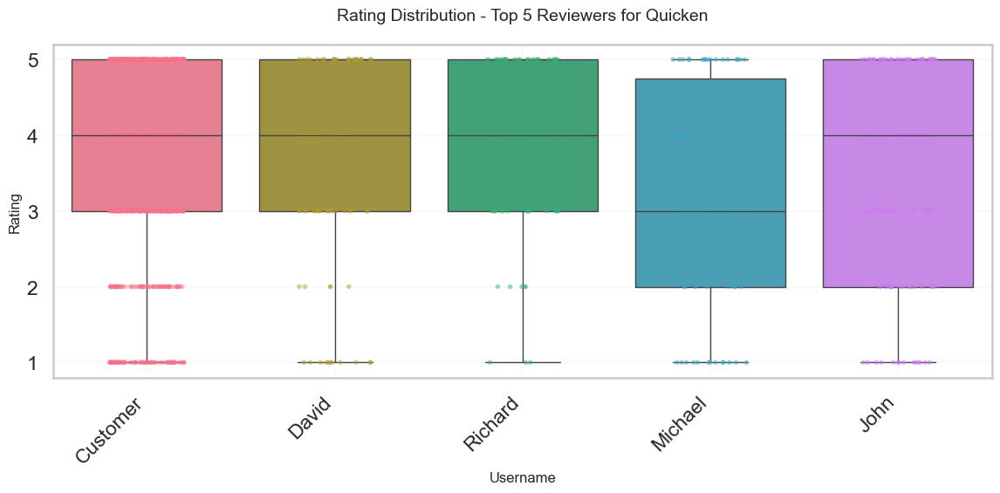

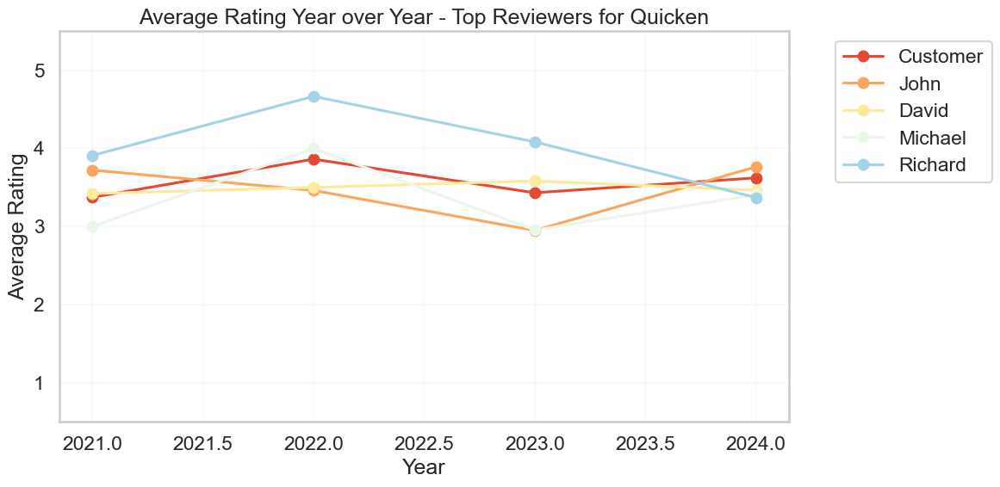

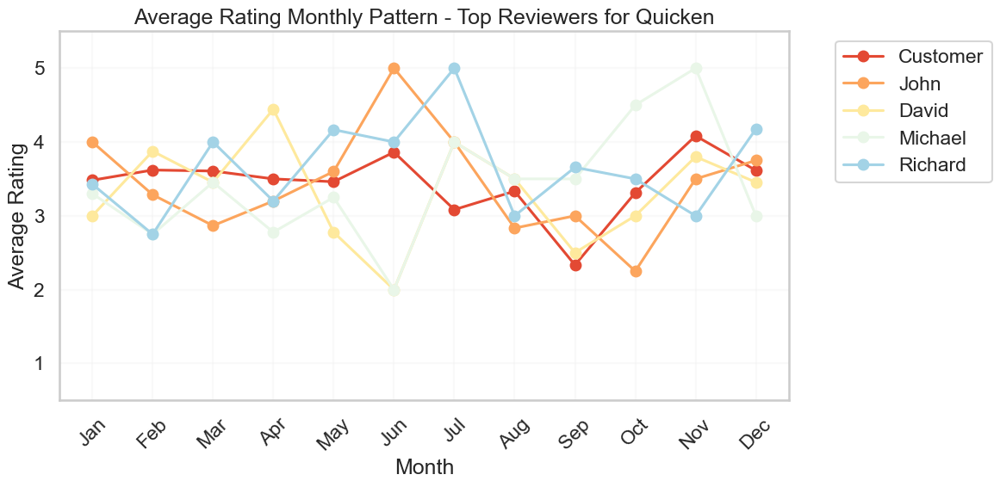

USER ANALYSIS FOR Inkfarm.com
Top 5 reviewers for Inkfarm.com:
username
John       511
Robert     468
James      390
David      358
Richard    293
Name: count, dtype: int64
Reviewer Metrics for Inkfarm.com:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
David               358       4.243       1.283            5.0                0.427           0.0
James               390       4.149       1.345            5.0                0.377           0.0
John                511       4.331       1.187            5.0                0.405           0.0
Richard             293       4.287       1.290            5.0                0.416           0.0
Robert              468       4.256       1.278            5.0                0.382           0.0


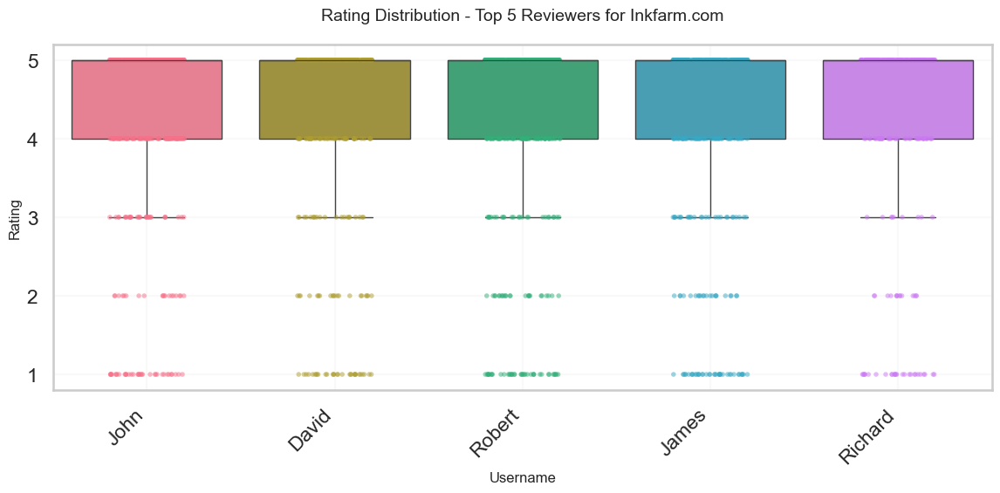

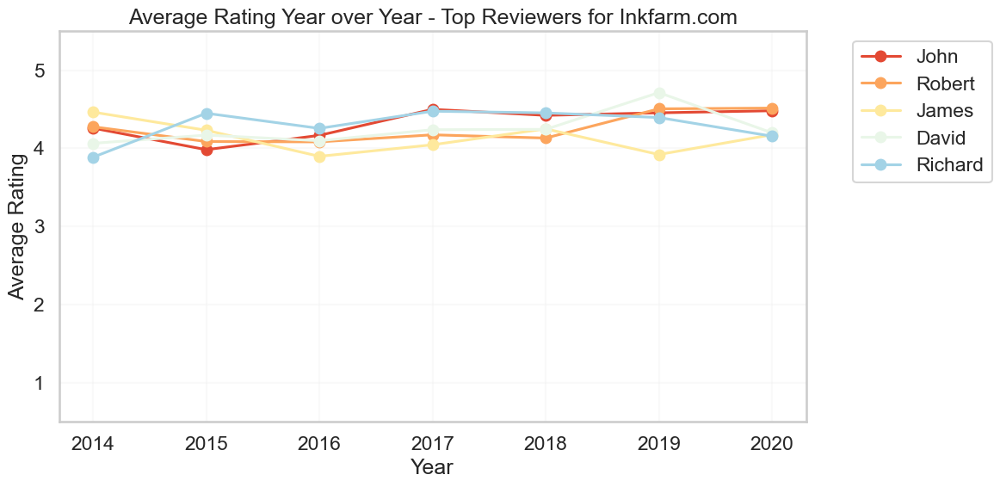

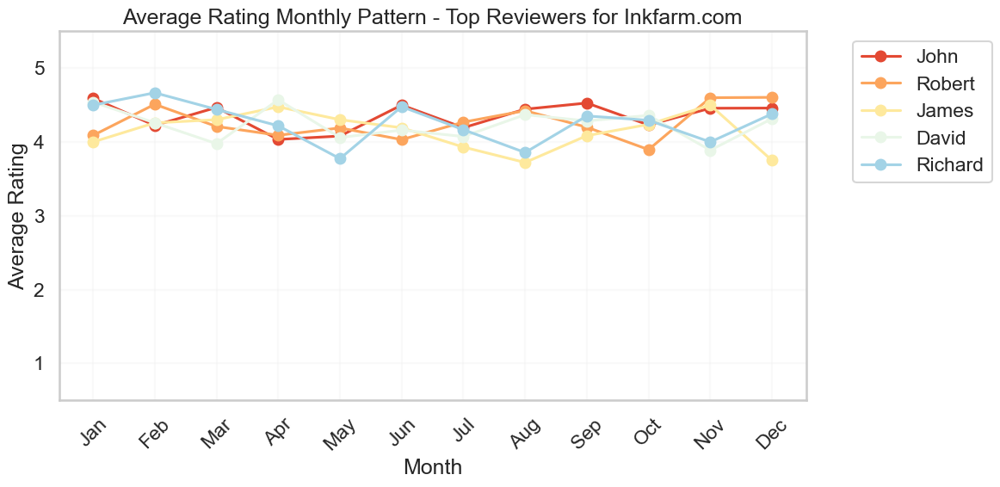

USER ANALYSIS FOR Asda
Top 5 reviewers for Asda:
username
Customer    145
Paul         43
Consumer     39
John         35
David        30
Name: count, dtype: int64
Reviewer Metrics for Asda:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
Consumer             39       1.436       1.119            1.0                0.590           0.0
Customer            145       1.517       1.185            1.0                0.979           0.0
David                30       2.333       1.668            1.0                0.967           0.0
John                 35       1.886       1.510            1.0                0.971           0.0
Paul                 43       1.558       1.240            1.0                0.930           0.0


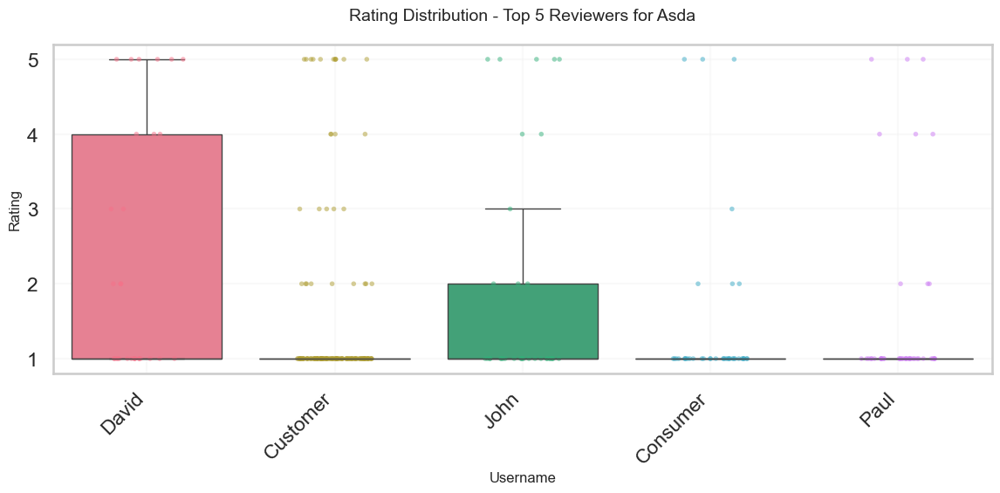

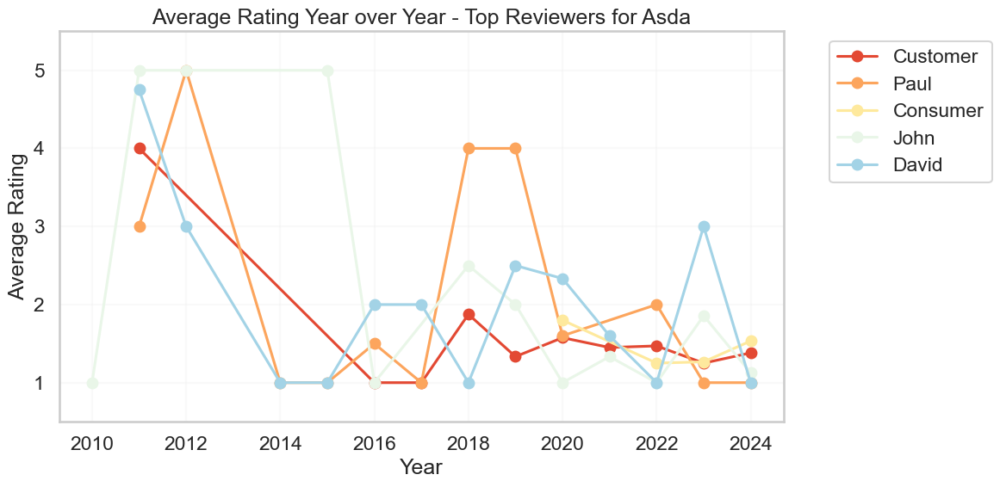

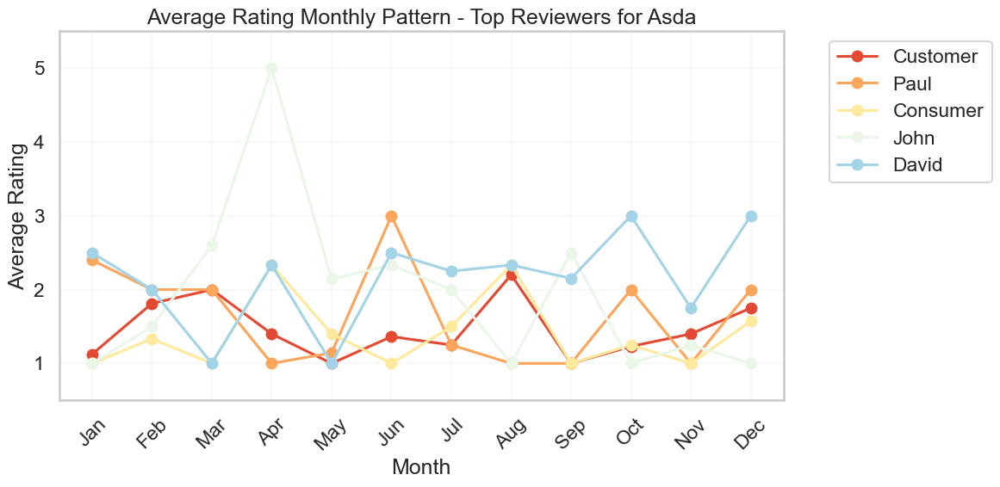

USER ANALYSIS FOR SteelSeries
Top 5 reviewers for SteelSeries:
username
Customer    110
Chris        52
Alex         49
Michael      44
Daniel       41
Name: count, dtype: int64
Reviewer Metrics for SteelSeries:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
Alex                 49       3.857       1.555            5.0                0.265           0.0
Chris                52       3.577       1.742            5.0                0.288           0.0
Customer            110       3.700       1.651            5.0                0.673           0.0
Daniel               41       3.244       1.758            4.0                0.366           0.0
Michael              44       3.114       1.895            3.5                0.364           0.0


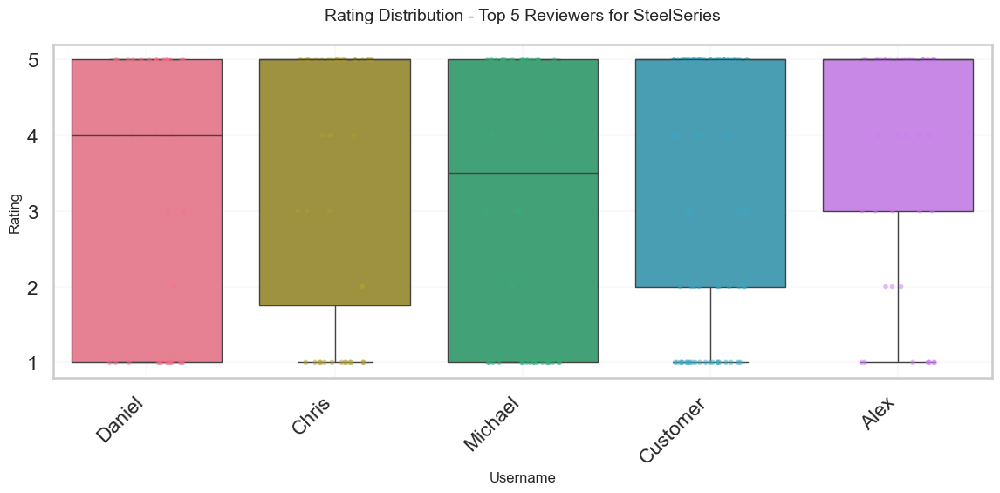

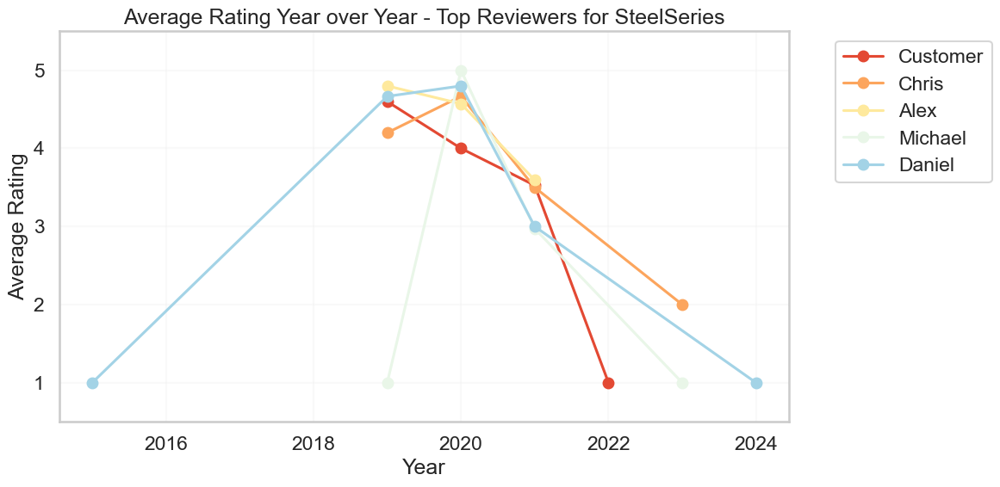

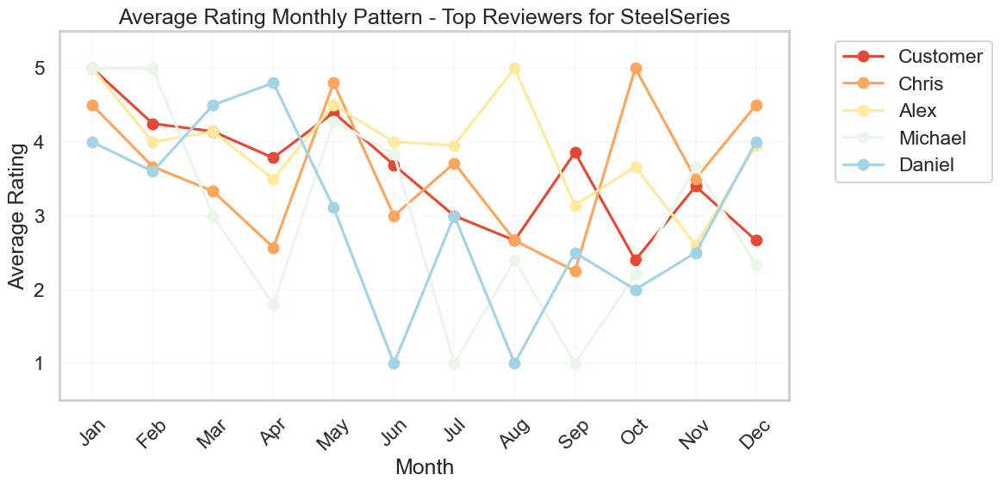

USER ANALYSIS FOR SCUFGaming
Top 5 reviewers for SCUFGaming:
username
Customer    71
Mike        22
Matt        21
Chris       16
Nick        14
Name: count, dtype: int64
Reviewer Metrics for SCUFGaming:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
Chris                16       3.250       1.770            3.5                0.438           0.0
Customer             71       3.775       1.717            5.0                0.718           0.0
Matt                 21       3.381       1.717            4.0                0.381           0.0
Mike                 22       3.682       1.836            5.0                0.318           0.0
Nick                 14       4.071       1.439            5.0                0.500           0.0


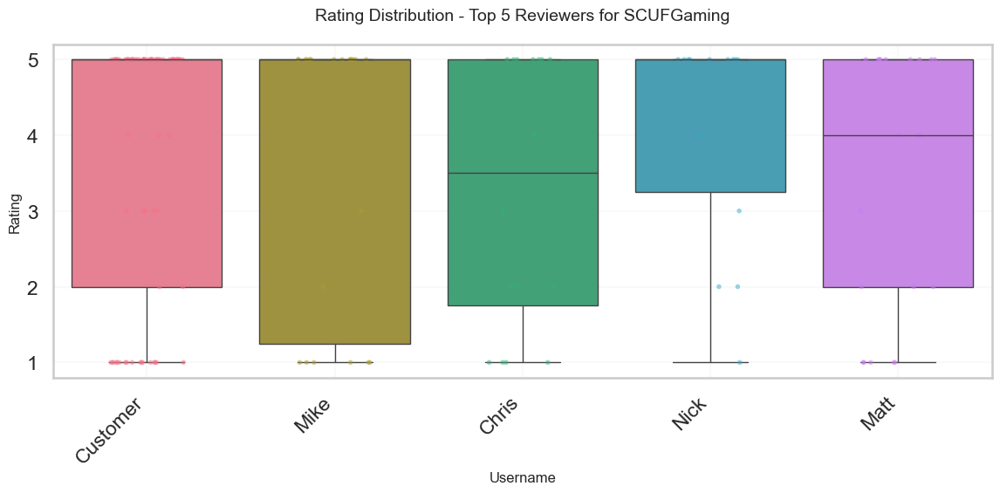

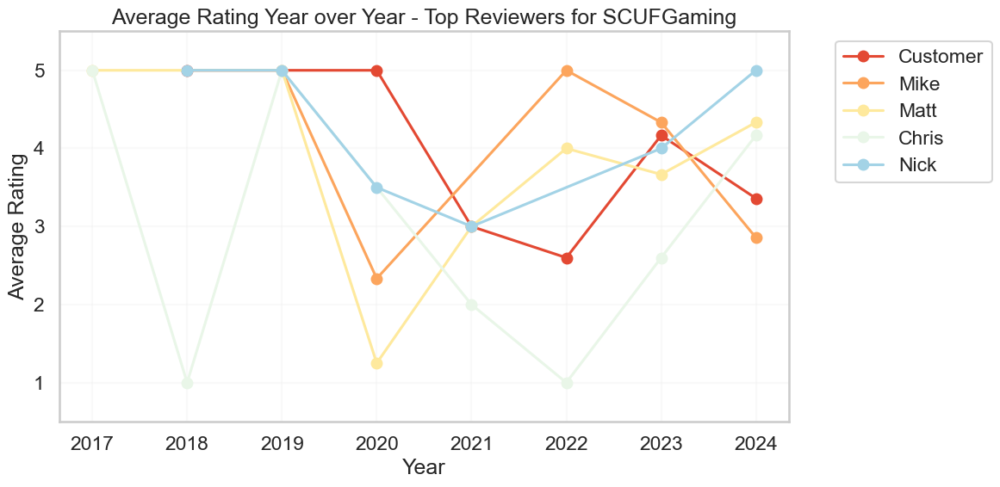

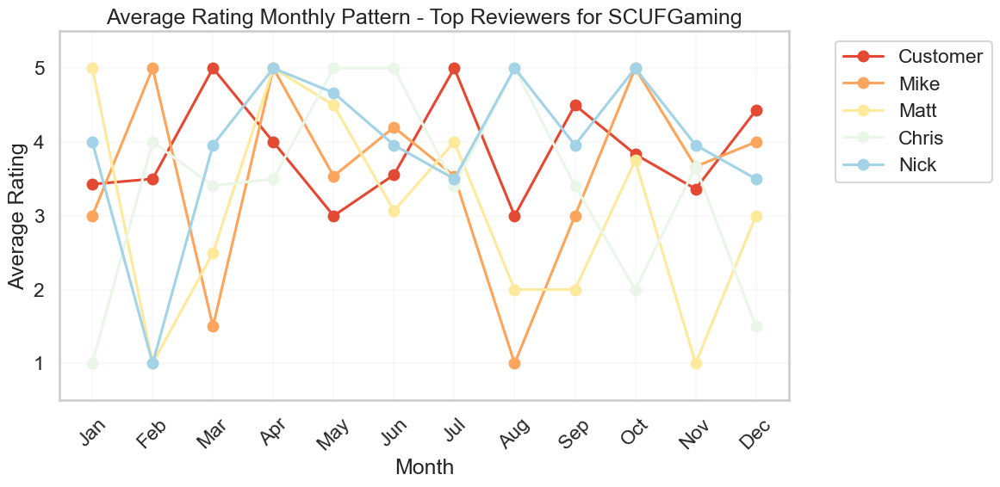

USER ANALYSIS FOR Rebtel
Top 5 reviewers for Rebtel:
username
Customer    78
Daniel      12
David       12
Michael     11
Joseph      10
Name: count, dtype: int64
Reviewer Metrics for Rebtel:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
Customer             78       3.462       1.593            4.0                0.269           0.0
Daniel               12       3.667       1.303            4.0                0.333           0.0
David                12       3.583       1.621            4.0                0.167           0.0
Joseph               10       3.800       1.229            4.0                0.300           0.0
Michael              11       3.818       1.471            4.0                0.182           0.0


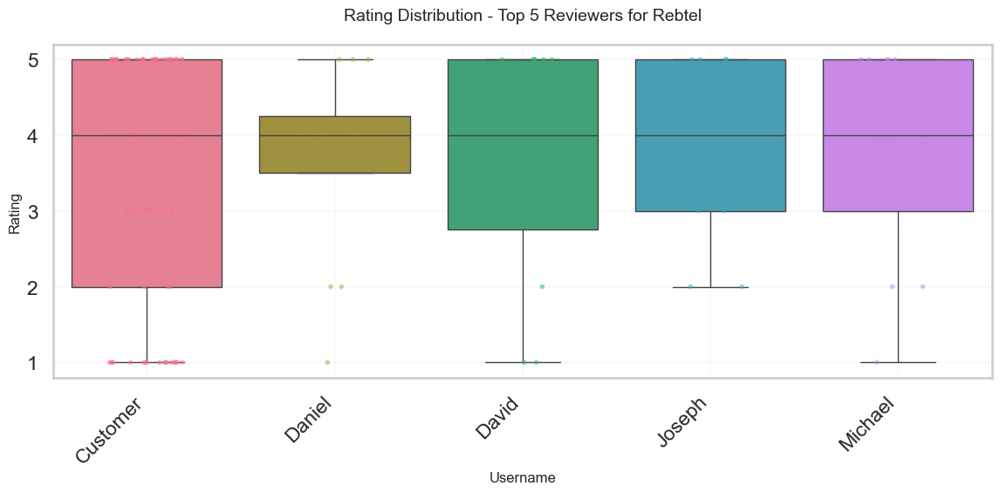

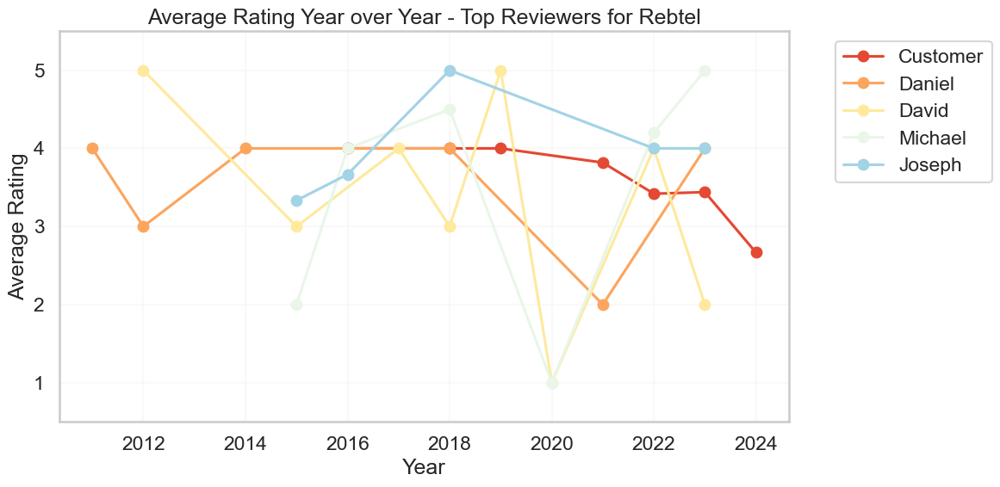

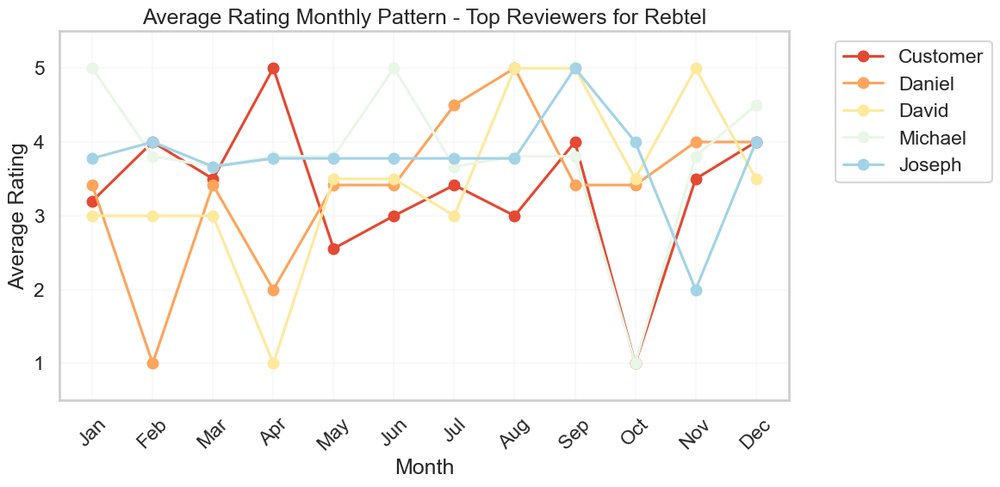

USER ANALYSIS FOR LegalMatch
Top 5 reviewers for LegalMatch:
username
Robert      23
Customer    21
John        20
James       18
David       17
Name: count, dtype: int64
Reviewer Metrics for LegalMatch:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
Customer             21       4.000       1.449            5.0                0.238           0.0
David                17       3.941       1.391            4.0                0.118           0.0
James                18       3.444       1.504            4.0                0.222           0.0
John                 20       3.900       1.483            4.5                0.300           0.0
Robert               23       4.348       1.112            5.0                0.522           0.0


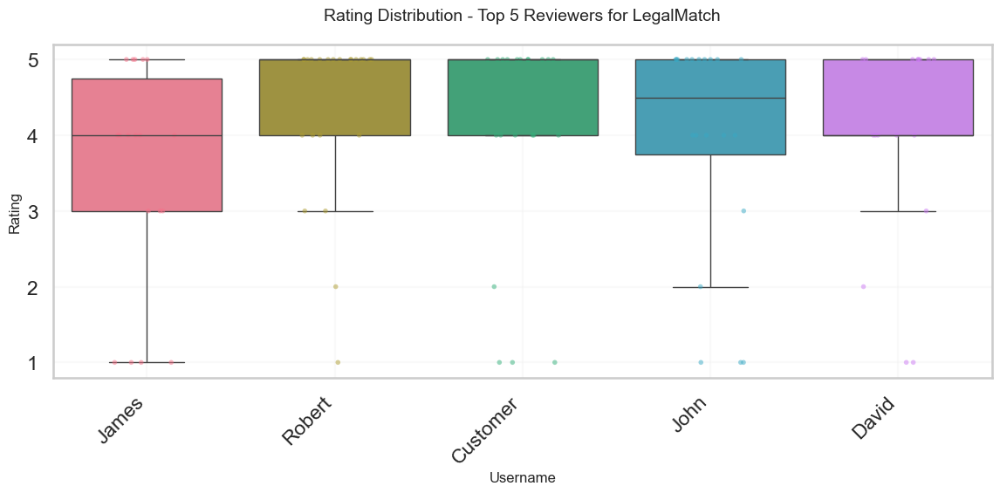

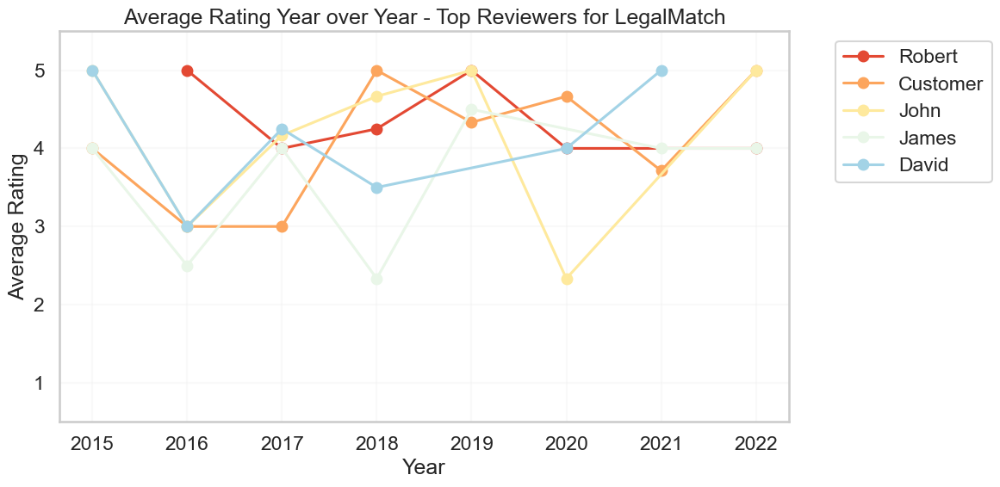

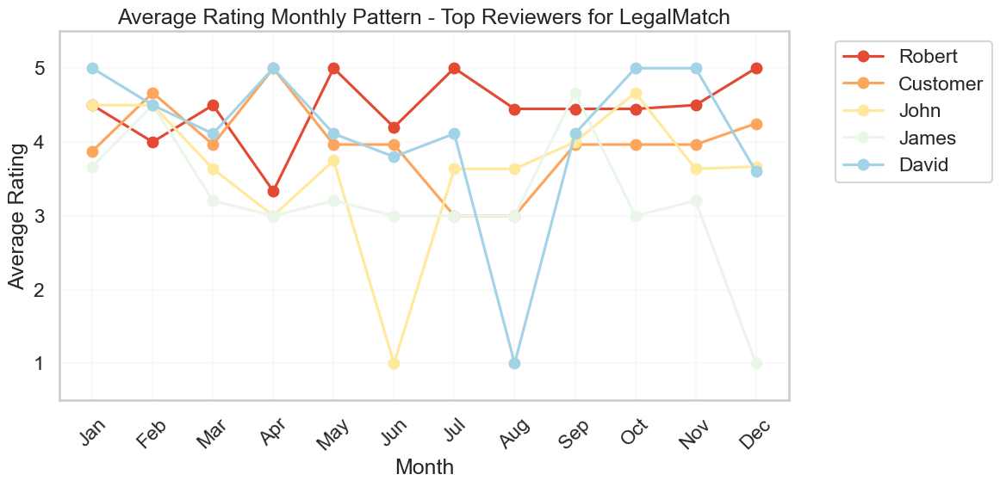

USER ANALYSIS FOR Solis
Top 5 reviewers for Solis:
username
Customer    9
Chris       6
Robert      5
Mary        4
Mark        4
Name: count, dtype: int64
Reviewer Metrics for Solis:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
Chris                 6       4.000       1.265            4.5                0.167           0.0
Customer              9       3.778       1.093            4.0                0.889           0.0
Mark                  4       4.750       0.500            5.0                0.500           0.0
Mary                  4       4.500       1.000            5.0                0.500           0.0
Robert                5       4.000       1.414            5.0                0.600           0.0


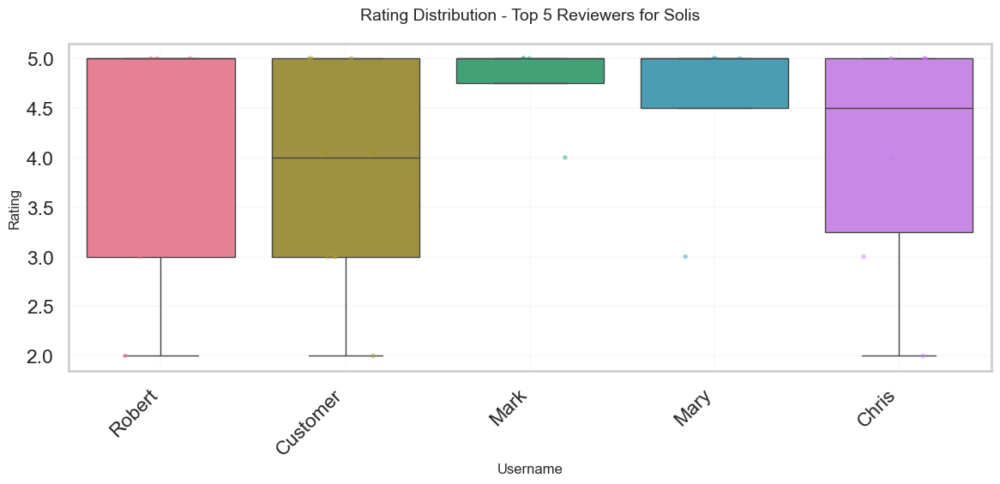

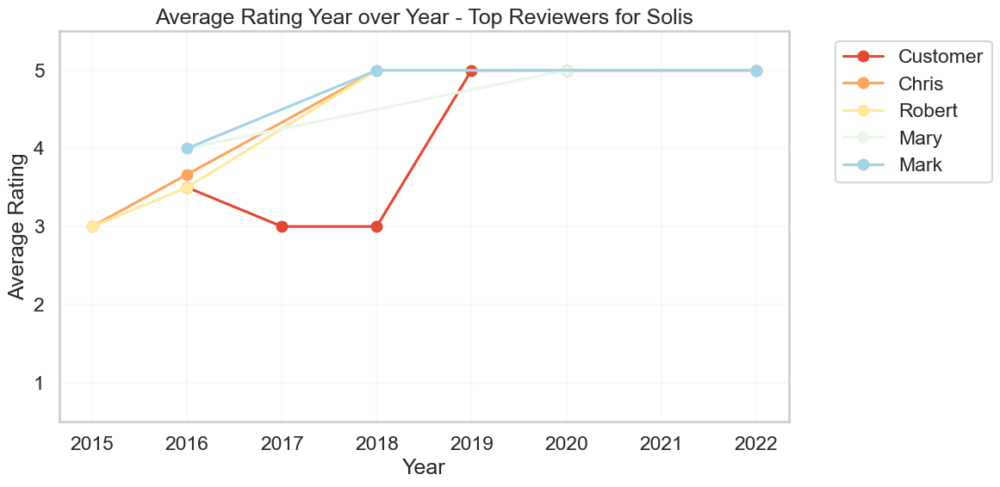

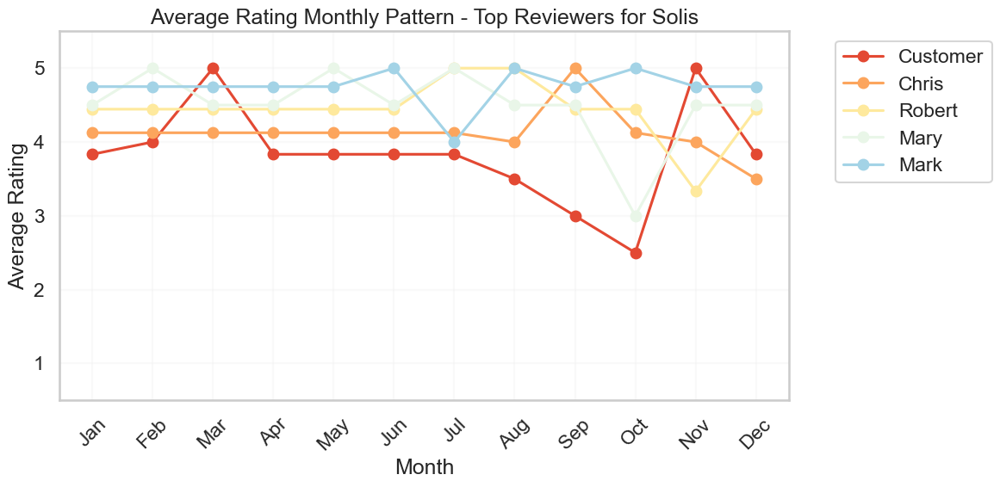

USER ANALYSIS FOR BeenVerified
Top 5 reviewers for BeenVerified:
username
Customer    97
Michael      6
Robert       6
Susan        5
Linda        5
Name: count, dtype: int64
Reviewer Metrics for BeenVerified:
          Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                         
Customer             97       3.113       1.725            3.0                0.237           0.0
Linda                 5       2.400       1.517            2.0                0.400           0.0
Michael               6       4.167       1.602            5.0                0.500           0.0
Robert                6       3.167       1.835            3.5                0.833           0.0
Susan                 5       2.000       1.000            2.0                0.600           0.0


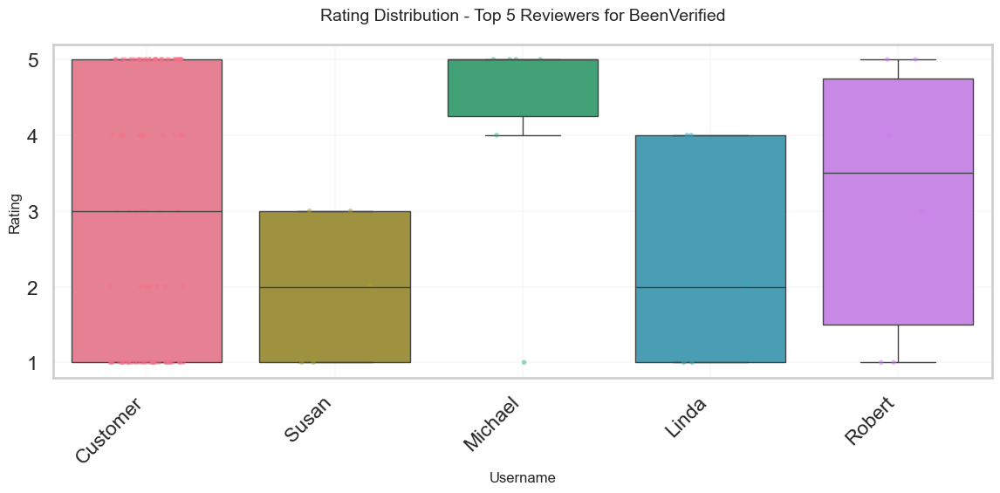

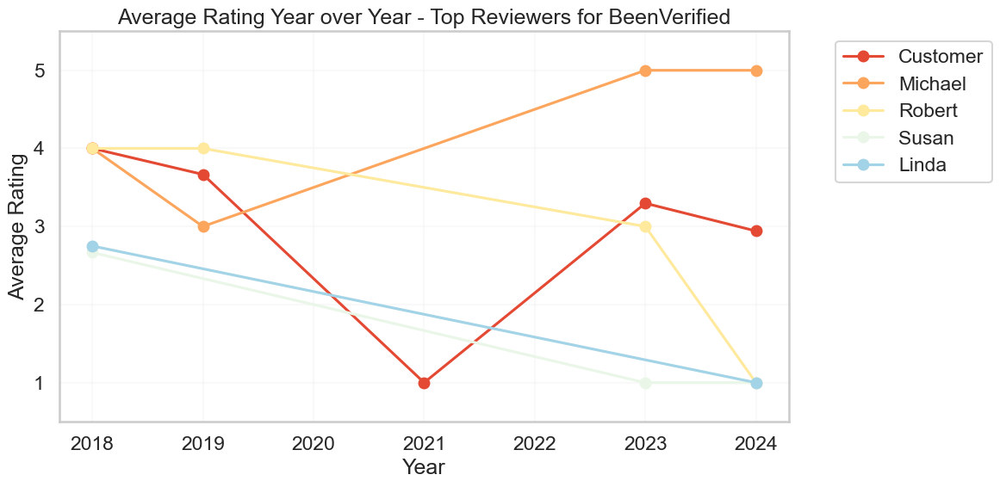

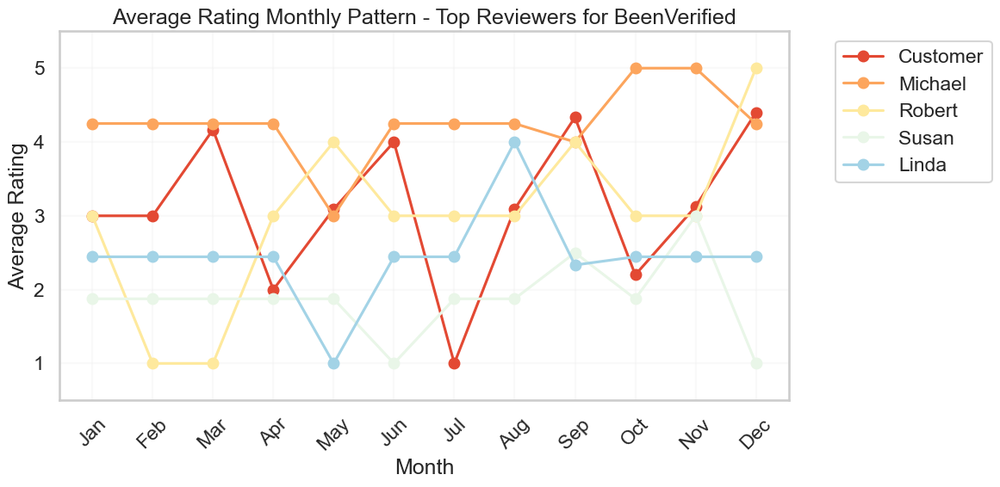

USER ANALYSIS FOR FreedomPop
Top 5 reviewers for FreedomPop:
username
Freedompop Customer    9
David                  8
John                   5
Bill                   5
James                  3
Name: count, dtype: int64
Reviewer Metrics for FreedomPop:
                     Total_Reviews  Avg_Rating  Std_Rating  Median_Rating  Pct_Repeat_Reviewer  Pct_Verified
username                                                                                                    
Bill                             5       3.200       1.483            3.0                0.200           0.0
David                            8       2.250       1.753            1.0                0.625           0.0
Freedompop Customer              9       2.111       1.691            1.0                0.111           0.0
James                            3       2.333       1.528            2.0                0.333           0.0
John                             5       3.600       1.949            5.0                0.4

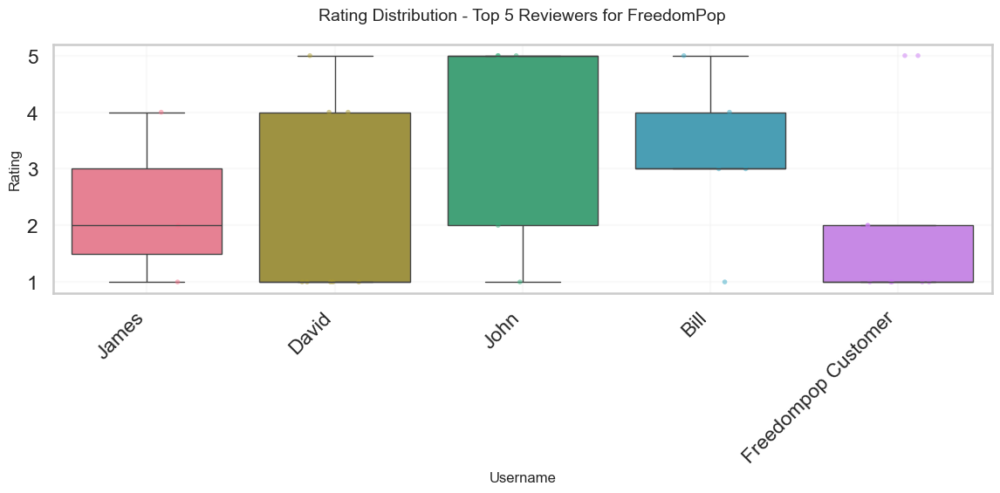

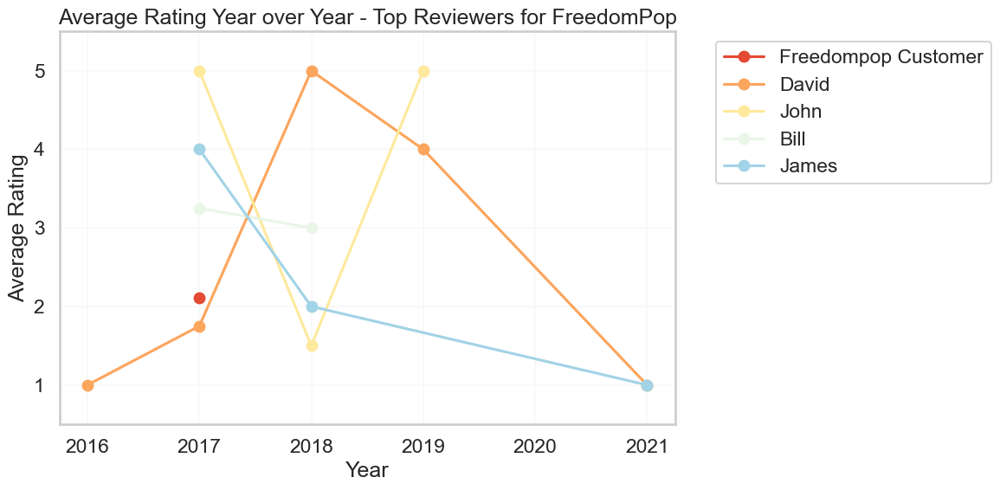

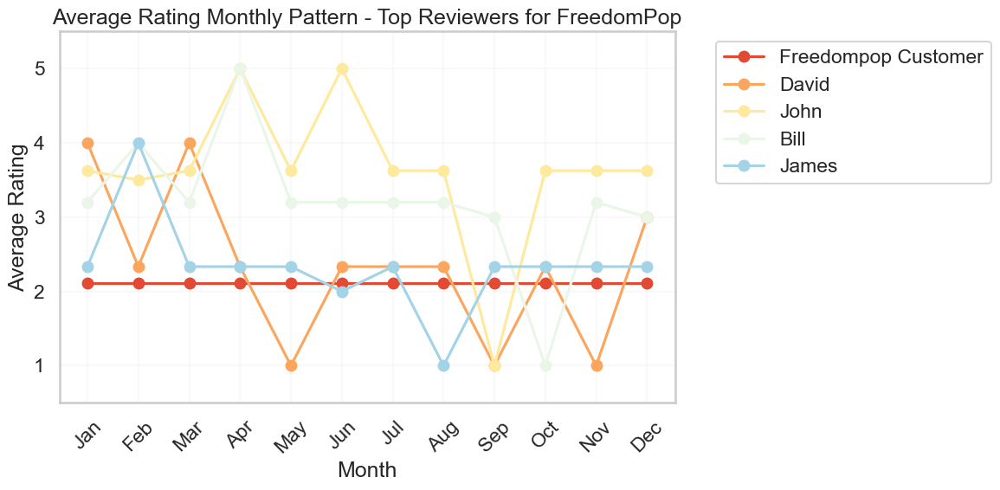

In [98]:
# Username analysis
print("USERNAME ANALYSIS")

top_companies = df_trustpilot['company'].value_counts().head(10)
print("Analyzing user patterns for top 10 companies:")
print(top_companies)

for company in top_companies.index:
    print(f"USER ANALYSIS FOR {company}")
    print("="*50)
    
    # Get company data
    company_data = df_trustpilot[df_trustpilot['company'] == company]
    
    # Get top reviewers
    top_company_users = company_data['username'].value_counts().head(5)
    print(f"Top 5 reviewers for {company}:")
    print(top_company_users)
    
    # Filter data for top reviewers
    df_filtered = company_data[company_data['username'].isin(top_company_users.index)]
    
    # Separate numeric and categorical analyses
    numeric_analysis = df_filtered.groupby('username').agg({
        'rating': ['count', 'mean', 'std', 'median'],
        'repeat_reviewer_encoded': 'mean'
    }).round(3)
    
    # Handle verification separately
    verification_pcts = df_filtered.groupby('username')['verification'].apply(
        lambda x: (x == 'verified').mean()
    ).round(3)
    
    # Combine analyses
    user_analysis = numeric_analysis.copy()
    user_analysis[('verification', 'mean')] = verification_pcts
    
    # Flatten column names
    user_analysis.columns = ['Total_Reviews', 'Avg_Rating', 'Std_Rating', 
                           'Median_Rating', 'Pct_Repeat_Reviewer', 'Pct_Verified']
    
    print(f"Reviewer Metrics for {company}:")
    print(user_analysis)
    
    # Rating distribution plot
    plt.figure(figsize=(12, 6))
    colors = sns.color_palette("husl", n_colors=len(top_company_users))
    
    sns.boxplot(x='username', y='rating', data=df_filtered,
                palette=colors,
                boxprops={'zorder': 1},
                showfliers=False)
    
    sns.stripplot(x='username', y='rating', data=df_filtered,
                  palette=colors,
                  size=4,
                  jitter=0.2,
                  alpha=0.5,
                  zorder=2)
    
    plt.title(f'Rating Distribution - Top 5 Reviewers for {company}', fontsize=14, pad=20)
    plt.xlabel('Username', fontsize=12)
    plt.ylabel('Rating', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Year over Year Analysis
    plt.figure(figsize=(12, 6))
    for user in top_company_users.index:
        user_data = df_filtered[df_filtered['username'] == user]
        yearly_avg = user_data.groupby(
            user_data['local_date_posted'].dt.year)['rating'].mean()
        if not yearly_avg.empty:  
            plt.plot(yearly_avg.index, yearly_avg.values, marker='o', label=user)
    
    plt.title(f'Average Rating Year over Year - Top Reviewers for {company}')
    plt.xlabel('Year')
    plt.ylabel('Average Rating')
    plt.ylim(0.5, 5.5)  
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Monthly Pattern Analysis
    plt.figure(figsize=(12, 6))
    months = range(1, 13)
    
    for user in top_company_users.index:
        user_data = df_filtered[df_filtered['username'] == user]
        user_monthly = user_data.groupby(
            user_data['local_date_posted'].dt.month)['rating'].mean()
        
        if not user_monthly.empty:  
            monthly_avg = pd.Series(index=months)
            monthly_avg[user_monthly.index] = user_monthly
            monthly_avg = monthly_avg.fillna(user_monthly.mean())
            
            plt.plot(months, monthly_avg, marker='o', label=user)
    
    plt.title(f'Average Rating Monthly Pattern - Top Reviewers for {company}')
    plt.xlabel('Month')
    plt.ylabel('Average Rating')
    plt.ylim(0.5, 5.5)  
    plt.xticks(months, ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
               rotation=45)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

COMPANY ANALYSIS - UNIQUE PATTERNS
Company Metrics:
              Total_Reviews  Avg_Rating  Rating_Std  Repeat_Reviewer_Rate  Unique_Reviewers  Peak_Hour  Verification_Rate  Countries_Present  Avg_Review_Time
company                                                                                                                                                      
Asda                  12552       1.520       1.203                 0.826             10447         16                0.0                 48            0.812
BeenVerified           1547       3.356       1.661                 0.420              1342         19                0.0                 22            0.490
FreedomPop             1296       3.041       1.781                 0.394              1241         16                0.0                 23            0.951
Inkfarm.com           21766       4.218       1.319                 0.435              6707         13                0.0                 28            0.995


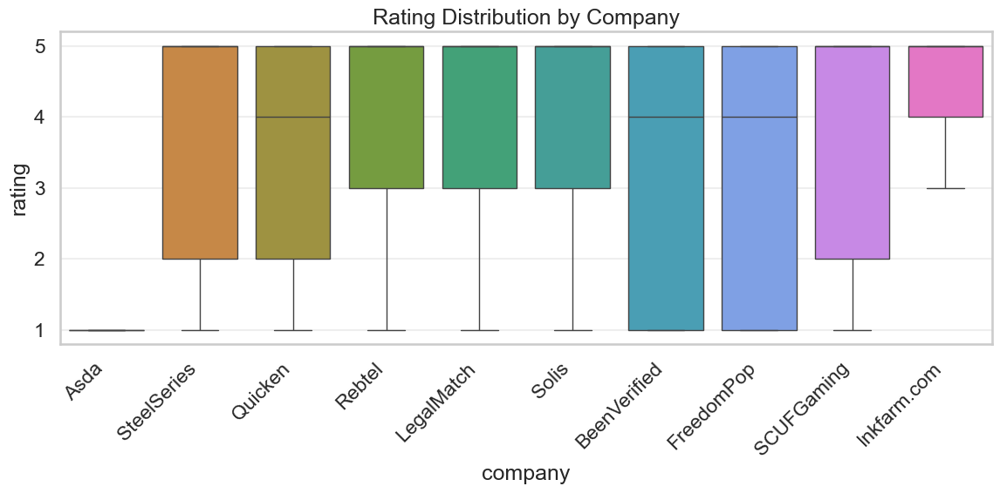

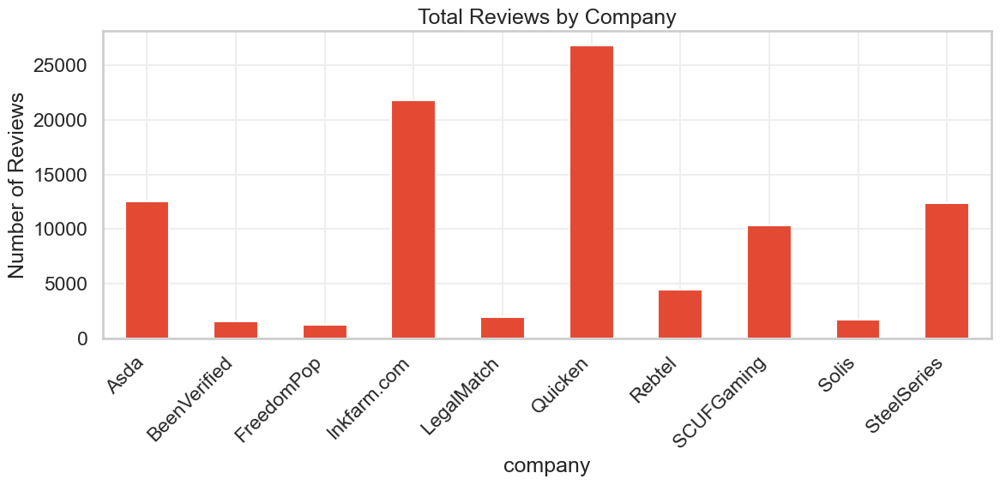

In [99]:
# Company analysis
print("COMPANY ANALYSIS - UNIQUE PATTERNS")
print("="*50)

top_companies = df_trustpilot['company'].value_counts().head(10)
df_filtered = df_trustpilot[df_trustpilot['company'].isin(top_companies.index)]

# Split aggregations by data type
numeric_analysis = df_filtered.groupby('company').agg({
    'rating': ['count', 'mean', 'std'],
    'repeat_reviewer_encoded': 'mean',
    'username': 'nunique',
    'local_hour': lambda x: x.mode()[0]
}).round(3)

# Handle categorical columns separately
verification_rate = df_filtered.groupby('company')['verification'].apply(
    lambda x: (x == 'verified').mean()
).round(3)

location_count = df_filtered.groupby('company')['location'].nunique()

review_time_encoded = df_filtered.groupby('company')['review_time_encoded'].mean().round(3)

# Combine all analyses
company_analysis = numeric_analysis.copy()
company_analysis['verification_rate'] = verification_rate
company_analysis['countries_present'] = location_count
company_analysis['avg_review_time'] = review_time_encoded

# Flatten and rename columns
company_analysis.columns = ['Total_Reviews', 'Avg_Rating', 'Rating_Std',
                          'Repeat_Reviewer_Rate', 'Unique_Reviewers', 
                          'Peak_Hour', 'Verification_Rate', 
                          'Countries_Present', 'Avg_Review_Time']

print("Company Metrics:")
print(company_analysis)

print("Customer Base Analysis:")
print("="*50)

for company in top_companies.index:
    company_data = df_filtered[df_filtered['company'] == company]
    reviews_per_user = company_data.groupby('username').size()
    
    print(f"{company}:")
    print("-"*30)
    print(f"Total Reviews: {len(company_data):,}")
    print(f"Unique Reviewers: {len(reviews_per_user):,}")
    print(f"Reviews per Customer: {reviews_per_user.mean():.2f}")
    print(f"One-time Reviewers: {(reviews_per_user == 1).sum():,} "
          f"({(reviews_per_user == 1).mean()*100:.1f}%)")
    print(f"Loyal Customers (>5 reviews): {(reviews_per_user > 5).sum():,}")
    print(f"Countries: {company_data['location'].nunique()}")
    
    # Handle potential empty mode
    most_common_country = company_data['location'].mode()
    if len(most_common_country) > 0:
        print(f"Most Common Country: {most_common_country[0]}")
    else:
        print("Most Common Country: No data")

# Optional: Add visualizations
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_filtered, x='company', y='rating', 
            palette='husl',
            showfliers=False)
plt.xticks(rotation=45, ha='right')
plt.title('Rating Distribution by Company')
plt.tight_layout()
plt.show()

# Reviews per company
plt.figure(figsize=(12, 6))
company_analysis['Total_Reviews'].plot(kind='bar')
plt.title('Total Reviews by Company')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Reviews')
plt.tight_layout()
plt.show()

Sentiment Scores by Location:
         Sentiment_Blob               Sentiment_VADER              
                   mean    std median            mean    std median
location                                                           
AD                0.335  0.068  0.335           0.249  0.835  0.249
AE                0.232  0.353  0.206           0.420  0.519  0.637
AF                0.372  0.113  0.392           0.759  0.218  0.791
AG                0.304  0.288  0.278           0.566  0.494  0.791
AL                0.117  0.247  0.000           0.076  0.102  0.077
AM                0.073  0.531  0.168           0.339  0.708  0.710
AO                0.754  0.349  0.754           0.716  0.129  0.716
AR                0.144  0.227  0.000           0.353  0.441  0.382
AT                0.307  0.294  0.306           0.530  0.495  0.718
AU                0.233  0.305  0.226           0.447  0.516  0.648
AW                0.322  0.376  0.200           0.234  0.523  0.340
AX                

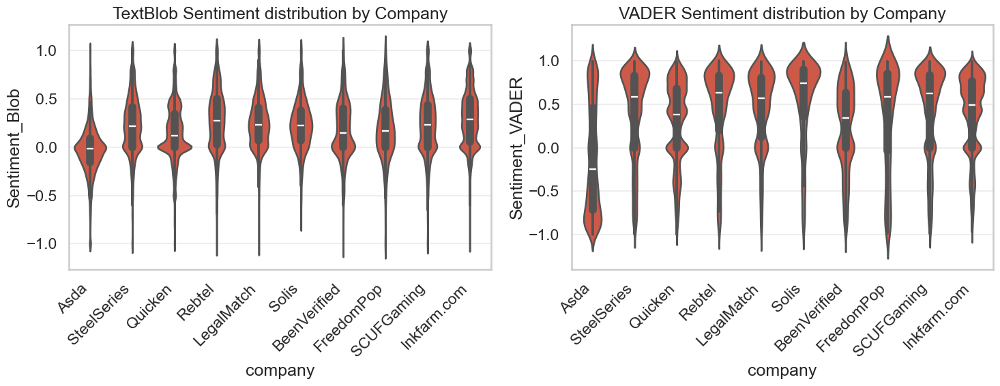

Sentiment Analysis for Top Reviewers of Quicken:
         Sentiment_Blob               Sentiment_VADER              
                   mean    std median            mean    std median
username                                                           
Customer          0.134  0.281  0.084           0.269  0.470  0.382
David             0.142  0.267  0.133           0.313  0.482  0.440
John              0.160  0.275  0.115           0.207  0.461  0.285
Michael           0.118  0.225  0.097           0.295  0.485  0.361
Richard           0.180  0.249  0.172           0.308  0.484  0.440
Sentiment Analysis for Top Reviewers of Inkfarm.com:
         Sentiment_Blob               Sentiment_VADER              
                   mean    std median            mean    std median
username                                                           
David             0.276  0.298  0.250           0.337  0.466  0.440
James             0.272  0.293  0.248           0.318  0.446  0.440
John          

In [100]:
#sentiment
def analyze_sentiment_by_groups():
    # Location analysis
    location_sentiment = df_filtered.groupby('location').agg({
        'Sentiment_Blob': ['mean', 'std', 'median'],
        'Sentiment_VADER': ['mean', 'std', 'median']
    }).round(3)
    print("Sentiment Scores by Location:")
    print(location_sentiment)
    
    # Company analysis
    company_sentiment = df_filtered.groupby('company').agg({
        'Sentiment_Blob_cat': ['mean', 'std', 'median'],
        'Sentiment_VADER_cat': ['mean', 'std', 'median']
    }).round(3)
    print("Sentiment Scores by Company:")
    print(company_sentiment)
    
    # Visualize for top companies
    plt.figure(figsize=(15, 6))
    plt.subplot(121)
    sns.violinplot(data=df_filtered, x='company', y='Sentiment_Blob')
    plt.xticks(rotation=45, ha='right')
    plt.title('TextBlob Sentiment distribution by Company')
    
    plt.subplot(122)
    sns.violinplot(data=df_filtered, x='company', y='Sentiment_VADER')
    plt.xticks(rotation=45, ha='right')
    plt.title('VADER Sentiment distribution by Company')
    plt.tight_layout()
    plt.show()
    
    # Username analysis (top reviewers per company)
    for company in top_companies.index:
        company_data = df_filtered[df_filtered['company'] == company]
        top_reviewers = company_data['username'].value_counts().head(5).index
        reviewer_sentiment = company_data[company_data['username'].isin(top_reviewers)].groupby('username').agg({
            'Sentiment_Blob': ['mean', 'std', 'median'],
            'Sentiment_VADER': ['mean', 'std', 'median']
        }).round(3)
        print(f"Sentiment Analysis for Top Reviewers of {company}:")
        print(reviewer_sentiment)

analyze_sentiment_by_groups()

In [101]:
#Inspecting final output 
df_trustpilot = df_trustpilot.drop('avg_word_length', axis=1)
print(df_trustpilot.columns)
print(df_trustpilot.info())
print("The Trustpilot dataset has ", df_trustpilot.shape[1], "columns")
print("The Trustpilot dataset has ", df_trustpilot.shape[0], "rows")
display(df_trustpilot.head())

Index(['rating', 'location', 'username', 'number_reviews', 'verification',
       'repeat_reviewer', 'repeat_reviewer_encoded', 'company', 'text',
       'text_processed', 'text_length', 'text_word_length', 'Sentiment_Blob',
       'Sentiment_Blob_cat', 'Sentiment_VADER', 'Sentiment_VADER_cat',
       'subject', 'subject_processed', 'subject_length', 'subject_word_length',
       'answer', 'answer_processed', 'answered_encoded', 'date_of_experience',
       'date_posted', 'local_date_posted', 'month_local', 'local_hour',
       'time_of_day', 'day_of_week_posted', 'day_type',
       'days_between_experience_and_post', 'review_time',
       'review_time_encoded'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100621 entries, 0 to 100620
Data columns (total 34 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   rating                            100621 non-nul

,rating,location,username,number_reviews,verification,repeat_reviewer,repeat_reviewer_encoded,company,text,text_processed,text_length,text_word_length,Sentiment_Blob,Sentiment_Blob_cat,Sentiment_VADER,Sentiment_VADER_cat,subject,subject_processed,subject_length,subject_word_length,answer,answer_processed,answered_encoded,date_of_experience,date_posted,local_date_posted,month_local,local_hour,time_of_day,day_of_week_posted,day_type,days_between_experience_and_post,review_time,review_time_encoded
0,5,GB,Dest Iny,7,Not Verified,repeat,1,Asda,"ST2 9AL Had an issue with the scan, an employee named Rose helped me. I then had another issue and then a bag issue. Rose was very friendly, helpful and even though she self serve area was packed, she still managed to be very helpful. This is a clicky store, with staff who are clicky, chat a lot and some can look down on you. This is why I wanted to write about Rose who was the opposite.",st2 9al issue scan employee named rose helped another issue bag issue rose friendly helpful even though self serve area packed still managed helpful clicky store staff clicky chat lot look wanted write rose opposite,215,35,0.435,4.0,0.832,5,ST2 9AL,st2 9al,7,2,0,0,0,2024-11-11,2024-11-15 11:42:09,2024-11-15,11,10,Business Hours,4,Business Day,4,late_review,0
1,1,GB,Paula Gray,4,Not Verified,repeat,1,Asda,Your call centre staff are not the most helpful. Several times I have tried to log into amend my online shop ahead of delivery - keeps telling me something went wrong. Who in the right mind does a upgrade during peak time!!! When I asked a question the call handler could not answer she claimed it was a bad line - how convenient!! Will be taking my online shopping experience elsewhere I think,call centre staff helpful several times tried log amend online shop ahead delivery keeps telling something went wrong right mind upgrade peak time asked question call handler could answer claimed bad line convenient taking online shopping experience elsewhere think,265,39,-0.229,2.0,-0.586,2,Your call centre staff are not the most…,call centre staff,17,3,0,0,0,2024-11-13,2024-11-13 18:26:52,2024-11-13,11,17,Business Hours,2,Business Day,0,quick_review,1
2,1,GB,Neil Dodds,4,Not Verified,repeat,1,Asda,"Just received my order from asda accrington, ordered 2 rump steaks, replaced items with asda beef sirloin, but only 1 steak arrived. When shopping in asda accrington too many staff talking to colleagues instead of focusing on there work, I hope the CEO or someone in authority reads this, asda going down hill big time",received order asda accrington ordered 2 rump steaks replaced items asda beef sirloin 1 steak arrived shopping asda accrington many staff talking colleagues instead focusing work hope ceo someone authority reads asda going hill big time,236,36,0.250,4.0,0.494,4,Just received my order from asda…,received order asda,19,3,0,0,0,2024-11-14,2024-11-14 21:20:00,2024-11-14,11,20,Evening,3,Business Day,0,quick_review,1
3,1,GB,Julie Currey,5,Not Verified,repeat,1,Asda,"Just had an online home delivery dropped off, there were substitutes items which I didn’t want so advised the driver of this, the substitutes he said where not on the van, he couldn’t make a note of this or refund the items because the system was down, I was unable to do it in the app due to the same “technical issues” to add insult to injury the bread was stale the the bag of bananas rotten, and now I have to spend hours trying to rectify tomorrow. How ironic that channel 5 had a program on this evening called …. ASDA, where did it all go wrong. Sainsbury’s knock spots off Asda’s home delivery. Sadly Asda have just lost a customer!",online home delivery dropped substitutes items didnt want advised driver substitutes said van couldnt make note refund items system unable app due technical issues add insult injury bread stale bag bananas rotten spend hours trying rectify tomorrow ironic channel 5 program evening called asda go wrong sainsburys knock spots 

In [102]:
import os

os.makedirs('data', exist_ok=True)

csv_path = 'data/data_trustpilot_2.csv'
df_trustpilot.to_csv(csv_path, index=False)
print(f"DataFrame exported to {csv_path}")

DataFrame exported to data/data_trustpilot_2.csv
